# Load the neccessary libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Read the dataset

In [2]:
dataset = pd.read_excel('D:/PhD/Data Science/sesame.xlsx')

In [3]:
dataset.shape

(36157, 11)

In [4]:
dataset.columns

Index(['Trade Date', 'Symbol', 'Warehouse', 'Production year', 'Opening Price',
       'Closing Price', 'High', 'Low', 'Change', 'Percentage Change',
       'Volume (Ton)'],
      dtype='object')

In [5]:
dataset.dtypes

Trade Date           datetime64[ns]
Symbol                       object
Warehouse                    object
Production year               int64
Opening Price                object
Closing Price                object
High                         object
Low                          object
Change                        int64
Percentage Change            object
Volume (Ton)                float64
dtype: object

In [6]:
dataset.head()

,Trade Date,Symbol,Warehouse,Production year,Opening Price,Closing Price,High,Low,Change,Percentage Change,Volume (Ton)
0,2014-01-01,WWSSUG,BU,2006,"3,900.00","3,900.00","3,950.00","3,900.00",60,1.0%,243.5
1,2014-01-01,WWSSUG,SG,2006,"3,760.00","3,760.00","3,760.00","3,760.00",140,3.0%,16.2
2,2014-01-02,WWSSUG,BU,2006,"3,900.00","3,900.00","3,960.00","3,900.00",0,0.0%,112.5
3,2014-01-02,WWSSUG,SG,2006,"3,850.00","3,980.00","3,980.00","3,850.00",220,5.0%,23.7
4,2014-01-03,WWSSUG,AS,2006,"3,700.00","3,700.00","3,700.00","3,700.00",150,4.0%,10.0


In [7]:
dataset.tail()

,Trade Date,Symbol,Warehouse,Production year,Opening Price,Closing Price,High,Low,Change,Percentage Change,Volume (Ton)
36152,2014-06-25,MHGS3,HU,2006,"3,350.00","3,350.00","3,350.00","3,350.00",750,28.0%,20.0
36153,2014-10-15,MHGS3,HU,2006,"2,000.00","2,000.00","2,000.00","2,000.00",1000,33.0%,5.3
36154,2015-04-13,MHGS3,GN,2007,"2,000.00","2,000.00","2,000.00","2,000.00",0,0.0,5.0
36155,2019-06-10,MHGS3,GN,2011,"6,249.00","6,249.00","6,249.00","6,249.00",0,0.0,5.0
36156,2019-08-14,MHGS3,MT,2011,"4,100.00","4,100.00","4,100.00","4,100.00",0,0.0,12.9


In [8]:
dataset.describe()

,Trade Date,Production year,Change,Volume (Ton)
count,36157,36157.000000,36157.000000,36157.000000
mean,2018-03-03 03:44:37.224327168,2009.918190,83.775811,60.715856
min,2014-01-01 00:00:00,2003.000000,0.000000,5.000000
25%,2016-02-16 00:00:00,2008.000000,5.000000,11.000000
50%,2017-12-12 00:00:00,2010.000000,24.000000,30.000000
75%,2020-01-24 00:00:00,2012.000000,78.000000,70.000000
max,2024-02-23 00:00:00,2016.000000,14500.000000,1555.900000
std,NaN,2.576842,265.781580,91.312001


In [9]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36157 entries, 0 to 36156
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Trade Date         36157 non-null  datetime64[ns]
 1   Symbol             36157 non-null  object        
 2   Warehouse          36157 non-null  object        
 3   Production year    36157 non-null  int64         
 4   Opening Price      36157 non-null  object        
 5   Closing Price      36157 non-null  object        
 6   High               36157 non-null  object        
 7   Low                36157 non-null  object        
 8   Change             36157 non-null  int64         
 9   Percentage Change  36157 non-null  object        
 10  Volume (Ton)       36157 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(2), object(7)
memory usage: 3.0+ MB


In [10]:
dataset.isnull().sum()

Trade Date           0
Symbol               0
Warehouse            0
Production year      0
Opening Price        0
Closing Price        0
High                 0
Low                  0
Change               0
Percentage Change    0
Volume (Ton)         0
dtype: int64

In [11]:
dataset.duplicated().sum()

0

# Data preprocessing

In [12]:
# Remove '%' symbol from the 'Percentage Change' column and convert values to numeric
dataset['Percentage Change'] = dataset['Percentage Change'].str.rstrip('%').astype(float)
# Convert 'Percentage Change' column to numeric type
#dataset['Percentage Change'] = pd.to_numeric(dataset['Percentage Change'].str.rstrip('%'), errors='coerce')

In [13]:
# Convert percentage values to decimal representation
dataset['Percentage Change'] = dataset['Percentage Change'] * 0.01

In [14]:
# Print the preprocessed dataset
print(dataset)

      Trade Date  Symbol Warehouse  Production year Opening Price  \
0     2014-01-01  WWSSUG        BU             2006      3,900.00   
1     2014-01-01  WWSSUG        SG             2006      3,760.00   
2     2014-01-02  WWSSUG        BU             2006      3,900.00   
3     2014-01-02  WWSSUG        SG             2006      3,850.00   
4     2014-01-03  WWSSUG        AS             2006      3,700.00   
...          ...     ...       ...              ...           ...   
36152 2014-06-25   MHGS3        HU             2006      3,350.00   
36153 2014-10-15   MHGS3        HU             2006      2,000.00   
36154 2015-04-13   MHGS3        GN             2007      2,000.00   
36155 2019-06-10   MHGS3        GN             2011      6,249.00   
36156 2019-08-14   MHGS3        MT             2011      4,100.00   

      Closing Price      High       Low  Change  Percentage Change  \
0          3,900.00  3,950.00  3,900.00      60               0.01   
1          3,760.00  3,760.00  

# Remove Inconsistency

In [15]:
# Filter dataset to remove records where Closing Price is 0.00
filtered_dataset = dataset[dataset['Closing Price'] == 0]
# Print the filtered dataset
print(filtered_dataset)

      Trade Date  Symbol Warehouse  Production year Opening Price  \
812   2015-12-15  WWSSUG        SG             2007      1,530.00   
914   2016-06-23  WWSSUG        SG             2008      2,150.00   
915   2016-06-24  WWSSUG        SG             2008      2,140.00   
926   2016-07-26  WWSSUG        SG             2008      2,080.00   
1049  2017-02-28  WWSSUG        BU             2009      2,200.00   
...          ...     ...       ...              ...           ...   
35769 2016-07-27   RDSS3        SG             2008      2,450.00   
35846 2019-12-10   RDSS3        SG             2012      4,399.00   
35847 2019-12-09   RDSS3        SG             2012      4,699.00   
36113 2020-07-28  MWSSUG        SG             2012      3,954.00   
36118 2020-07-14   MWSS5        SG             2012      4,008.00   

      Closing Price      High       Low  Change  Percentage Change  \
812               0  1,530.00  1,530.00    1770                1.0   
914               0  2,150.00  

In [16]:
dataset = dataset.drop(dataset[(dataset['Closing Price'] == 0)].index)

In [17]:
dataset.shape

(35820, 11)

In [18]:
dataset['High'] = pd.to_numeric(dataset['High'].str.replace(',', ''), errors='coerce')

In [19]:
dataset['Low'] = pd.to_numeric(dataset['Low'].str.replace(',', ''), errors='coerce')

In [20]:
# Change dtype to datetime and reindex
dataset['Trade Date'] = pd.to_datetime(dataset['Trade Date'])
dataset = dataset.set_index('Trade Date')

In [21]:
# Remove commas and convert the column to numeric
dataset['Opening Price'] = dataset['Opening Price'].replace(',', '', regex=True).astype(float)

In [22]:
# Convert the 'Opening Price' column to numeric type
dataset['Opening Price'] = pd.to_numeric(dataset['Opening Price'], errors='coerce')

In [23]:
# Convert the 'Closing Price' column to strings
dataset['Closing Price'] = dataset['Closing Price'].astype(str)

In [24]:
# Remove commas and convert the column to numeric
dataset['Closing Price'] = dataset['Closing Price'].str.replace(',', '').astype(float)

In [25]:
# Convert the 'Opening Price' column to strings
#dataset['Opening Price'] = dataset['Opening Price'].astype(str)

In [26]:
# Convert 'Production year' to numeric (if it makes sense for your analysis)
dataset['Production year'] = pd.to_numeric(dataset['Production year'], errors='coerce')

# Outlier Detection

In [ ]:
# we have used interquartile range mathods to remove the outliers in the dataset by 
# checking either the feature has outliers or not using box plot visualization techniques.

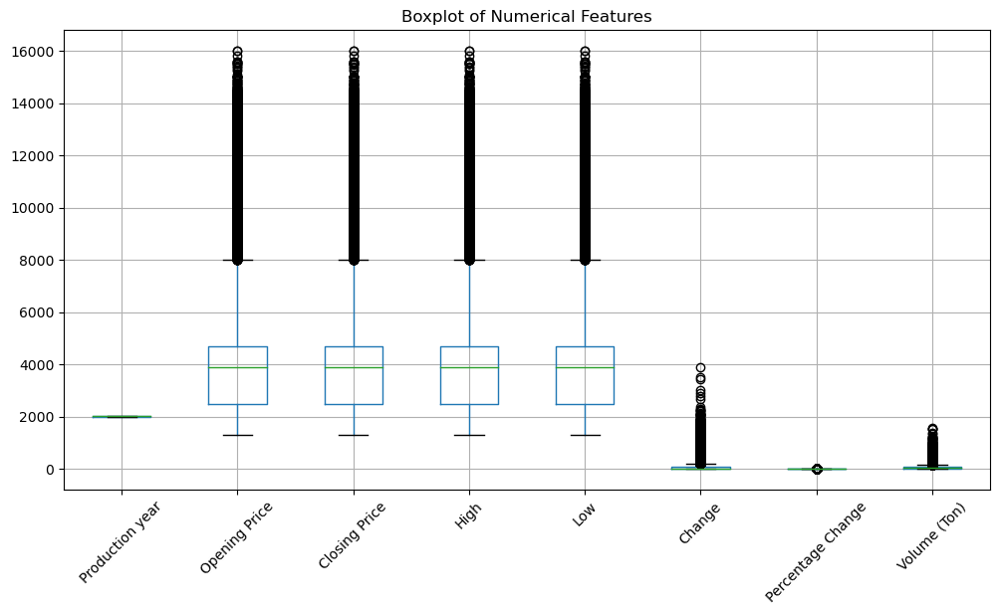

In [27]:
# Visualize boxplots for each numerical feature to identify outliers
plt.figure(figsize=(12, 6))
dataset.boxplot()
plt.title('Boxplot of Numerical Features')
plt.xticks(rotation=45)
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

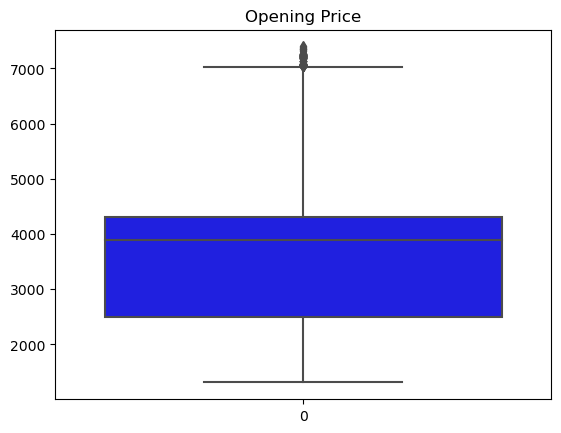

In [28]:
#treat the out lier
for i in dataset['Opening Price']:
    q1=dataset['Opening Price'].quantile(0.25)
    q3=dataset['Opening Price'].quantile(0.75)
    iqr=q3-q1
    lower=q1-1.5*iqr
    higher=q3+1.5*iqr
    if i> higher or i<lower:
        dataset['Opening Price']=dataset['Opening Price'].replace(i,np.median(dataset['Opening Price']))
sns.boxplot(dataset['Opening Price'],color='blue')
plt.title("Opening Price")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

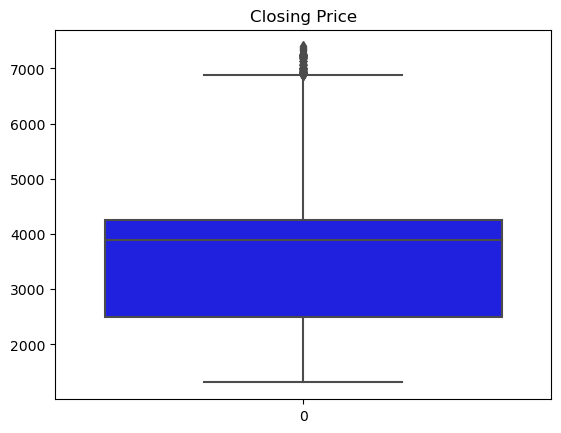

In [29]:
#treat the out lier
for i in dataset['Closing Price']:
    q1=dataset['Closing Price'].quantile(0.25)
    q3=dataset['Closing Price'].quantile(0.75)
    iqr=q3-q1
    lower=q1-1.5*iqr
    higher=q3+1.5*iqr
    if i> higher or i<lower:
        dataset['Closing Price']=dataset['Closing Price'].replace(i,np.median(dataset['Closing Price']))
sns.boxplot(dataset['Closing Price'],color='blue')
plt.title("Closing Price")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

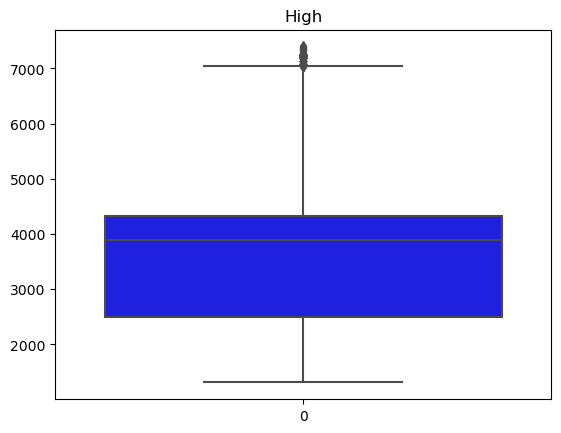

In [30]:
#treat the out lier
for i in dataset['High']:
    q1=dataset['High'].quantile(0.25)
    q3=dataset['High'].quantile(0.75)
    iqr=q3-q1
    lower=q1-1.5*iqr
    higher=q3+1.5*iqr
    if i> higher or i<lower:
        dataset['High']=dataset['High'].replace(i,np.median(dataset['High']))
sns.boxplot(dataset['High'],color='blue')
plt.title("High")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

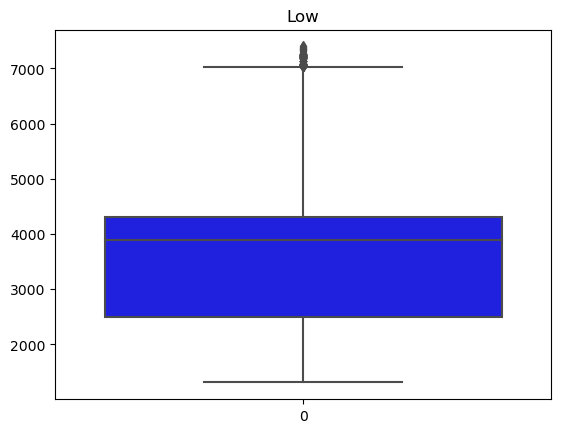

In [31]:
#treat the out lier
for i in dataset['Low']:
    q1=dataset['Low'].quantile(0.25)
    q3=dataset['Low'].quantile(0.75)
    iqr=q3-q1
    lower=q1-1.5*iqr
    higher=q3+1.5*iqr
    if i> higher or i<lower:
        dataset['Low']=dataset['Low'].replace(i,np.median(dataset['Low']))
sns.boxplot(dataset['Low'],color='blue')
plt.title("Low")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

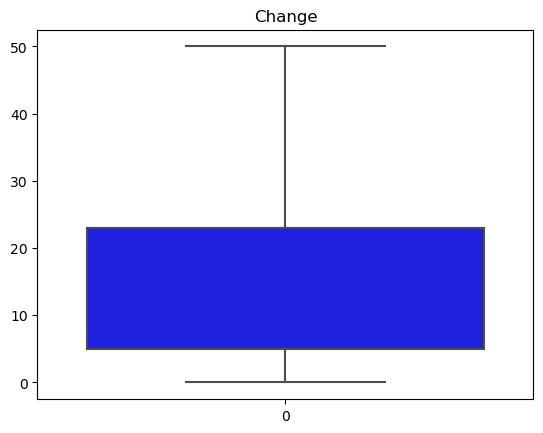

In [32]:
#treat the out lier
for i in dataset['Change']:
    q1=dataset['Change'].quantile(0.25)
    q3=dataset['Change'].quantile(0.75)
    iqr=q3-q1
    lower=q1-1.5*iqr
    higher=q3+1.5*iqr
    if i> higher or i<lower:
        dataset['Change']=dataset['Change'].replace(i,np.median(dataset['Change']))
sns.boxplot(dataset['Change'],color='blue')
plt.title("Change")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

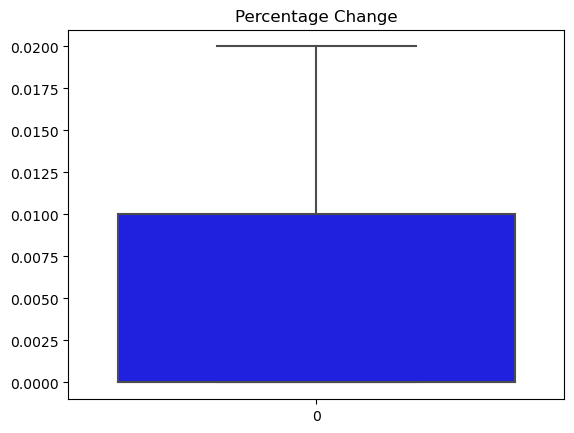

In [33]:
#treat the out lier
for i in dataset['Percentage Change']:
    q1=dataset['Percentage Change'].quantile(0.25)
    q3=dataset['Percentage Change'].quantile(0.75)
    iqr=q3-q1
    lower=q1-1.5*iqr
    higher=q3+1.5*iqr
    if i> higher or i<lower:
        dataset['Percentage Change']=dataset['Percentage Change'].replace(i,np.median(dataset['Percentage Change']))
sns.boxplot(dataset['Percentage Change'],color='blue')
plt.title("Percentage Change")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

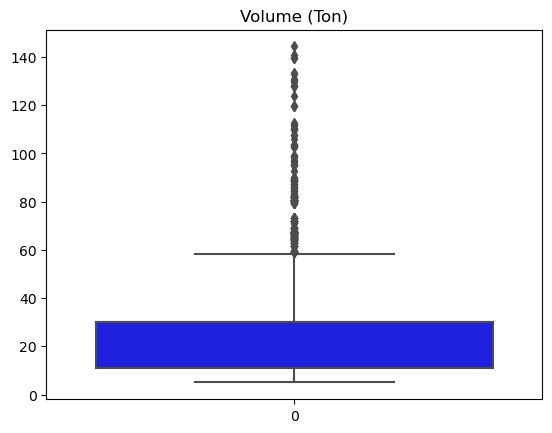

In [34]:
#treat the out lier
for i in dataset['Volume (Ton)']:
    q1=dataset['Volume (Ton)'].quantile(0.25)
    q3=dataset['Volume (Ton)'].quantile(0.75)
    iqr=q3-q1
    lower=q1-1.5*iqr
    higher=q3+1.5*iqr
    if i> higher or i<lower:
        dataset['Volume (Ton)']=dataset['Volume (Ton)'].replace(i,np.median(dataset['Volume (Ton)']))
sns.boxplot(dataset['Volume (Ton)'],color='blue')
plt.title("Volume (Ton)")
plt.show

# Feature Engineering

In [ ]:
# we have separated the Trade Date features to Day, Month, and Year to easily analyse the price movement

In [35]:
dataset['Year'] = dataset.index.year
dataset['Month'] = dataset.index.month
dataset['Day'] = dataset.index.day

In [36]:
# Create new features or transform existing ones
# Example: Create a new feature 'Price Change' as the difference between Closing Price and Opening Price
#dataset['Price Change'] = dataset['Closing Price'] - dataset['Opening Price']

In [37]:
dataset.shape

(35820, 13)

# Exploratory data analysis

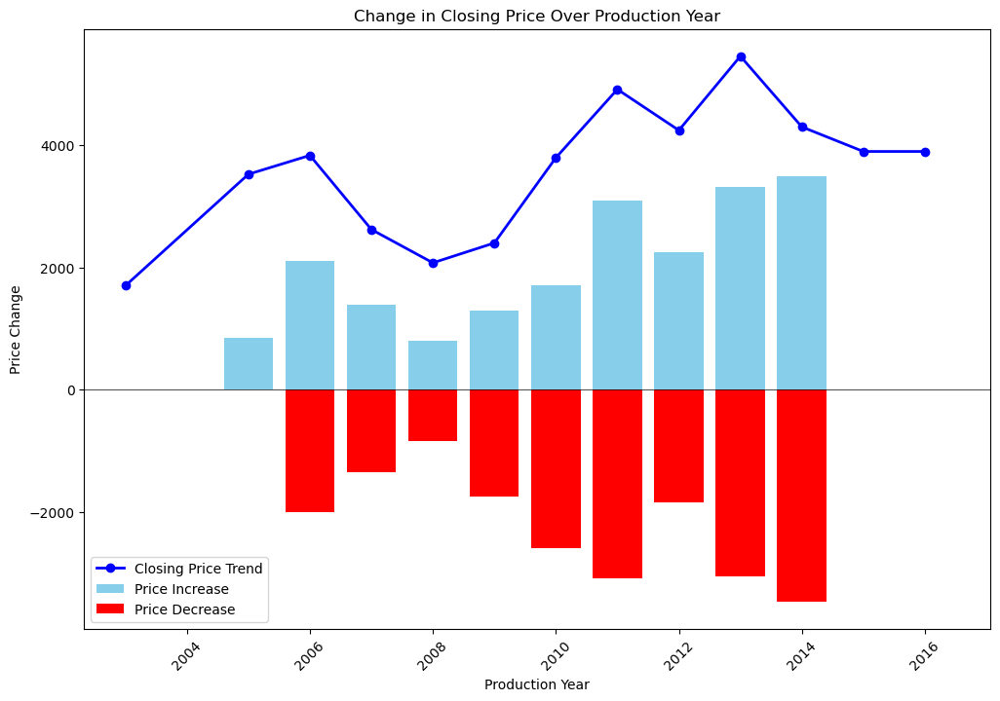

In [38]:
# Assuming 'dataset' contains the DataFrame with the dataset
# Calculate the difference in closing price between consecutive years
dataset['Price Change'] = dataset.groupby('Production year')['Closing Price'].diff()
# Initialize the figure
plt.figure(figsize=(12, 8))
# Plot bars for increase in closing price (above y-axis)
plt.bar(dataset['Production year'], np.maximum(0, dataset['Price Change']), color='skyblue', label='Price Increase')
# Plot bars for decrease in closing price (below y-axis)
plt.bar(dataset['Production year'], np.minimum(0, dataset['Price Change']), color='red', label='Price Decrease')
# Plot line plot showing closing price trend
plt.plot(dataset.groupby('Production year')['Closing Price'].mean().index, 
         dataset.groupby('Production year')['Closing Price'].mean().values, 
         color='blue', marker='o', linestyle='-', linewidth=2, label='Closing Price Trend')
# Add a horizontal line at y=0 for reference
plt.axhline(0, color='black', linewidth=0.5)
# Set the title and labels
plt.title('Change in Closing Price Over Production Year')
plt.xlabel('Production Year')
plt.ylabel('Price Change')
plt.xticks(rotation=45)
plt.legend()
# Show plot
plt.show()

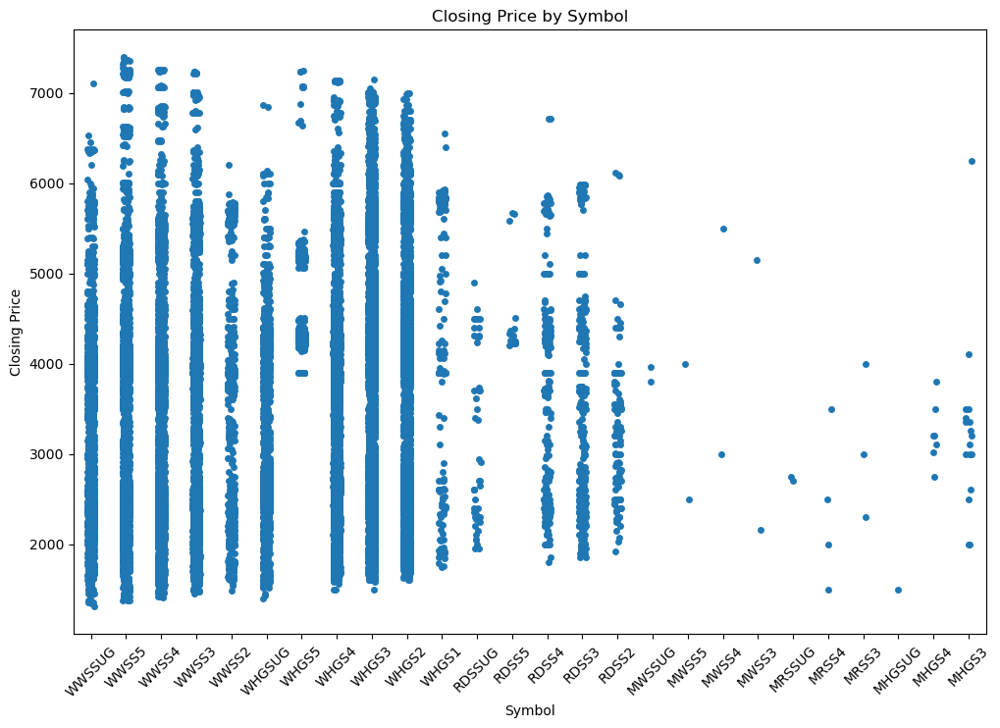

In [39]:
# Plot scatter plot of Symbol vs. Closing Price
plt.figure(figsize=(12, 8))
sns.stripplot(x='Symbol', y='Closing Price', data=dataset, jitter=True)
plt.title('Closing Price by Symbol')
plt.xlabel('Symbol')
plt.ylabel('Closing Price')
plt.xticks(rotation=45)
plt.show()

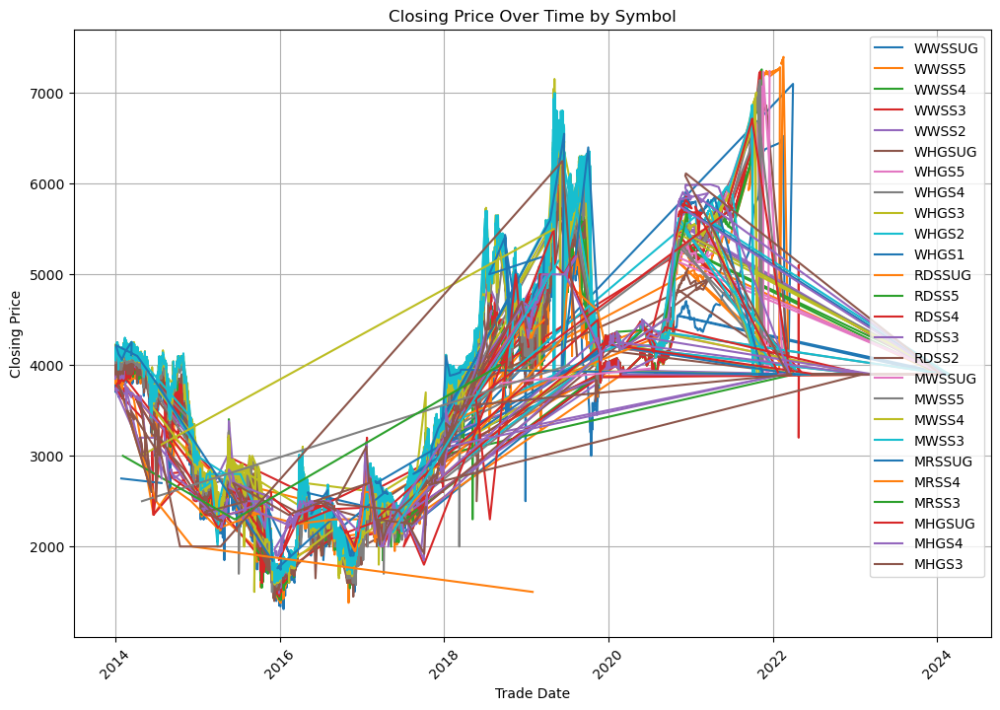

In [40]:
# Plot line plot of Closing Price over time for each Symbol
plt.figure(figsize=(12, 8))

# Iterate over unique symbols
for symbol in dataset['Symbol'].unique():
    symbol_data = dataset[dataset['Symbol'] == symbol]
    plt.plot(symbol_data.index, symbol_data['Closing Price'], label=symbol)

plt.title('Closing Price Over Time by Symbol')
plt.xlabel('Trade Date')
plt.ylabel('Closing Price')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

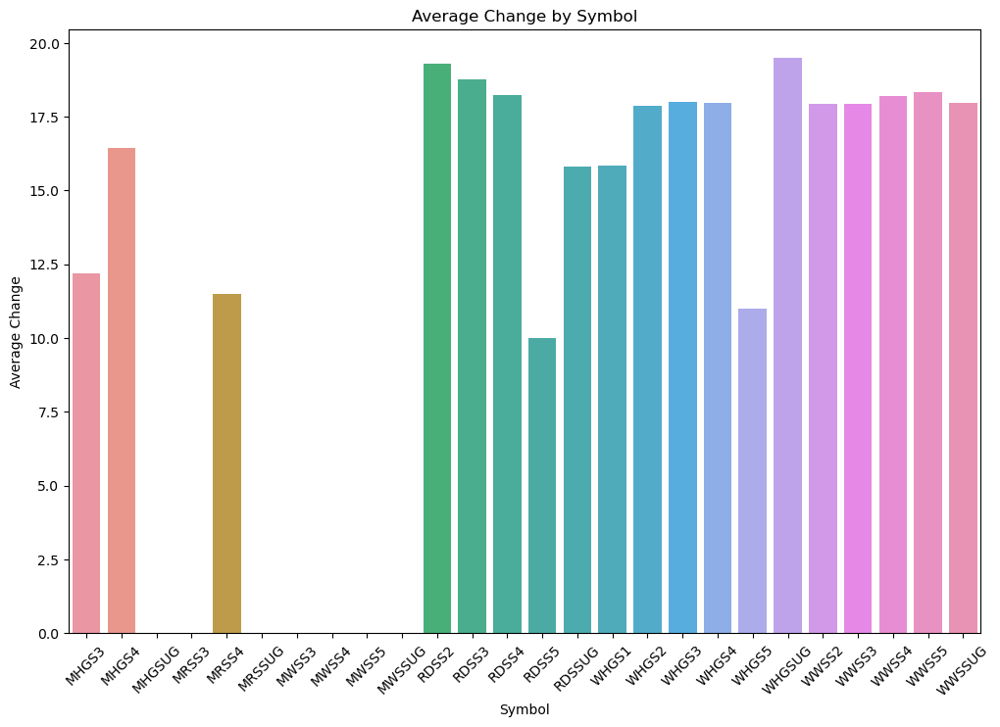

In [41]:
# Calculate the average change for each symbol
average_change = dataset.groupby('Symbol')['Change'].mean().reset_index()

# Plot bar plot of Symbol vs. Average Change
plt.figure(figsize=(12, 8))
sns.barplot(x='Symbol', y='Change', data=average_change)
plt.title('Average Change by Symbol')
plt.xlabel('Symbol')
plt.ylabel('Average Change')
plt.xticks(rotation=45)
plt.show()

Text(0.5, 1.0, 'Low')

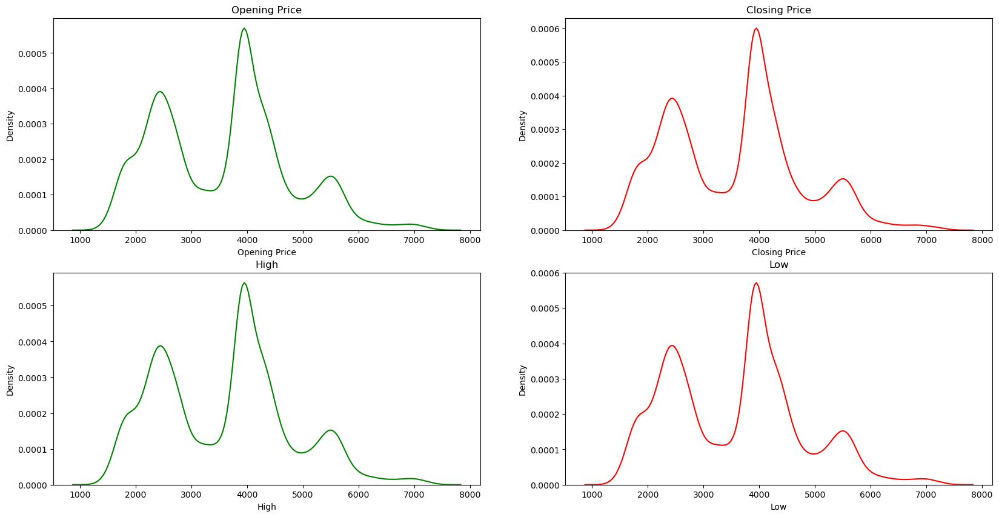

In [42]:
# KDE-Plots(kernal density estimation)
plt.figure(figsize=(20,10))
#Plot 1
plt.subplot(2,2,1)
sns.kdeplot(dataset['Opening Price'], color='green')
plt.title('Opening Price')
#Plot 2
plt.subplot(2,2,2)
sns.kdeplot(dataset['Closing Price'], color='red')
plt.title('Closing Price')
#Plot 3
plt.subplot(2,2,3)
sns.kdeplot(dataset['High'], color='green')
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
sns.kdeplot(dataset['Low'], color='red')
plt.title('Low')

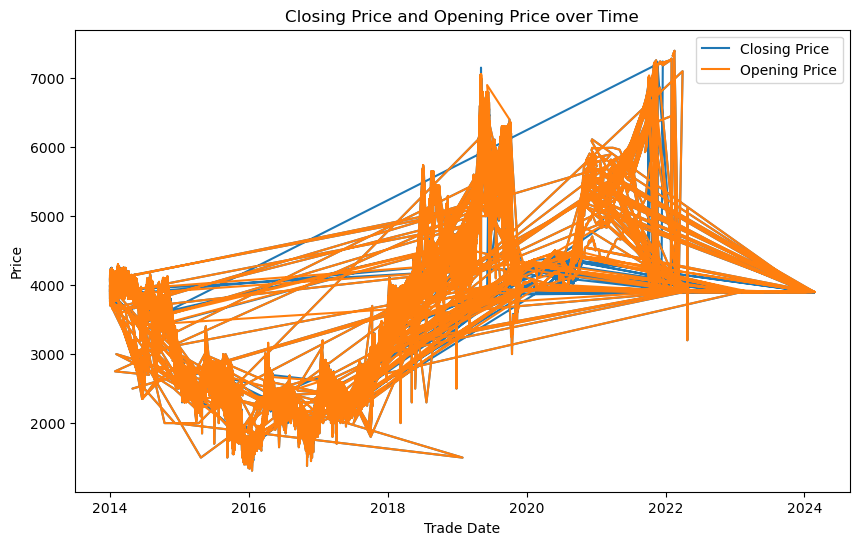

In [43]:
# Line plot for 'Closing Price' and 'Opening Price' over time
plt.figure(figsize=(10, 6))
plt.plot(dataset.index, dataset['Closing Price'], label='Closing Price')
plt.plot(dataset.index, dataset['Opening Price'], label='Opening Price')
plt.title('Closing Price and Opening Price over Time')
plt.xlabel('Trade Date')
plt.ylabel('Price')
plt.legend()
plt.show()

Text(0.5, 1.0, 'Low')

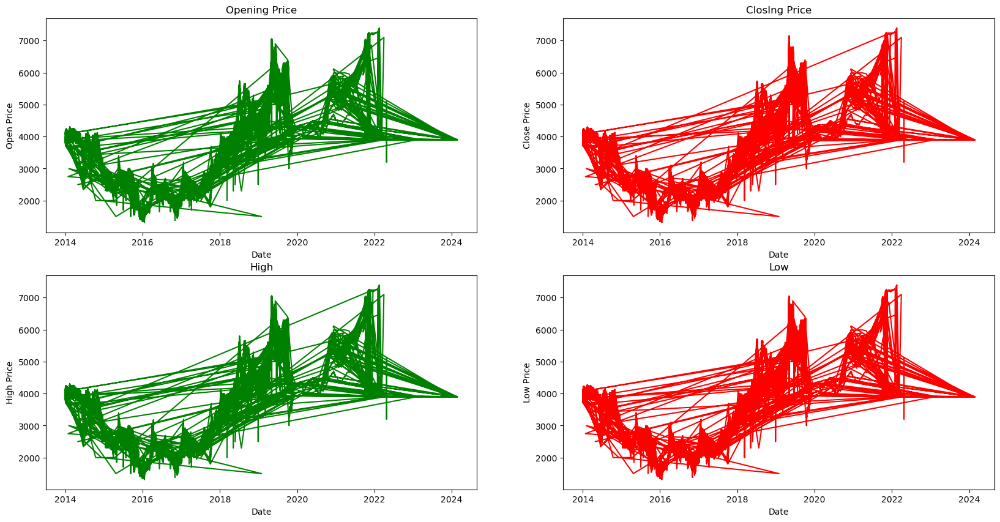

In [44]:
plt.figure(figsize=(20,10))
#Plot 1
plt.subplot(2,2,1)
plt.plot(dataset['Opening Price'],color='green')
plt.xlabel('Date')
plt.ylabel('Open Price')
plt.title('Opening Price')
#Plot 2
plt.subplot(2,2,2)
plt.plot(dataset['Closing Price'],color='red')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('ClosIng Price')
#Plot 3
plt.subplot(2,2,3)
plt.plot(dataset['High'],color='green')
plt.xlabel('Date')
plt.ylabel('High Price')
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
plt.plot(dataset['Low'],color='red')
plt.xlabel('Date')
plt.ylabel('Low Price')
plt.title('Low')

Text(0.5, 1.0, 'Low')

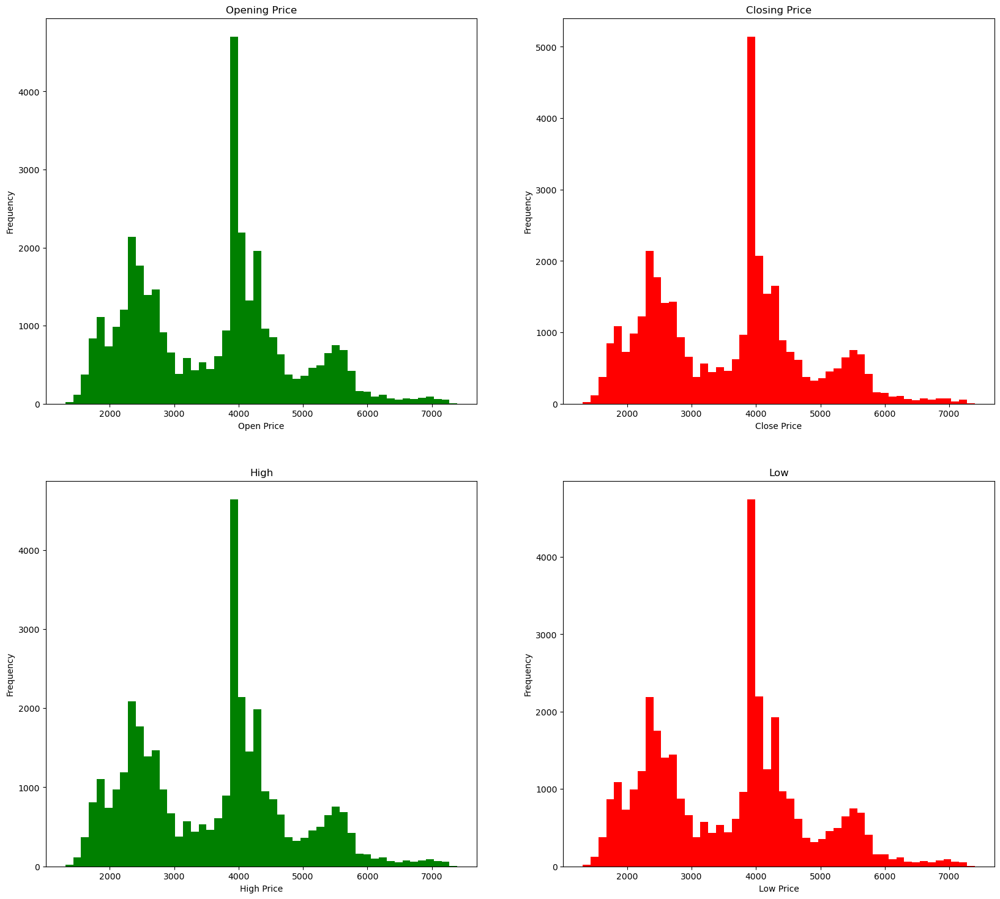

In [45]:
# Ploting Histogram
plt.figure(figsize=(20,18))
#Plot 1
plt.subplot(2,2,1)
plt.hist(dataset['Opening Price'],bins=50, color='green')
plt.xlabel("Open Price")
plt.ylabel("Frequency")
plt.title('Opening Price')
#Plot 2
plt.subplot(2,2,2)
plt.hist(dataset['Closing Price'],bins=50, color='red')
plt.xlabel("Close Price")
plt.ylabel("Frequency")
plt.title('Closing Price')
#Plot 3
plt.subplot(2,2,3)
plt.hist(dataset['High'],bins=50, color='green')
plt.xlabel("High Price")
plt.ylabel("Frequency")
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
plt.hist(dataset['Low'],bins=50, color='red')
plt.xlabel("Low Price")
plt.ylabel("Frequency")
plt.title('Low')

C:\Users\Belayneh\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


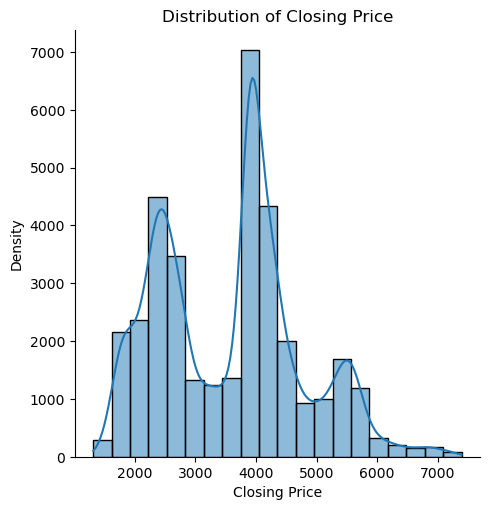

In [46]:
# Using displot (recommended for distribution plots)
sns.displot(dataset['Closing Price'], kde=True, bins=20)
plt.title('Distribution of Closing Price')
plt.xlabel('Closing Price')
plt.ylabel('Density')
plt.show()

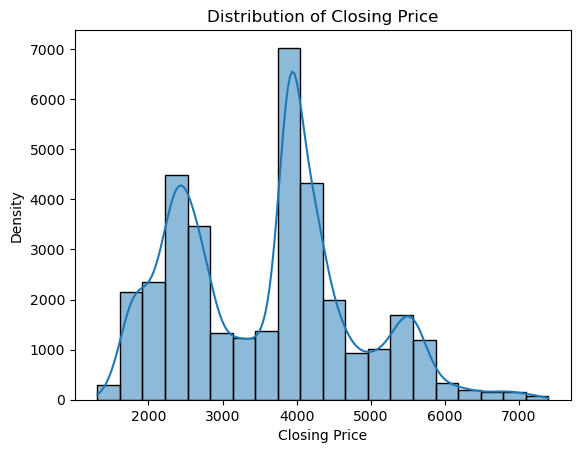

In [47]:
# Or using histplot
sns.histplot(dataset['Closing Price'], kde=True, bins=20)
plt.title('Distribution of Closing Price')
plt.xlabel('Closing Price')
plt.ylabel('Density')
plt.show()

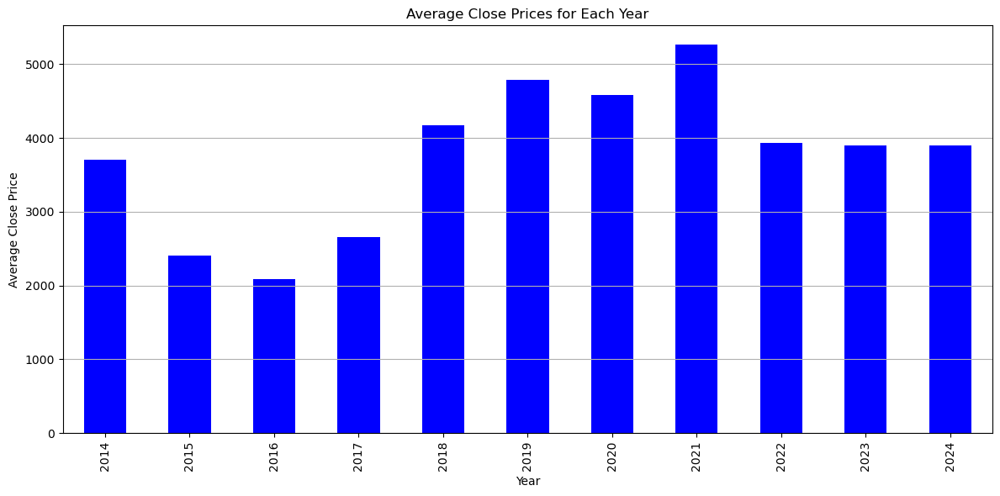

In [48]:
# Extract the year from the 'Date' column and create a new 'Year' column
#df['Year'] = pd.to_datetime(df['Date']).dt.year
# Group data by 'Year' and calculate the mean CLOSE for each year
yearly_mean_close = dataset.groupby('Year')['Closing Price'].mean()
# Create a bar chart for 'Year' vs. 'CLOSE'
plt.figure(figsize=(12, 6))
yearly_mean_close.plot(kind='bar', color='blue')
plt.title('Average Close Prices for Each Year')
plt.xlabel('Year')
plt.ylabel('Average Close Price')
plt.grid(axis='y')
# Show the plot
plt.tight_layout()
plt.show()

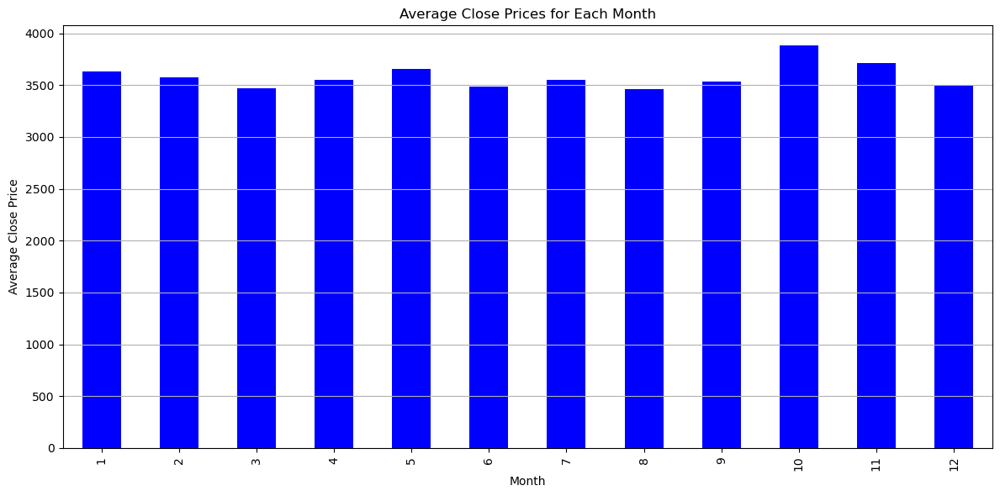

In [49]:
# Extract the year from the 'Date' column and create a new 'Year' column
#df['Year'] = pd.to_datetime(df['Date']).dt.year
# Group data by 'Year' and calculate the mean CLOSE for each year
yearly_mean_close = dataset.groupby('Month')['Closing Price'].mean()
# Create a bar chart for 'Year' vs. 'CLOSE'
plt.figure(figsize=(12, 6))
yearly_mean_close.plot(kind='bar', color='blue')
plt.title('Average Close Prices for Each Month')
plt.xlabel('Month')
plt.ylabel('Average Close Price')
plt.grid(axis='y')
# Show the plot
plt.tight_layout()
plt.show()

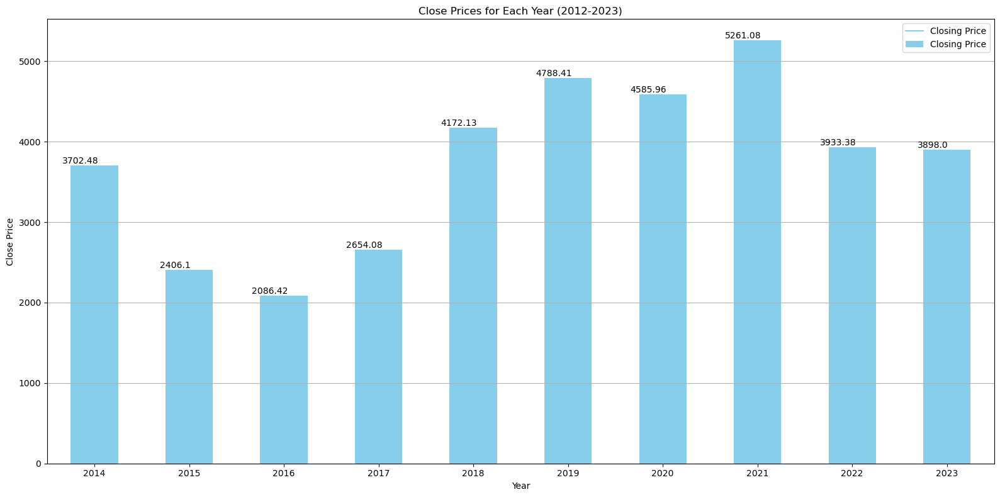

In [50]:
# Extract the year from the 'Date' column and create a new 'Year' column
#df['Year'] = pd.to_datetime(df['Date']).dt.year
# Filter the DataFrame to include data only for the years 2012 to 2023
df_filtered = dataset[(dataset['Year'] >= 2012) & (dataset['Year'] <= 2023)]

# Group data by 'Year' and calculate the mean CLOSE for each year
yearly_mean_close = df_filtered.groupby('Year')['Closing Price'].mean()

# Create a bar chart for 'Year' vs. 'CLOSE' (average close prices)
plt.figure(figsize=(16, 8))
bars = yearly_mean_close.plot(kind='bar', color='Skyblue')
line = yearly_mean_close.plot(kind='line', color='Skyblue')

# Add value annotations on top of each bar
for bar, value in zip(bars.patches, yearly_mean_close):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.15, value + 1, str(round(value, 2)), ha='center', va='bottom', fontsize=10)
plt.title('Close Prices for Each Year (2012-2023)')
plt.xlabel('Year')
plt.ylabel('Close Price')
plt.grid(axis='y')
plt.legend()
# Show the plot
plt.tight_layout()
plt.show()

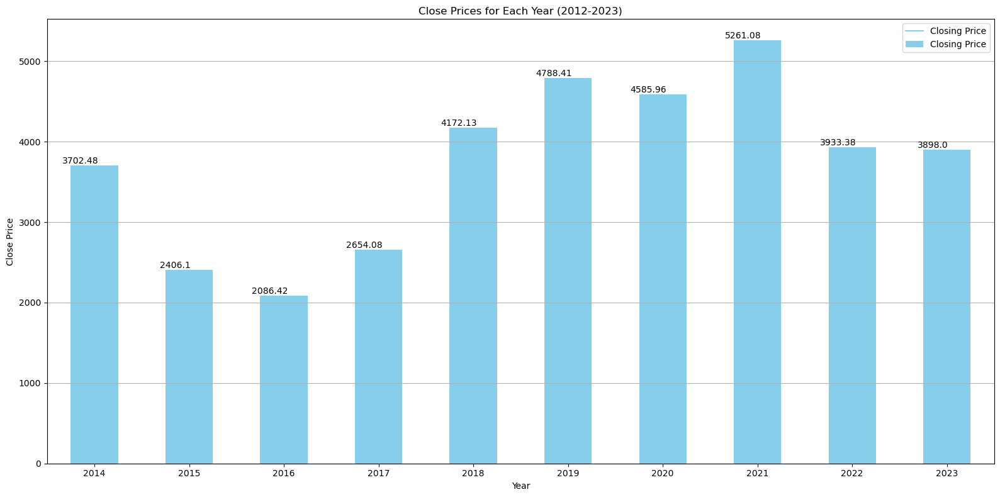

In [51]:
# Extract the year from the 'Date' column and create a new 'Year' column
#df['Year'] = pd.to_datetime(df['Date']).dt.year

# Filter the DataFrame to include data only for the years 2012 to 2023
df_filtered = dataset[(dataset['Year'] >= 2012) & (dataset['Year'] <= 2023)]

# Group data by 'Year' and calculate the mean CLOSE for each year
yearly_mean_close = df_filtered.groupby('Year')['Closing Price'].mean()

# Create a bar chart for 'Year' vs. 'CLOSE' (average close prices)
plt.figure(figsize=(16, 8))
bars = yearly_mean_close.plot(kind='bar', color='Skyblue')
line = yearly_mean_close.plot(kind='line', color='Skyblue')

# Add value annotations on top of each bar
for bar, value in zip(bars.patches, yearly_mean_close):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.15, value + 1, str(round(value, 2)), ha='center', va='bottom', fontsize=10)
plt.title('Close Prices for Each Year (2012-2023)')
plt.xlabel('Year')
plt.ylabel('Close Price')
plt.grid(axis='y')
plt.legend()
# Show the plot
plt.tight_layout()
plt.show()

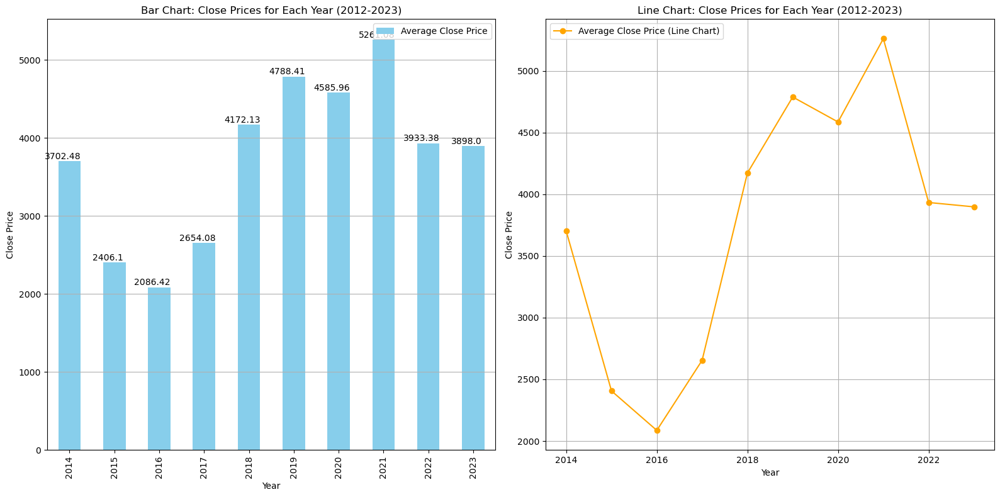

In [52]:
# Create a figure with two subplots (1 row, 2 columns)
plt.figure(figsize=(16, 8))
# Subplot 1: Bar chart
plt.subplot(1, 2, 1)
bars = yearly_mean_close.plot(kind='bar', color='Skyblue', label='Average Close Price')

# Add value annotations on top of each bar
for bar, value in zip(bars.patches, yearly_mean_close):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.15, value + 1, str(round(value, 2)), ha='center', va='bottom', fontsize=10)

plt.title('Bar Chart: Close Prices for Each Year (2012-2023)')
plt.xlabel('Year')
plt.ylabel('Close Price')
plt.grid(axis='y')
plt.legend()

# Subplot 2: Line chart
plt.subplot(1, 2, 2)
yearly_mean_close.plot(kind='line', color='Orange', marker='o', label='Average Close Price (Line Chart)')

plt.title('Line Chart: Close Prices for Each Year (2012-2023)')
plt.xlabel('Year')
plt.ylabel('Close Price')
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

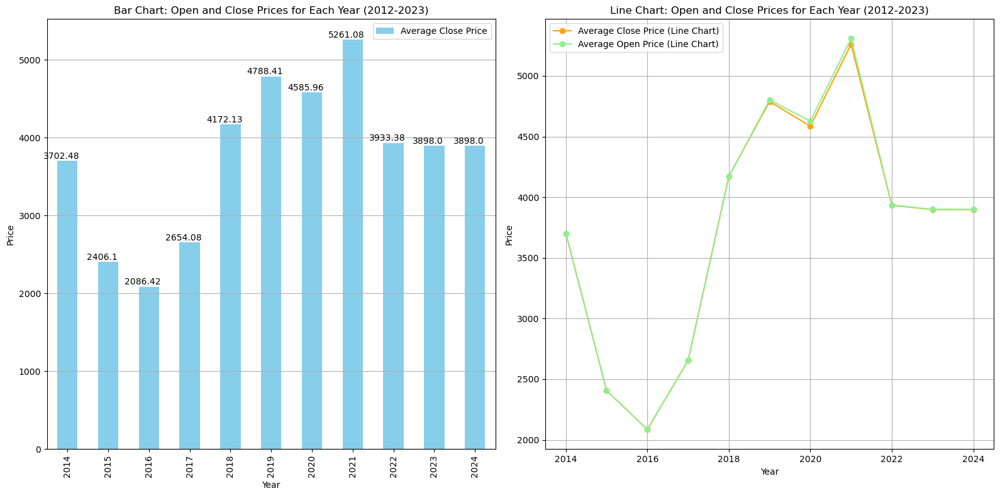

In [53]:
# Extracting year from datetime index and creating a new column
dataset['Year'] = dataset.index.year

# Filter the DataFrame to include data only for the years 2012 to 2023
df_filtered = dataset[(dataset['Year'] >= 2012) & (dataset['Year'] <= 2024)]

# Group data by 'Year' and calculate the mean CLOSE for each year
yearly_mean_close = df_filtered.groupby('Year')['Closing Price'].mean()

# Group data by 'Year' and calculate the mean OPEN for each year
yearly_mean_open = df_filtered.groupby('Year')['Opening Price'].mean()

# Create a figure with two subplots (1 row, 2 columns)
plt.figure(figsize=(16, 8))

# Subplot 1: Bar chart for Close Prices
plt.subplot(1, 2, 1)
bars_close = yearly_mean_close.plot(kind='bar', color='Skyblue', label='Average Close Price')

# Add value annotations on top of each bar for Close Prices
for bar, value in zip(bars_close.patches, yearly_mean_close):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.15, value + 1, str(round(value, 2)), ha='center', va='bottom', fontsize=10)

plt.title('Bar Chart: Open and Close Prices for Each Year (2012-2023)')
plt.xlabel('Year')
plt.ylabel('Price')
plt.grid(axis='y')
plt.legend()

# Subplot 2: Line chart for Close Prices
plt.subplot(1, 2, 2)
yearly_mean_close.plot(kind='line', color='Orange', marker='o', label='Average Close Price (Line Chart)')

# Line chart for Opening Prices
yearly_mean_open.plot(kind='line', color='Lightgreen', marker='o', label='Average Open Price (Line Chart)')

plt.title('Line Chart: Open and Close Prices for Each Year (2012-2023)')
plt.xlabel('Year')
plt.ylabel('Price')
plt.grid(True)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


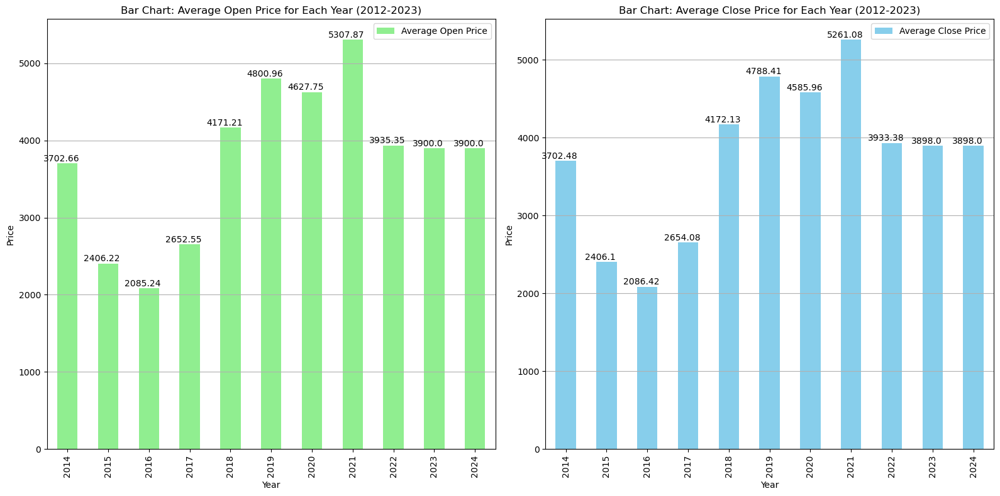

In [54]:
import matplotlib.pyplot as plt

# Calculate yearly mean opening and closing prices
yearly_mean_open = dataset.groupby('Year')['Opening Price'].mean()
yearly_mean_close = dataset.groupby('Year')['Closing Price'].mean()

# Create a figure with two separate plots
plt.figure(figsize=(16, 8))

# Plot 1: Bar chart for yearly mean opening prices
plt.subplot(1, 2, 1)
bars_open = yearly_mean_open.plot(kind='bar', color='Lightgreen', label='Average Open Price')

# Add value annotations on top of each bar
for bar, value in zip(bars_open.patches, yearly_mean_open):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.15, value + 1, str(round(value, 2)), ha='center', va='bottom', fontsize=10)

plt.title('Bar Chart: Average Open Price for Each Year (2012-2023)')
plt.xlabel('Year')
plt.ylabel('Price')
plt.grid(axis='y')
plt.legend()

# Plot 2: Bar chart for yearly mean closing prices
plt.subplot(1, 2, 2)
bars_close = yearly_mean_close.plot(kind='bar', color='Skyblue', label='Average Close Price')

# Add value annotations on top of each bar
for bar, value in zip(bars_close.patches, yearly_mean_close):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.15, value + 1, str(round(value, 2)), ha='center', va='bottom', fontsize=10)

plt.title('Bar Chart: Average Close Price for Each Year (2012-2023)')
plt.xlabel('Year')
plt.ylabel('Price')
plt.grid(axis='y')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
# Research Question 1: Analyze daily price movements

In [ ]:
# Calculate daily price movements
daily_movements = daily_prices.diff()
# Plot daily price movements
daily_movements.plot(figsize=(10, 6), title='Daily Price Movements')
plt.ylabel('Price Movement')
plt.xlabel('Trade Date')
plt.show()

In [ ]:
# Group by trade date and calculate mean for each price
daily_prices = dataset.groupby('Trade Date')[['Opening Price', 'Closing Price', 'High', 'Low']].mean()
# Plot daily price movements
daily_prices.plot(figsize=(10, 6), title='Daily Price Movements')
plt.ylabel('Price')
plt.xlabel('Trade Date')
plt.show()

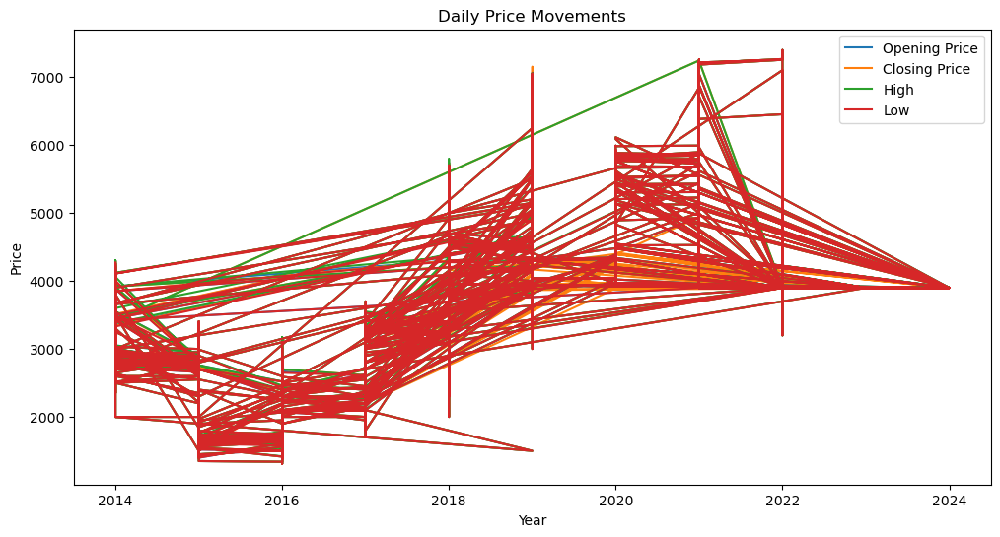

In [55]:
plt.figure(figsize=(12, 6))
plt.plot(dataset['Year'], dataset['Opening Price'], label='Opening Price')
plt.plot(dataset['Year'], dataset['Closing Price'], label='Closing Price')
plt.plot(dataset['Year'], dataset['High'], label='High')
plt.plot(dataset['Year'], dataset['Low'], label='Low')
plt.title('Daily Price Movements')
plt.xlabel('Year')
plt.ylabel('Price')
plt.legend()
plt.show()

In [ ]:
# Research Question 2: Analyze the overall time trend

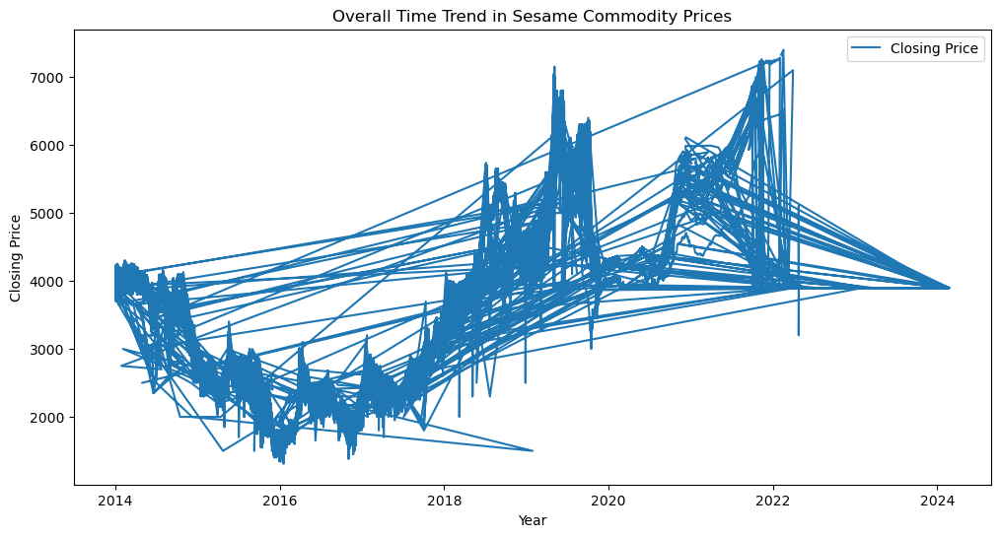

In [56]:
plt.figure(figsize=(12, 6))
plt.plot(dataset['Closing Price'], label='Closing Price')
plt.title('Overall Time Trend in Sesame Commodity Prices')
plt.xlabel('Year')
plt.ylabel('Closing Price')
plt.legend()
plt.show()

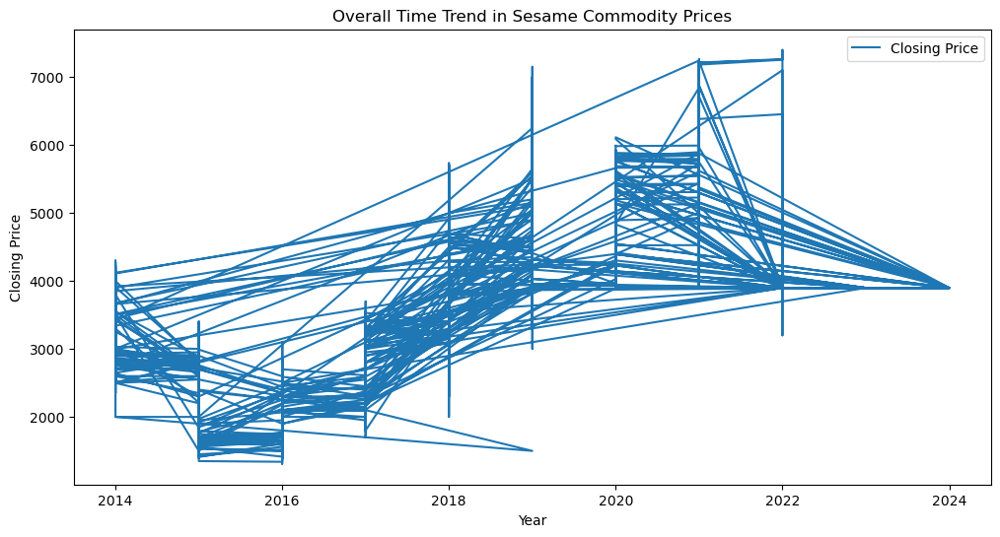

In [57]:
plt.figure(figsize=(12, 6))
plt.plot(dataset['Year'], dataset['Closing Price'], label='Closing Price')
plt.title('Overall Time Trend in Sesame Commodity Prices')
plt.xlabel('Year')
plt.ylabel('Closing Price')
plt.legend()
plt.show()

In [61]:
# 2. Relationship between production year and prices

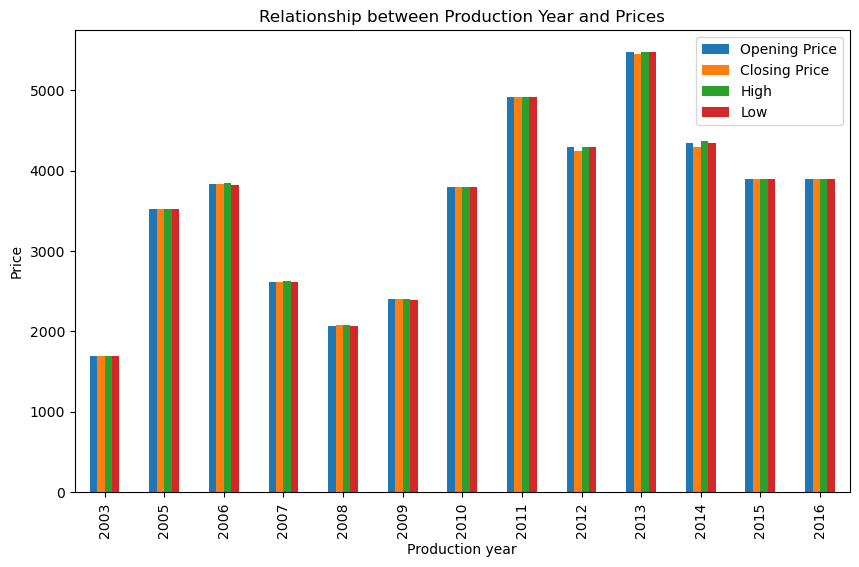

In [62]:
# Group by production year and calculate mean price
yearly_prices = dataset.groupby('Production year')[['Opening Price', 'Closing Price', 'High', 'Low']].mean()

# Plot relationship between production year and prices
yearly_prices.plot(kind='bar', figsize=(10, 6), title='Relationship between Production Year and Prices')
plt.ylabel('Price')
plt.xlabel('Production year')
plt.show()

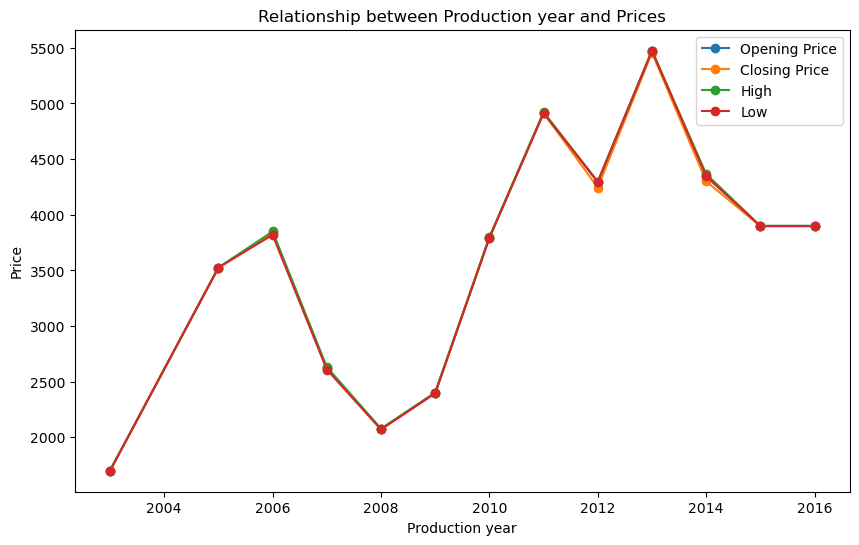

In [63]:
# Plot relationship between production year and prices
plt.figure(figsize=(10, 6))
plt.plot(yearly_prices.index, yearly_prices['Opening Price'], marker='o', label='Opening Price')
plt.plot(yearly_prices.index, yearly_prices['Closing Price'], marker='o', label='Closing Price')
plt.plot(yearly_prices.index, yearly_prices['High'], marker='o', label='High')
plt.plot(yearly_prices.index, yearly_prices['Low'], marker='o', label='Low')
plt.title('Relationship between Production year and Prices')
plt.xlabel('Production year')
plt.ylabel('Price')
plt.legend()
plt.show()

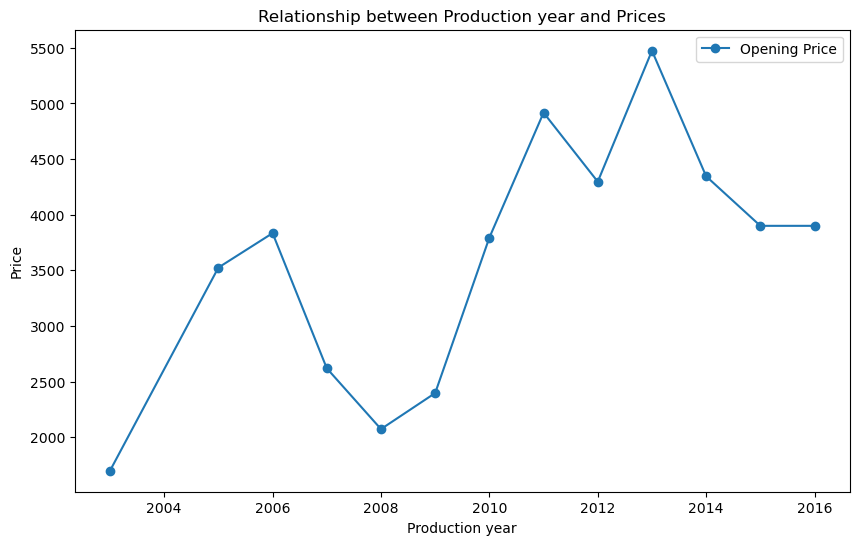

In [64]:
# Plot relationship between production year and prices
plt.figure(figsize=(10, 6))
plt.plot(yearly_prices.index, yearly_prices['Opening Price'], marker='o', label='Opening Price')
plt.title('Relationship between Production year and Prices')
plt.xlabel('Production year')
plt.ylabel('Price')
plt.legend()
plt.show()

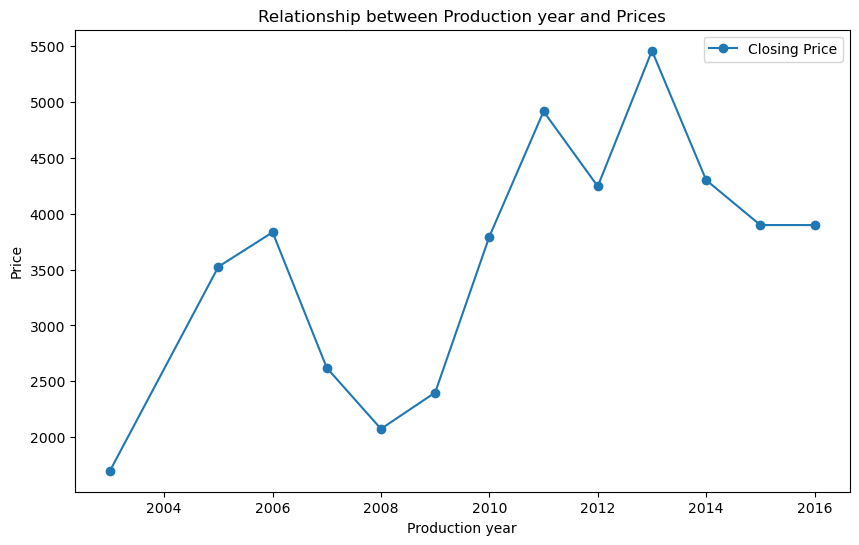

In [65]:
# Plot relationship between production year and prices
plt.figure(figsize=(10, 6))
plt.plot(yearly_prices.index, yearly_prices['Closing Price'], marker='o', label='Closing Price')
plt.title('Relationship between Production year and Prices')
plt.xlabel('Production year')
plt.ylabel('Price')
plt.legend()
plt.show()

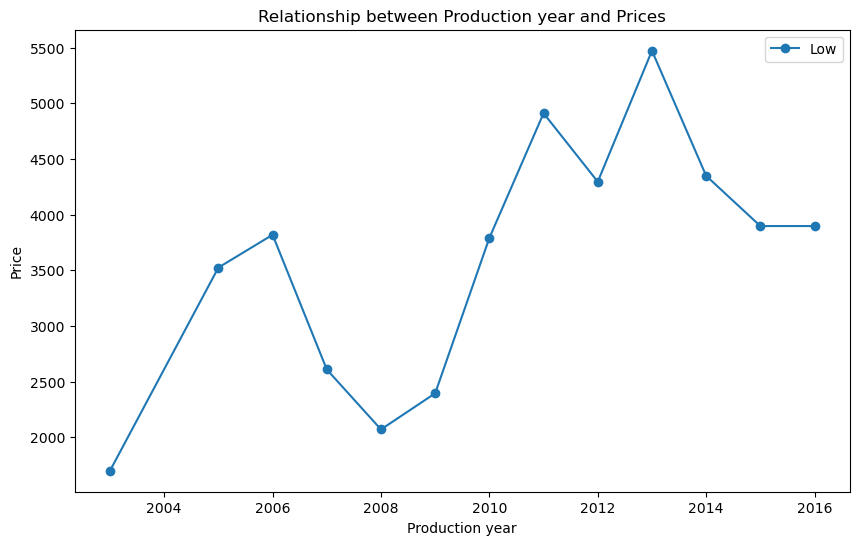

In [66]:
# Plot relationship between production year and prices
plt.figure(figsize=(10, 6))
plt.plot(yearly_prices.index, yearly_prices['Low'], marker='o', label='Low')
plt.title('Relationship between Production year and Prices')
plt.xlabel('Production year')
plt.ylabel('Price')
plt.legend()
plt.show()

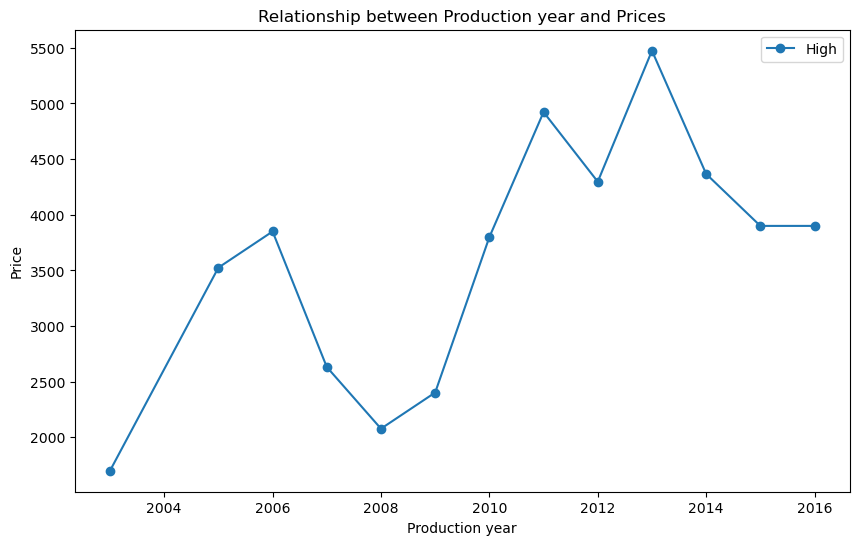

In [67]:
# Plot relationship between production year and prices
plt.figure(figsize=(10, 6))
plt.plot(yearly_prices.index, yearly_prices['High'], marker='o', label='High')
plt.title('Relationship between Production year and Prices')
plt.xlabel('Production year')
plt.ylabel('Price')
plt.legend()
plt.show()

In [68]:
# 3. Impact of warehouse locations on prices

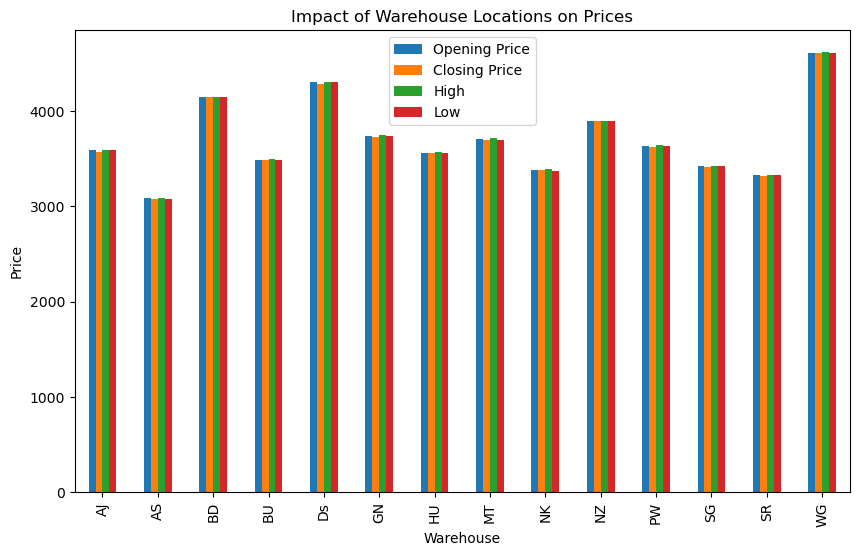

In [69]:
# Group by warehouse and calculate mean price
warehouse_prices = dataset.groupby('Warehouse')[['Opening Price', 'Closing Price', 'High', 'Low']].mean()

# Plot impact of warehouse locations on prices
warehouse_prices.plot(kind='bar', figsize=(10, 6), title='Impact of Warehouse Locations on Prices')
plt.ylabel('Price')
plt.xlabel('Warehouse')
plt.show()

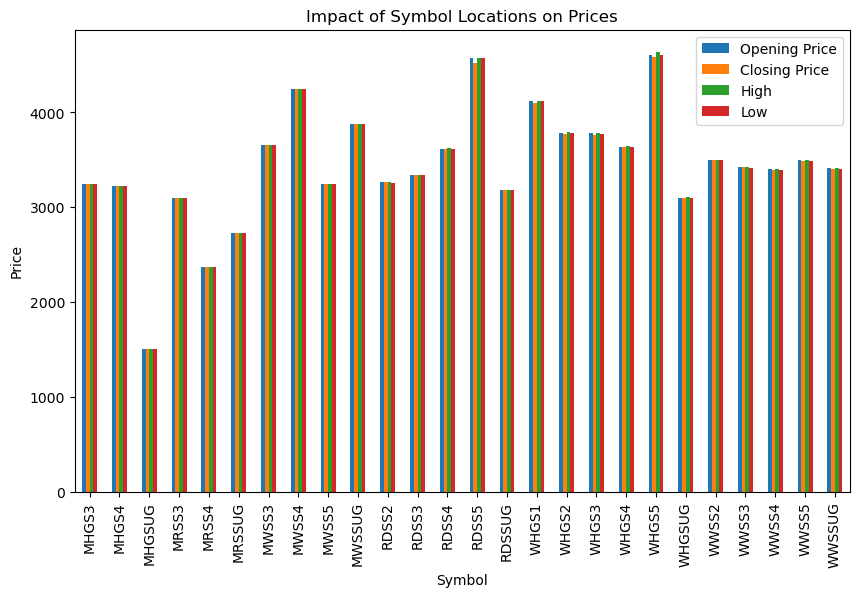

In [71]:
# Group by Symbol and calculate mean price
warehouse_prices = dataset.groupby('Symbol')[['Opening Price', 'Closing Price', 'High', 'Low']].mean()

# Plot impact of warehouse locations on prices
warehouse_prices.plot(kind='bar', figsize=(10, 6), title='Impact of Symbol Locations on Prices')
plt.ylabel('Price')
plt.xlabel('Symbol')
plt.show()

In [72]:
# 4. Overall trading volume trends

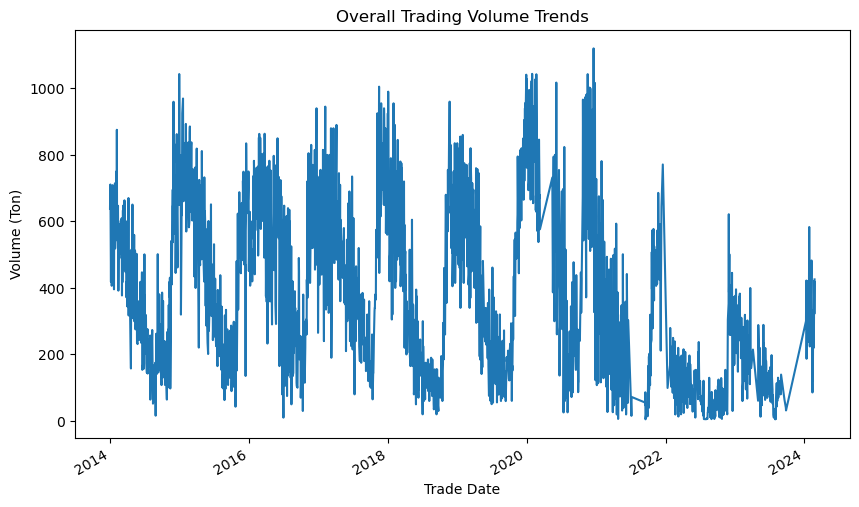

In [73]:
# Group by trade date and sum trading volume
volume_trends = dataset.groupby('Trade Date')['Volume (Ton)'].sum()

# Plot overall trading volume trends
volume_trends.plot(figsize=(10, 6), title='Overall Trading Volume Trends')
plt.ylabel('Volume (Ton)')
plt.xlabel('Trade Date')
plt.show()

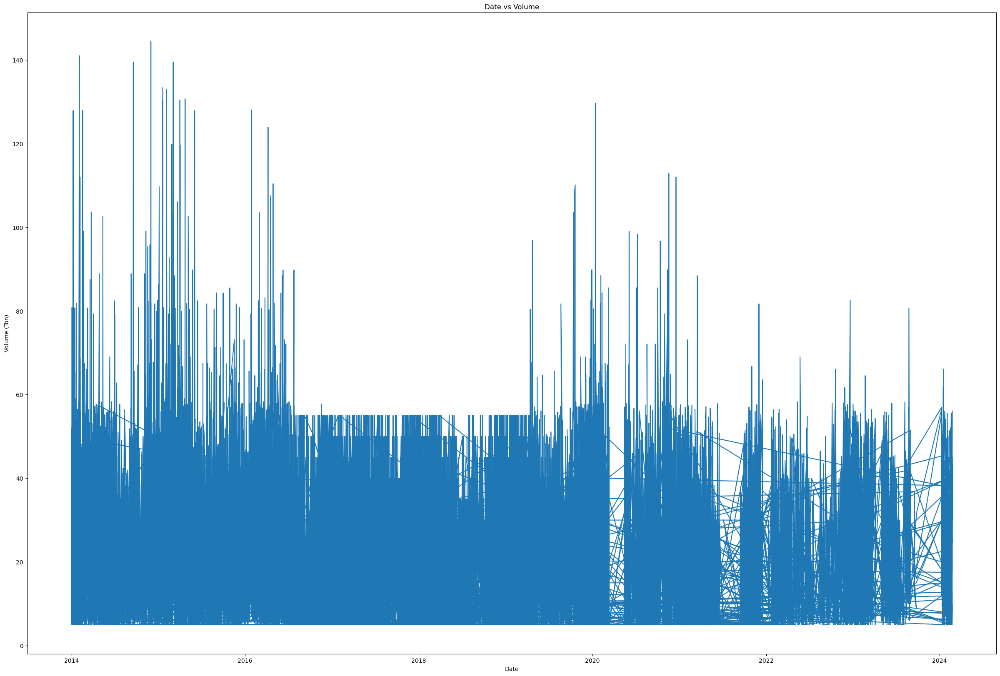

In [74]:
figure=plt.figure(figsize=(30,20))
plt.plot(dataset['Volume (Ton)'])
plt.xlabel('Date')
plt.ylabel('Volume (Ton)')
plt.title('Date vs Volume')
plt.show()

In [75]:
# 5. Identify significant changes or anomalies in prices

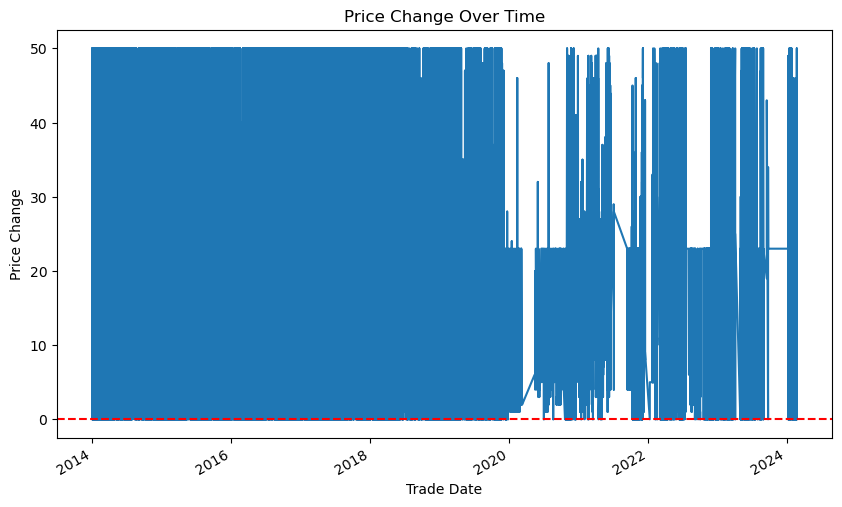

In [76]:
# Plot price change over time
dataset['Change'].plot(figsize=(10, 6), title='Price Change Over Time')
plt.ylabel('Price Change')
plt.xlabel('Trade Date')
plt.axhline(0, color='red', linestyle='--')  # Add a horizontal line at y=0 for reference
plt.show()

In [77]:
# 6. Percentage change in prices

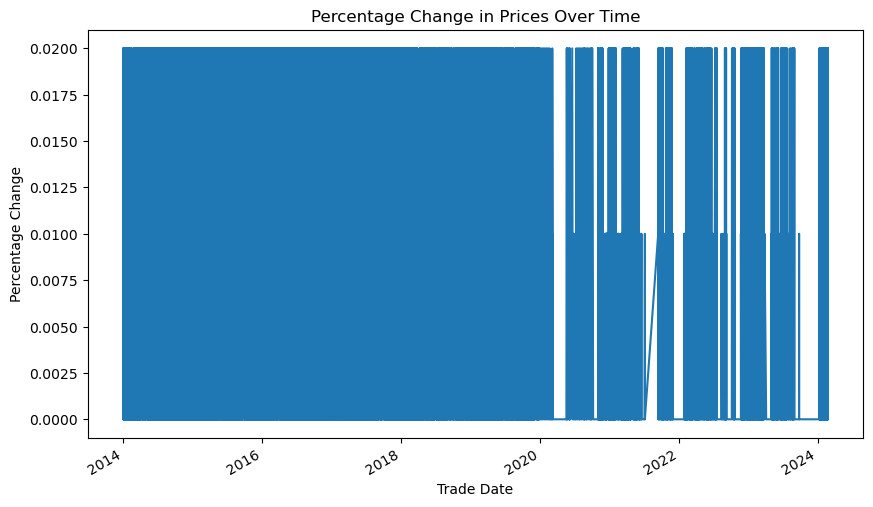

In [78]:
# Plot percentage change over time
dataset['Percentage Change'].plot(figsize=(10, 6), title='Percentage Change in Prices Over Time')
plt.ylabel('Percentage Change')
plt.xlabel('Trade Date')
plt.show()

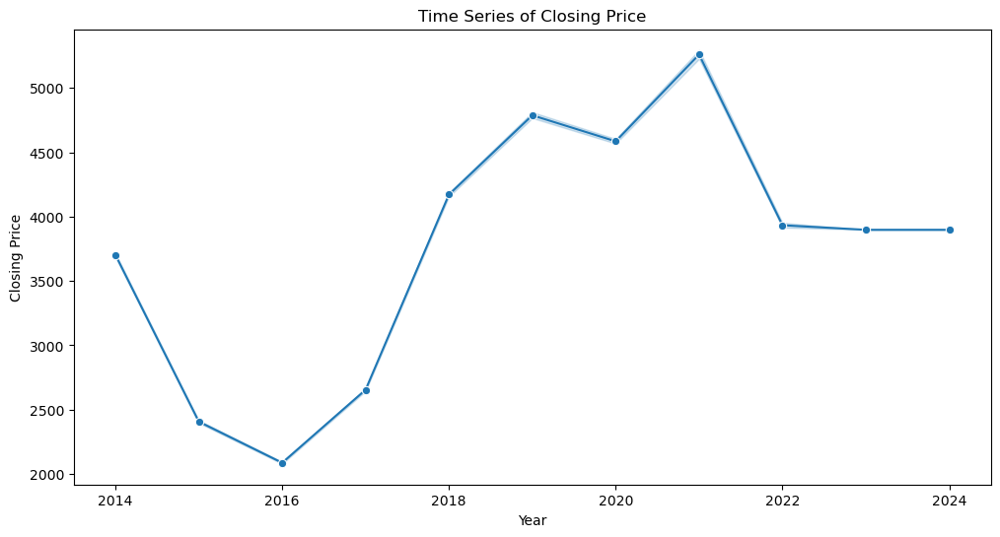

In [79]:
# Plotting EDA: Time Series - Closing Price
plt.figure(figsize=(12, 6))
sns.lineplot(x='Year', y='Closing Price', data=dataset, marker='o')
plt.title('Time Series of Closing Price')
plt.xlabel('Year')
plt.ylabel('Closing Price')
plt.show()

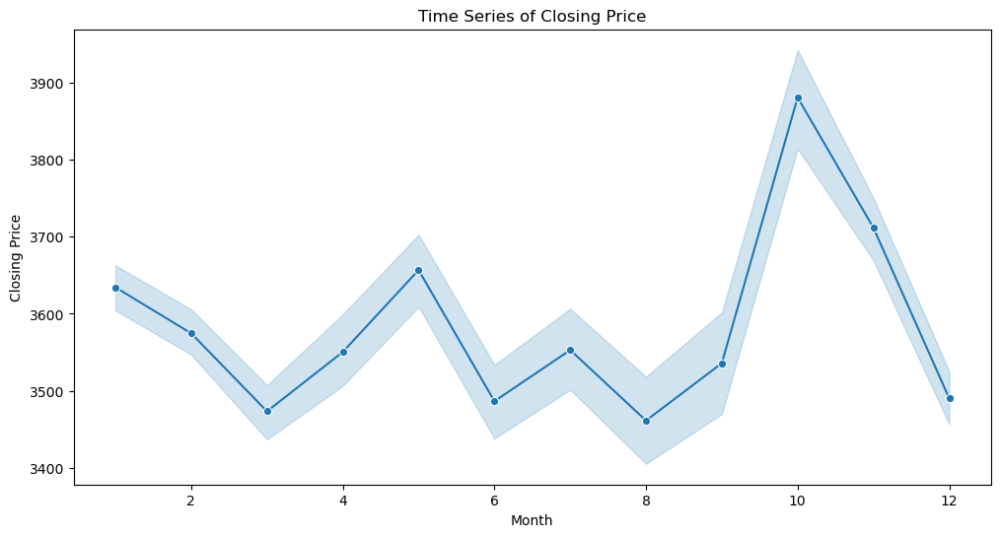

In [80]:
# Plotting EDA: Time Series - Closing Price
plt.figure(figsize=(12, 6))
sns.lineplot(x='Month', y='Closing Price', data=dataset, marker='o')
plt.title('Time Series of Closing Price')
plt.xlabel('Month')
plt.ylabel('Closing Price')
plt.show()

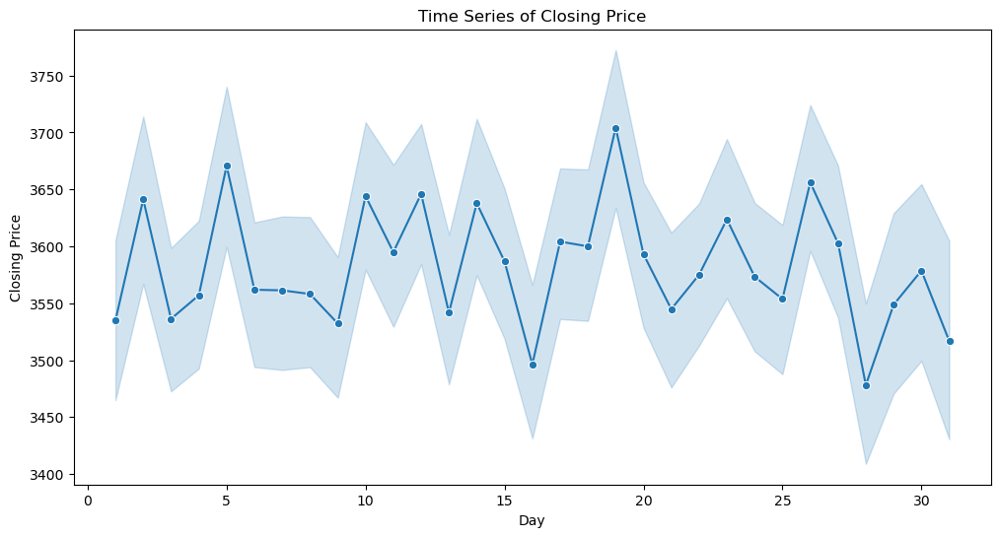

In [81]:
# Plotting EDA: Time Series - Closing Price
plt.figure(figsize=(12, 6))
sns.lineplot(x='Day', y='Closing Price', data=dataset, marker='o')
plt.title('Time Series of Closing Price')
plt.xlabel('Day')
plt.ylabel('Closing Price')
plt.show()

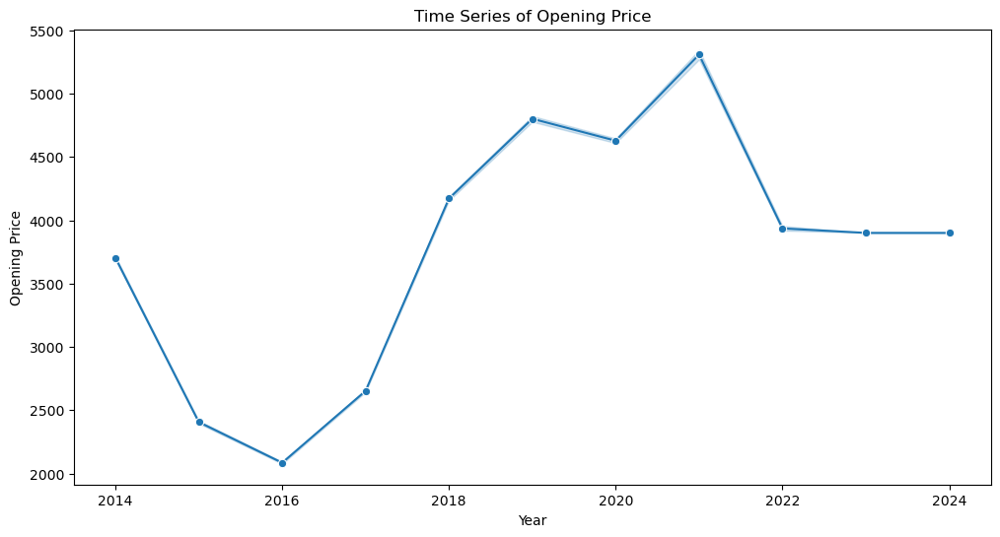

In [82]:
# Plotting EDA: Time Series - Closing Price
plt.figure(figsize=(12, 6))
sns.lineplot(x='Year', y='Opening Price', data=dataset, marker='o')
plt.title('Time Series of Opening Price')
plt.xlabel('Year')
plt.ylabel('Opening Price')
plt.show()

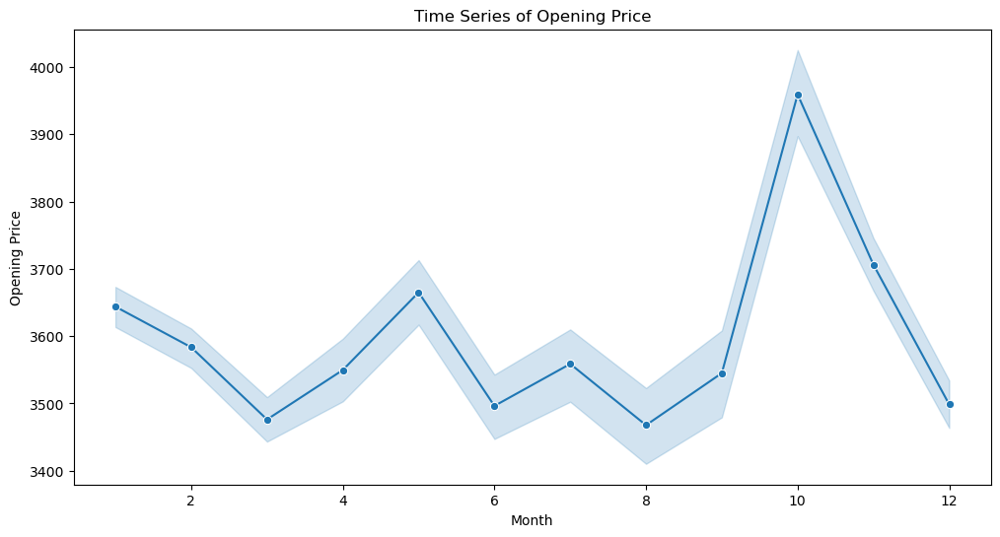

In [83]:
# Plotting EDA: Time Series - Closing Price
plt.figure(figsize=(12, 6))
sns.lineplot(x='Month', y='Opening Price', data=dataset, marker='o')
plt.title('Time Series of Opening Price')
plt.xlabel('Month')
plt.ylabel('Opening Price')
plt.show()

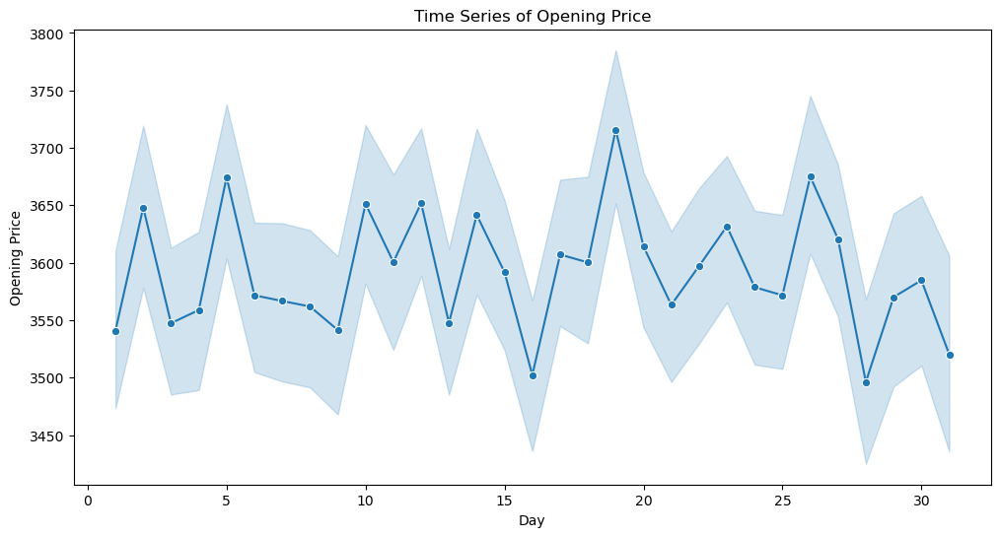

In [84]:
# Plotting EDA: Time Series - Closing Price
plt.figure(figsize=(12, 6))
sns.lineplot(x='Day', y='Opening Price', data=dataset, marker='o')
plt.title('Time Series of Opening Price')
plt.xlabel('Day')
plt.ylabel('Opening Price')
plt.show()

<Axes: title={'center': 'Closing Prices (Monthwise)'}, xlabel='Trade Date'>

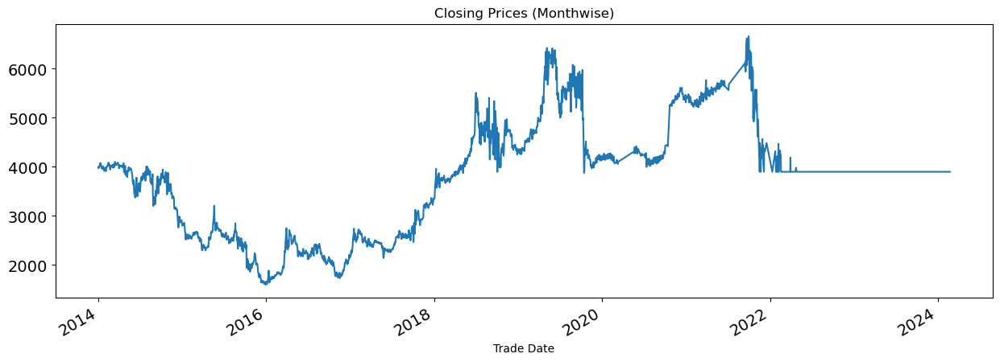

In [85]:
# Now you can calculate the mean
closing_mean = dataset.groupby(['Trade Date'])['Closing Price'].mean() 
closing_mean.plot(figsize=(15,5), title='Closing Prices (Monthwise)', fontsize=14)

<Axes: xlabel='Trade Date'>

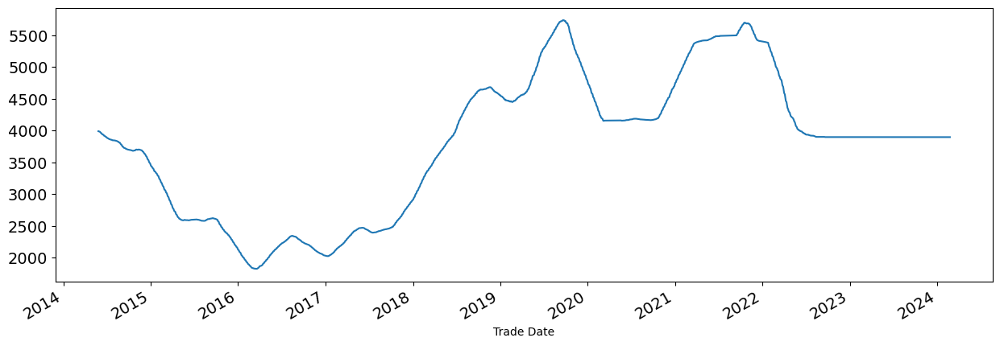

In [86]:
closing_mean.rolling(window=100).mean().plot(figsize=(15,5), fontsize=14)

<Axes: xlabel='Trade Date'>

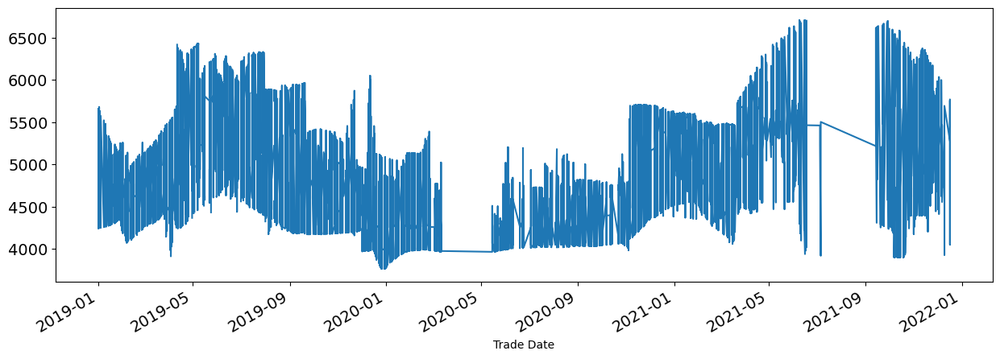

In [87]:
dataset['Closing Price'].loc['2019':'2021'].rolling(window=100).mean().plot(figsize=(15,5), fontsize=14)

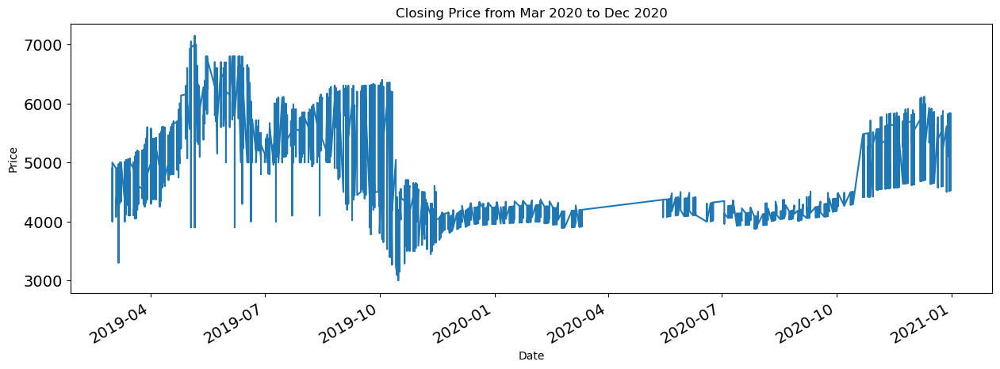

In [88]:
# Assuming Dataset is your DataFrame
# Sort the index
dataset.sort_index(inplace=True)
# Slice the DataFrame and plot
dataset['Closing Price'].loc['2019-03':'2020-12'].plot(figsize=(15,5), fontsize=14)
plt.title('Closing Price from Mar 2020 to Dec 2020')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

<Axes: title={'center': 'Opening Prices (Monthwise)'}, xlabel='Trade Date'>

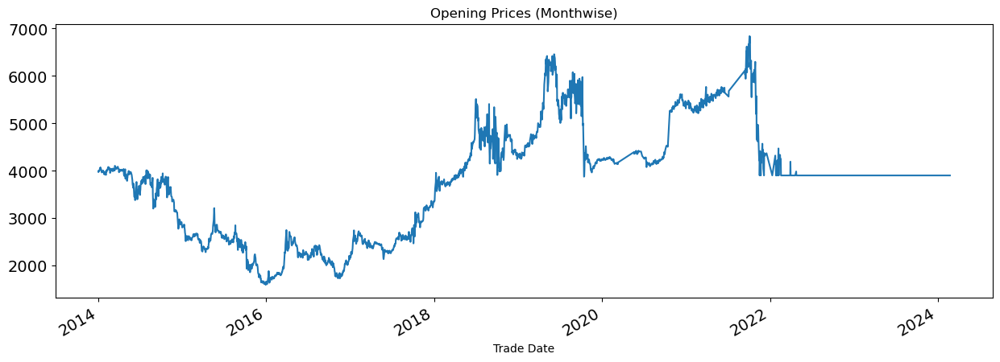

In [89]:
# Now you can calculate the mean
opening_mean = dataset.groupby(['Trade Date'])['Opening Price'].mean() 
opening_mean.plot(figsize=(15,5), title='Opening Prices (Monthwise)', fontsize=14)

<Axes: xlabel='Trade Date'>

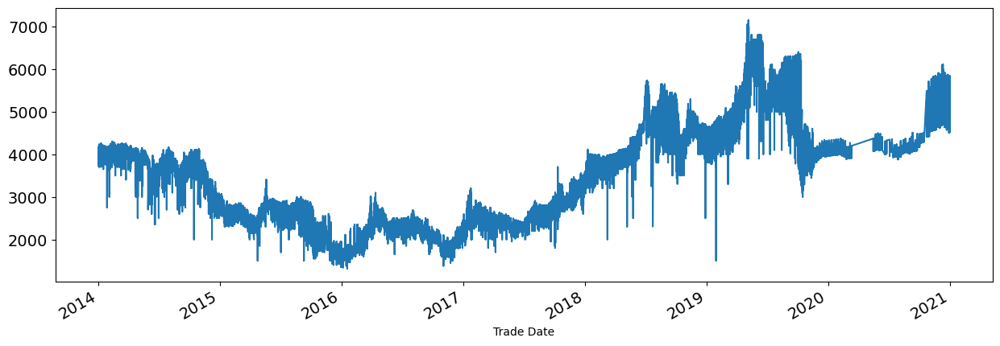

In [90]:
#Dataset['Closing Price'].loc['2010':'2020'].plot(figsize=(15,5), fontsize=14)
dataset.sort_index(inplace=True)
dataset['Closing Price'] = pd.to_numeric(dataset['Closing Price'], errors='coerce')
dataset['Opening Price'] = pd.to_numeric(dataset['Opening Price'], errors='coerce')
dataset['Closing Price'].loc['2010':'2020'].plot(figsize=(15,5), fontsize=14)

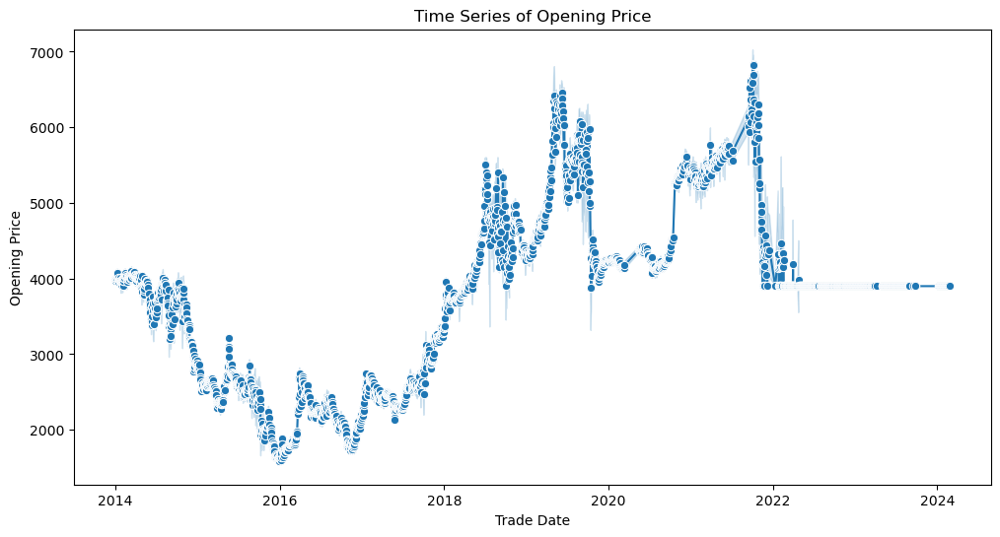

In [91]:
# Plotting EDA: Time Series - Closing Price
plt.figure(figsize=(12, 6))
sns.lineplot(x='Trade Date', y='Opening Price', data=dataset, marker='o', linestyle='-')
plt.title('Time Series of Opening Price')
plt.xlabel('Trade Date')
plt.ylabel('Opening Price')
plt.show()

<Axes: xlabel='Trade Date'>

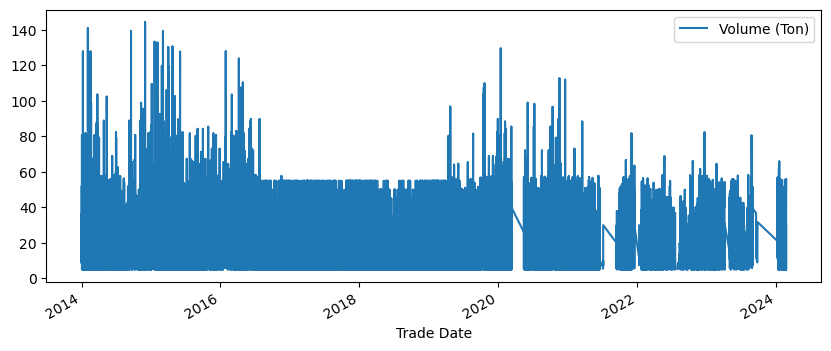

In [92]:
# Historical view of the total volume of Apple stock traded each day
dataset['Volume (Ton)'].plot(legend=True,figsize=(10,4))

In [93]:
#Calculation to find he percent change for each day of sesame
dataset['Daily Return'] = dataset['Closing Price'].pct_change()

<Axes: xlabel='Trade Date'>

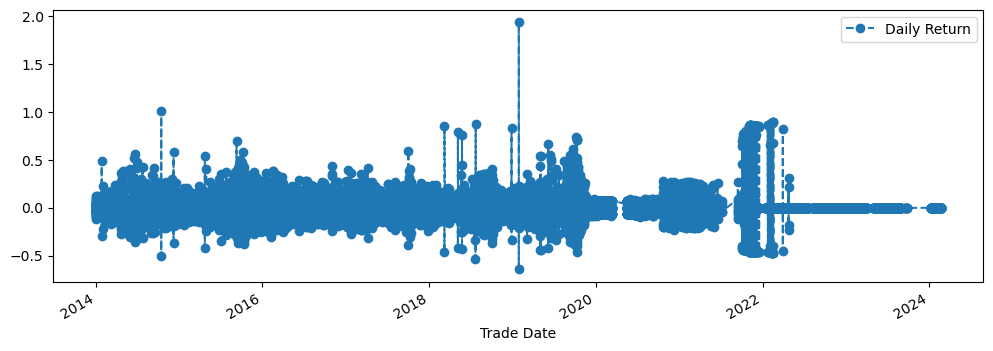

In [94]:
# Visualization of the percent change for each day of sesame
dataset['Daily Return'].plot(figsize=(12,4),legend=True,linestyle='--',marker='o')

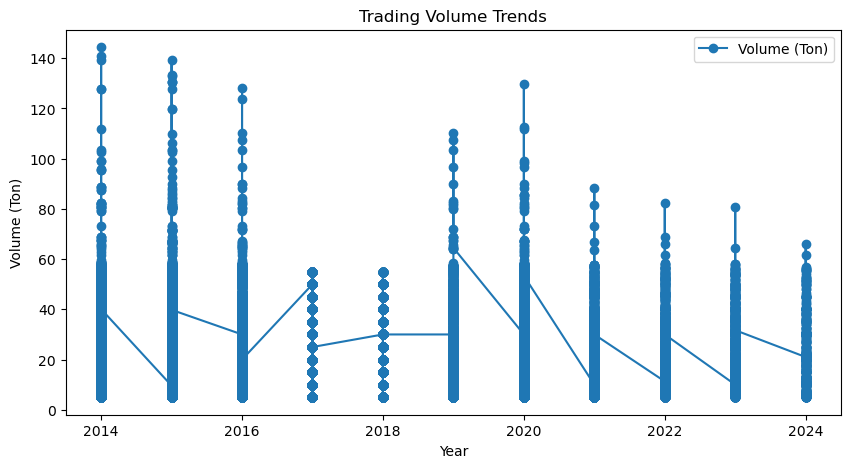

In [95]:
# Research Question 4: Overall trends in trading volume
plt.figure(figsize=(10, 5))
plt.plot(dataset['Year'], dataset['Volume (Ton)'], label='Volume (Ton)', marker='o')
plt.title('Trading Volume Trends')
plt.xlabel('Year')
plt.ylabel('Volume (Ton)')
plt.legend()
plt.show()

# Univariate analysis

In [96]:
# Summary statistics
summary_stats = dataset.describe()
print("Summary Statistics:\n", summary_stats)

Summary Statistics:
        Production year  Opening Price  Closing Price          High  \
count     35820.000000   35820.000000   35820.000000  35820.000000   
mean       2009.927527    3593.052848    3583.665410   3599.538107   
std           2.582489    1192.326689    1183.338085   1193.007207   
min        2003.000000    1310.000000    1310.000000   1310.000000   
25%        2008.000000    2500.000000    2500.000000   2500.000000   
50%        2010.000000    3900.000000    3898.000000   3900.000000   
75%        2012.000000    4314.000000    4252.000000   4317.000000   
max        2016.000000    7397.000000    7397.000000   7397.000000   

                Low        Change  Percentage Change  Volume (Ton)  \
count  35820.000000  35820.000000       35820.000000  35820.000000   
mean    3588.859743     18.010916           0.003836     24.422446   
std     1193.468405     13.853709           0.006715     13.672796   
min     1310.000000      0.000000           0.000000      5.000000  

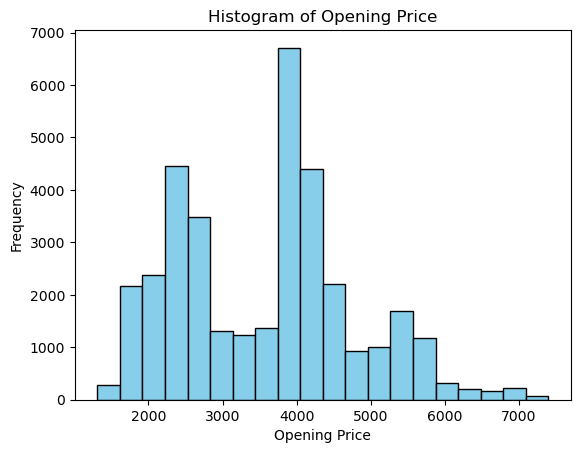

In [97]:
# Histogram for Opening Price
plt.hist(dataset['Opening Price'], bins=20, color='skyblue', edgecolor='black')
plt.title('Histogram of Opening Price')
plt.xlabel('Opening Price')
plt.ylabel('Frequency')
plt.show()

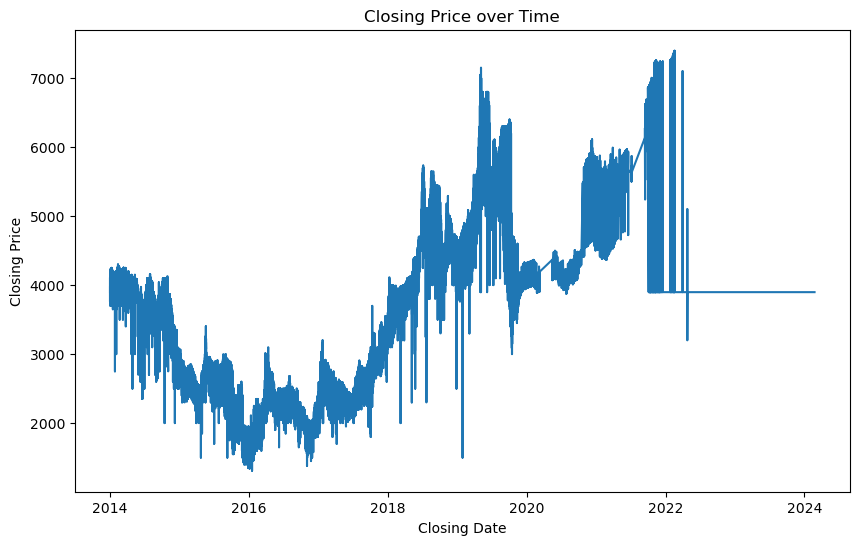

In [98]:
# Line plot for 'Closing Price' over time
plt.figure(figsize=(10, 6))
plt.plot(dataset.index, dataset['Closing Price'])
plt.title('Closing Price over Time')
plt.xlabel('Closing Date')
plt.ylabel('Closing Price')
plt.show()

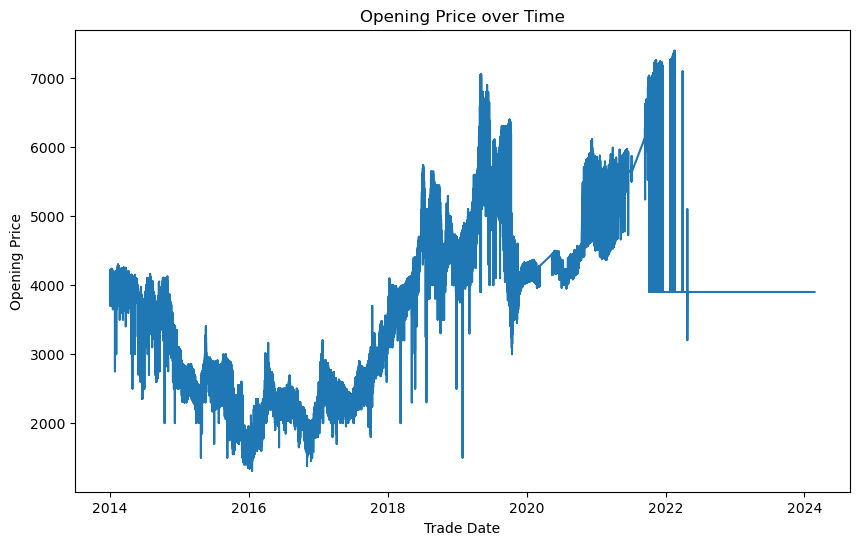

In [99]:
# Line plot for 'Opening Price' over time
plt.figure(figsize=(10, 6))
plt.plot(dataset.index, dataset['Opening Price'])
plt.title('Opening Price over Time')
plt.xlabel('Trade Date')
plt.ylabel('Opening Price')
plt.show()

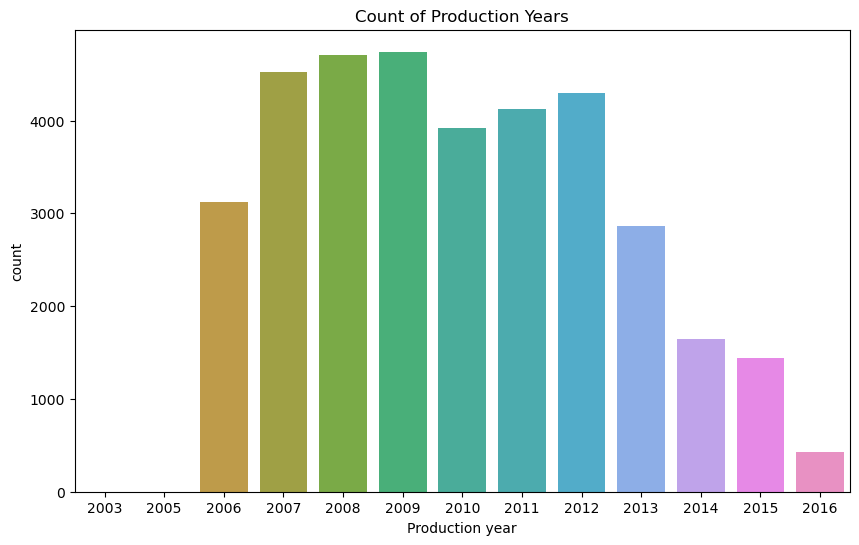

In [100]:
# Bar plot for 'Production Year'
plt.figure(figsize=(10, 6))
sns.countplot(x='Production year', data=dataset)
plt.title('Count of Production Years')
plt.show()

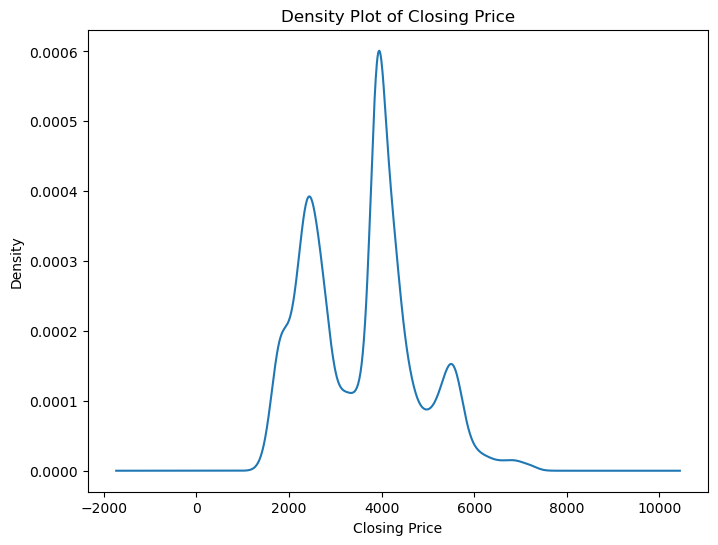

In [101]:
# Density plot for 'Closing Price'
plt.figure(figsize=(8, 6))
dataset['Closing Price'].plot(kind='density')
plt.title('Density Plot of Closing Price')
plt.xlabel('Closing Price')
plt.ylabel('Density')
plt.show()

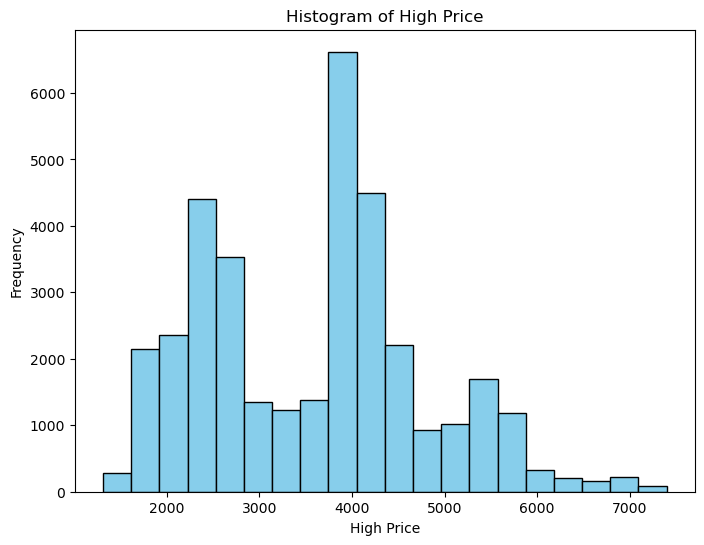

In [102]:
# Histogram plot for 'High' price
plt.figure(figsize=(8, 6))
plt.hist(dataset['High'], bins=20, color='skyblue', edgecolor='black')
plt.title('Histogram of High Price')
plt.xlabel('High Price')
plt.ylabel('Frequency')
plt.show()

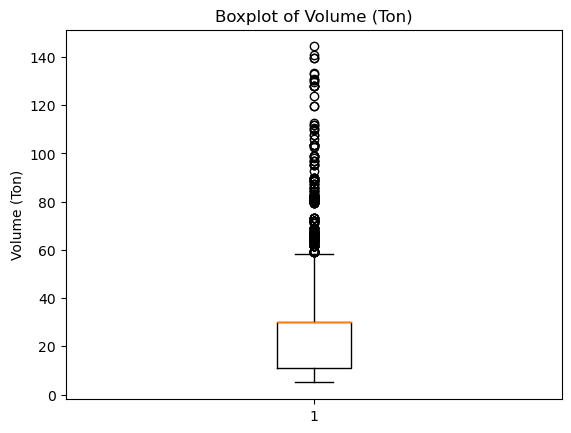

In [103]:
# Boxplot for Volume (Ton)
plt.boxplot(dataset['Volume (Ton)'])
plt.title('Boxplot of Volume (Ton)')
plt.ylabel('Volume (Ton)')
plt.show()

Text(0.5, 1.0, 'Distribution of Opening Price')

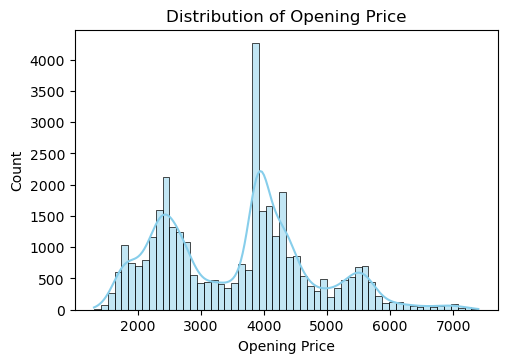

In [104]:
# Exploring the distribution of prices
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
sns.histplot(dataset['Opening Price'], kde=True, color='skyblue')
plt.title('Distribution of Opening Price')

Text(0.5, 1.0, 'Distribution of Closing Price')

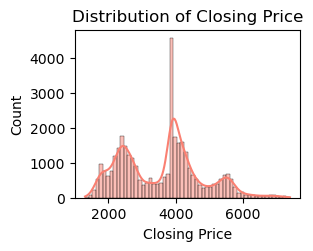

In [105]:
plt.subplot(2, 2, 2)
sns.histplot(dataset['Closing Price'], kde=True, color='salmon')
plt.title('Distribution of Closing Price')

Text(0.5, 1.0, 'Distribution of High Price')

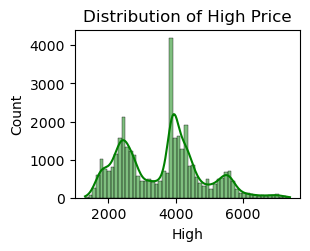

In [106]:
plt.subplot(2, 2, 3)
sns.histplot(dataset['High'], kde=True, color='green')
plt.title('Distribution of High Price')

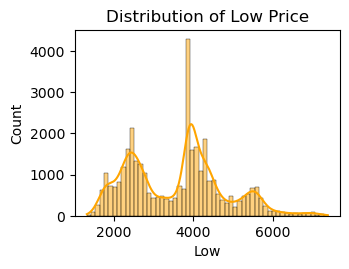

In [107]:
plt.subplot(2, 2, 4)
sns.histplot(dataset['Low'], kde=True, color='orange')
plt.title('Distribution of Low Price')

plt.tight_layout()
plt.show()

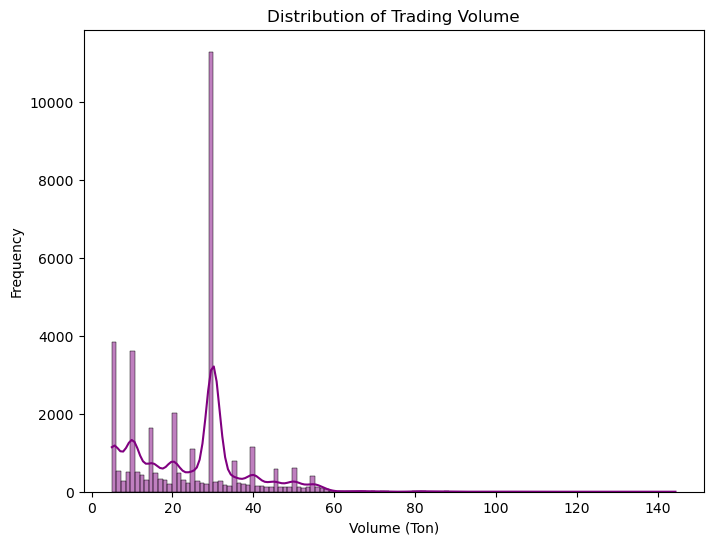

In [108]:
# Exploring the distribution of trading volume
plt.figure(figsize=(8, 6))
sns.histplot(dataset['Volume (Ton)'], kde=True, color='purple')
plt.title('Distribution of Trading Volume')
plt.xlabel('Volume (Ton)')
plt.ylabel('Frequency')
plt.show()

# Bivariate analysis

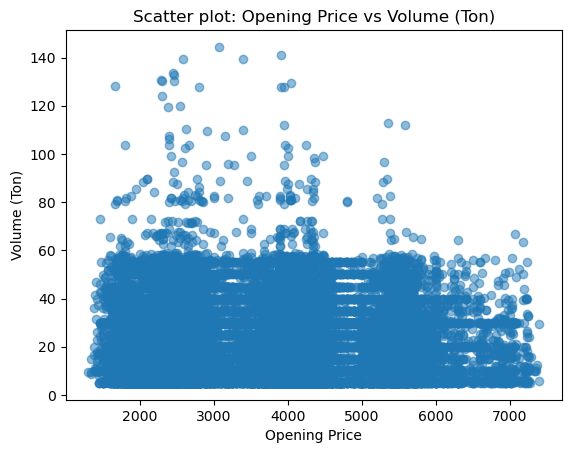

In [109]:
# Scatter plot between Opening Price and Volume (Ton)
plt.scatter(dataset['Opening Price'], dataset['Volume (Ton)'], alpha=0.5)
plt.title('Scatter plot: Opening Price vs Volume (Ton)')
plt.xlabel('Opening Price')
plt.ylabel('Volume (Ton)')
plt.show()

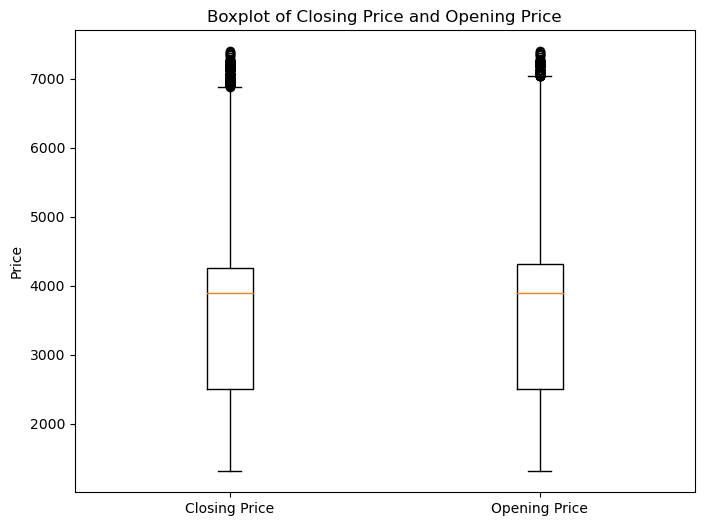

In [110]:
# Box plot for 'Closing Price' and 'Opening Price'
plt.figure(figsize=(8, 6))
plt.boxplot([dataset['Closing Price'], dataset['Opening Price']], labels=['Closing Price', 'Opening Price'])
plt.title('Boxplot of Closing Price and Opening Price')
plt.ylabel('Price')
plt.show()

# Multivariate analysis

C:\Users\Belayneh\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


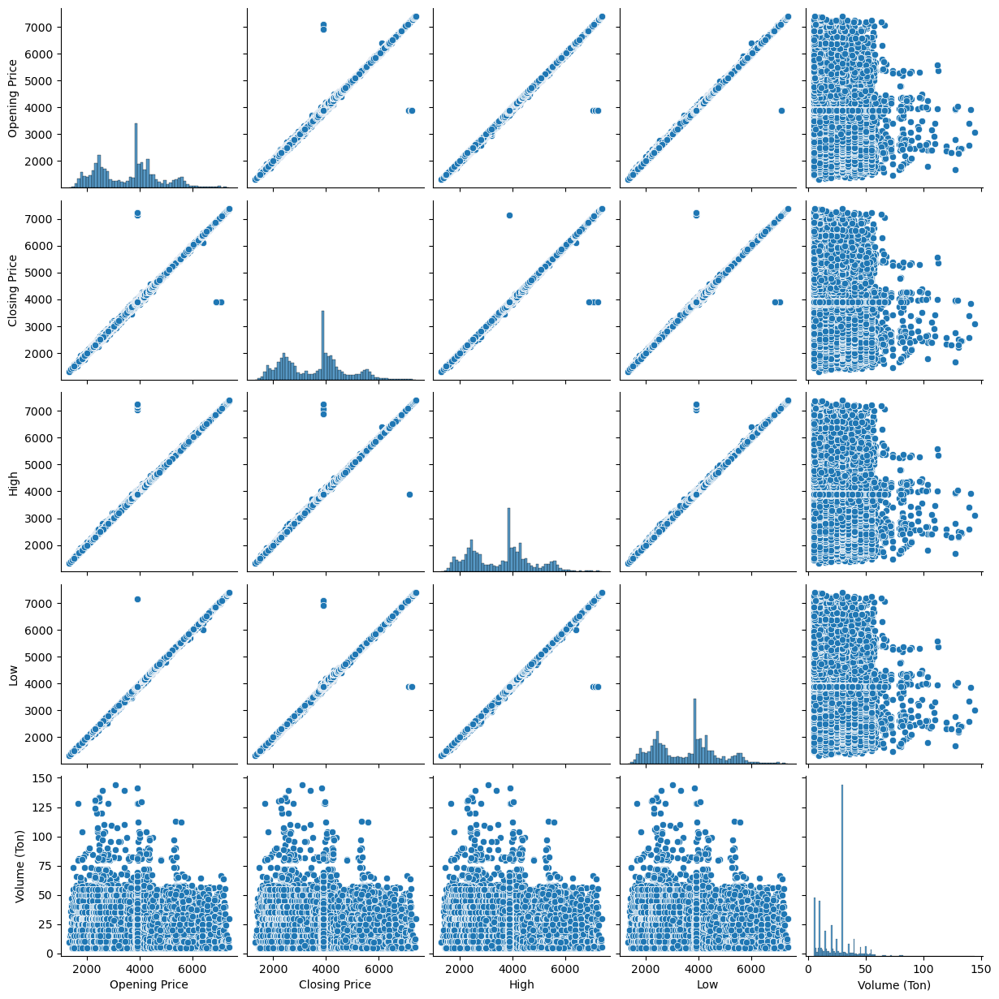

In [111]:
# Pairplot for multiple variables
import seaborn as sns
sns.pairplot(dataset[['Opening Price', 'Closing Price', 'High', 'Low', 'Volume (Ton)']])
plt.show()

C:\Users\Belayneh\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


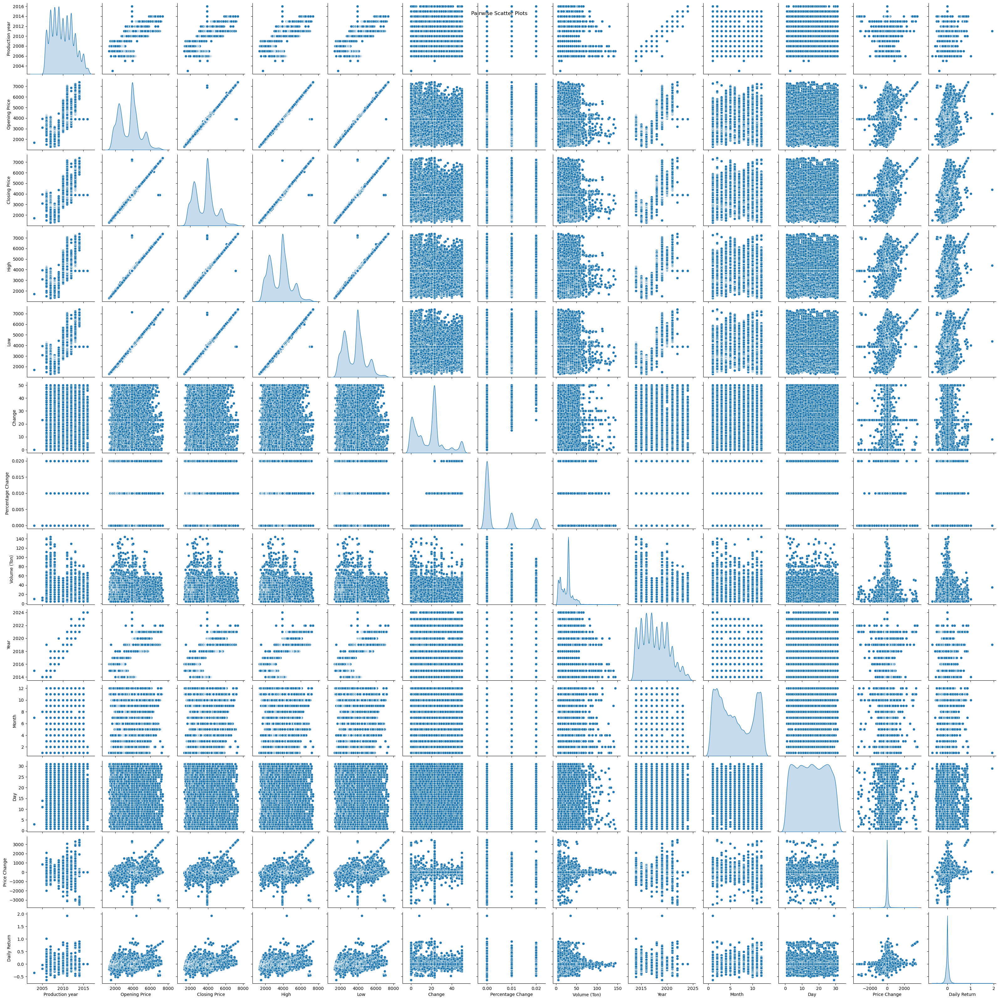

In [112]:
# Reset the index to ensure uniqueness
dataset_reset_index = dataset.reset_index(drop=True)

# Visualize scatter plots for pairwise combinations of numerical features to identify outliers
sns.pairplot(dataset_reset_index, diag_kind='kde')
plt.suptitle('Pairwise Scatter Plots')
plt.show()

Text(0.5, 1.0, 'Low')

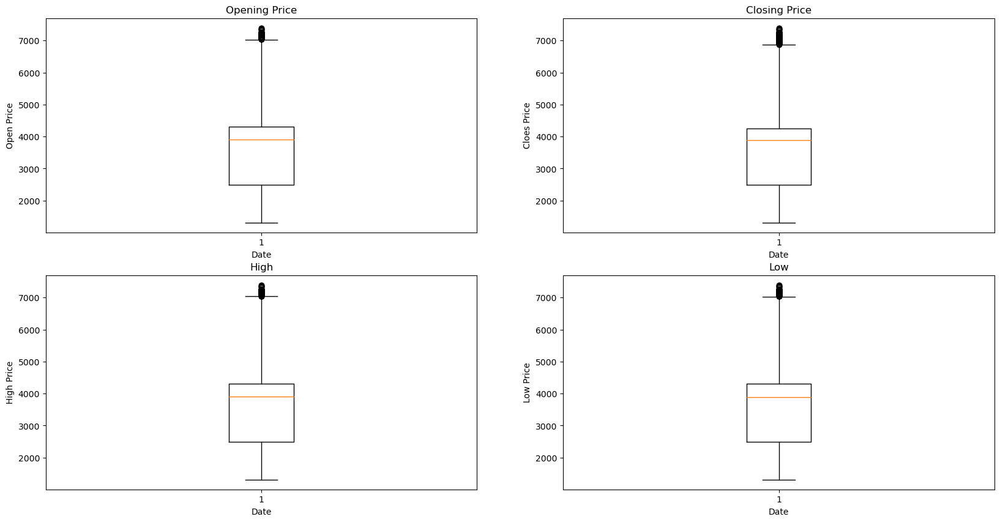

In [113]:
# Creating box-plots
plt.figure(figsize=(20,10))
#Plot 1
plt.subplot(2,2,1)
plt.boxplot(dataset['Opening Price'])
plt.xlabel('Date')
plt.ylabel('Open Price')
plt.title('Opening Price')
#Plot 2
plt.subplot(2,2,2)
plt.boxplot(dataset['Closing Price'])
plt.xlabel('Date')
plt.ylabel('Cloes Price')
plt.title('Closing Price')
#Plot 3
plt.subplot(2,2,3)
plt.boxplot(dataset['High'])
plt.xlabel('Date')
plt.ylabel('High Price')
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
plt.boxplot(dataset['Low'])
plt.xlabel('Date')
plt.ylabel('Low Price')
plt.title('Low')

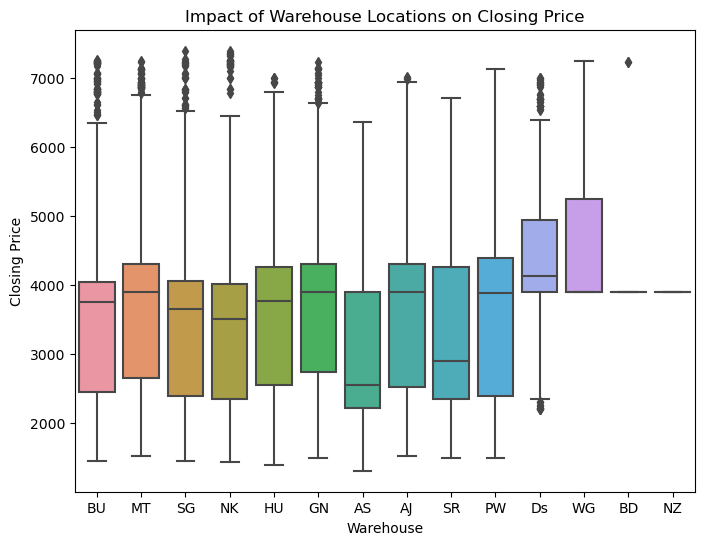

In [114]:
# Identifying potential factors influencing price movements (e.g., warehouse locations)
plt.figure(figsize=(8, 6))
sns.boxplot(x='Warehouse', y='Closing Price', data=dataset)
plt.title('Impact of Warehouse Locations on Closing Price')
plt.xlabel('Warehouse')
plt.ylabel('Closing Price')
plt.show()

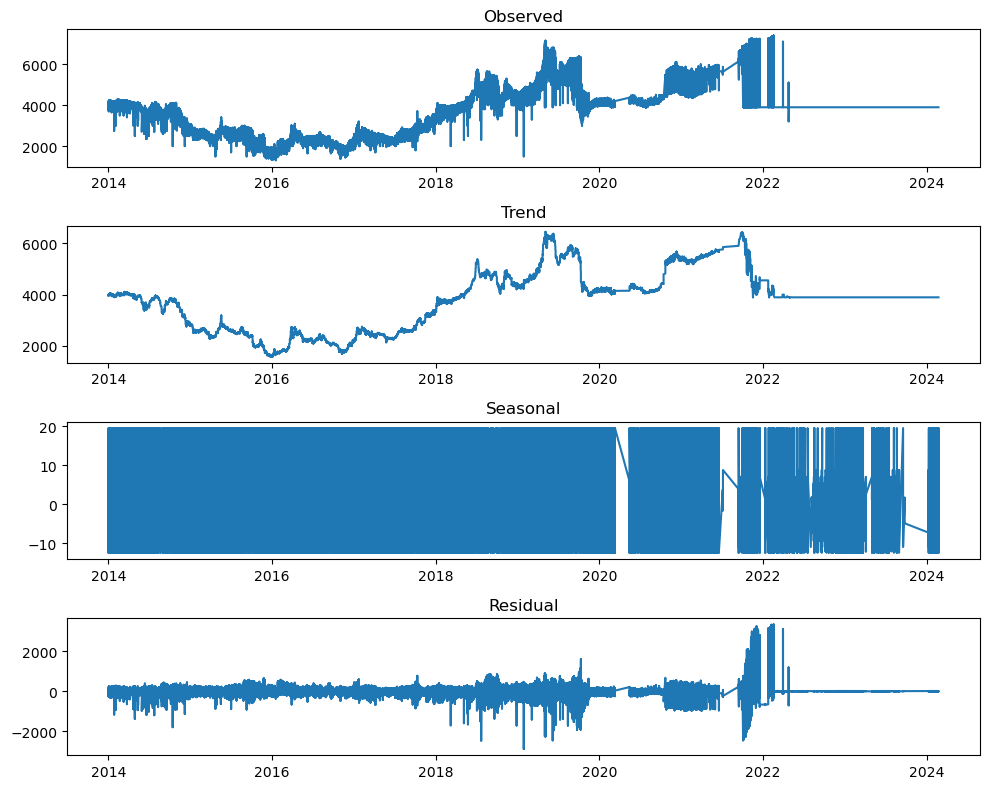

In [115]:
# Conducting time series decomposition to identify seasonality and trend
from statsmodels.tsa.seasonal import seasonal_decompose
# Decompose Closing Price
result = seasonal_decompose(dataset['Closing Price'], model='additive', period=30)  # Assuming seasonality period of 30 days
plt.figure(figsize=(10, 8))
plt.subplot(4, 1, 1)
plt.plot(result.observed)
plt.title('Observed')

plt.subplot(4, 1, 2)
plt.plot(result.trend)
plt.title('Trend')

plt.subplot(4, 1, 3)
plt.plot(result.seasonal)
plt.title('Seasonal')

plt.subplot(4, 1, 4)
plt.plot(result.resid)
plt.title('Residual')

plt.tight_layout()
plt.show()

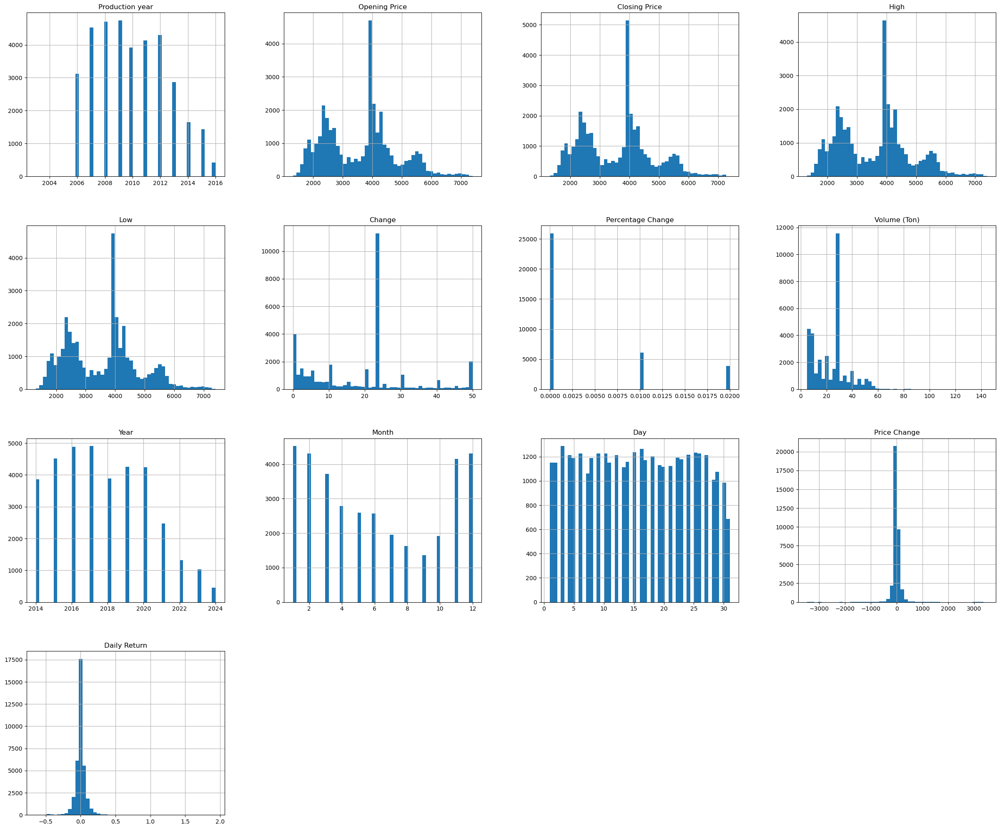

In [116]:
dataset.hist(bins=50, figsize=(30,25))
plt.title("histogram")
plt.show()

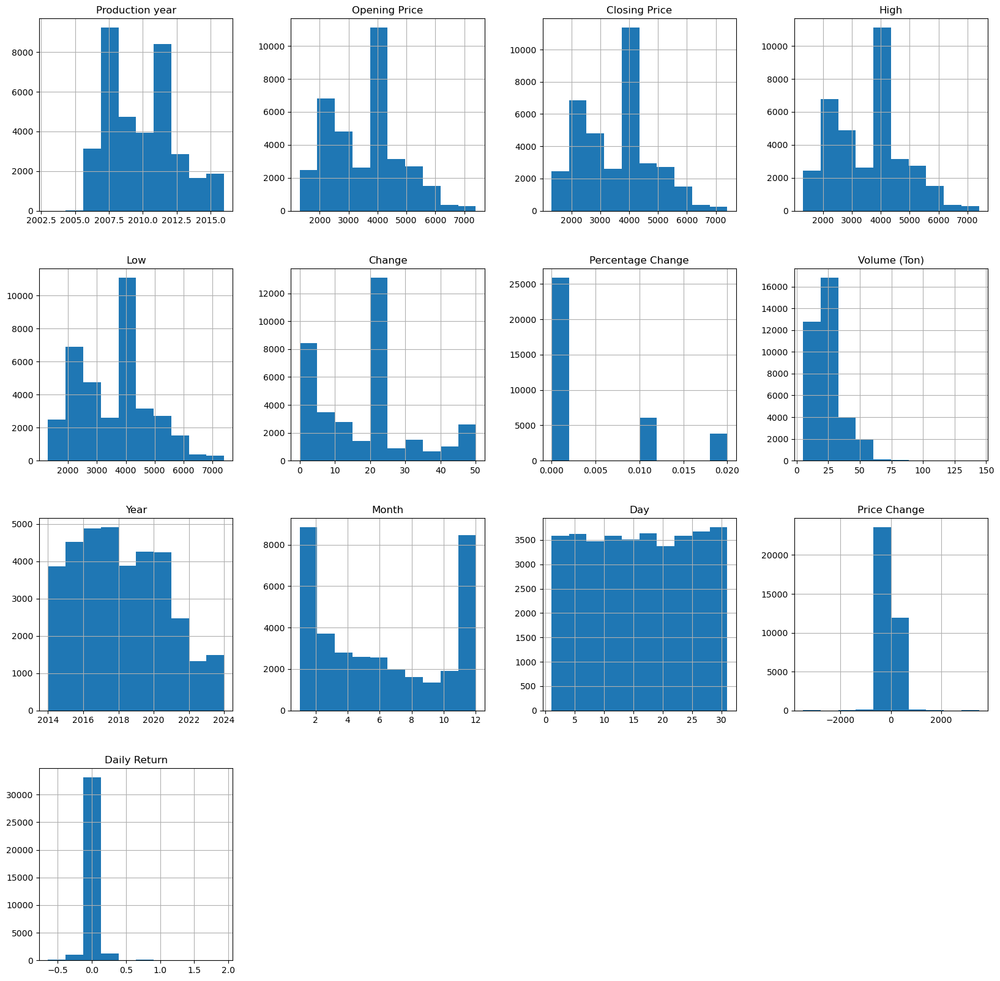

In [117]:
dataset.hist(figsize=(20,20))
plt.show()

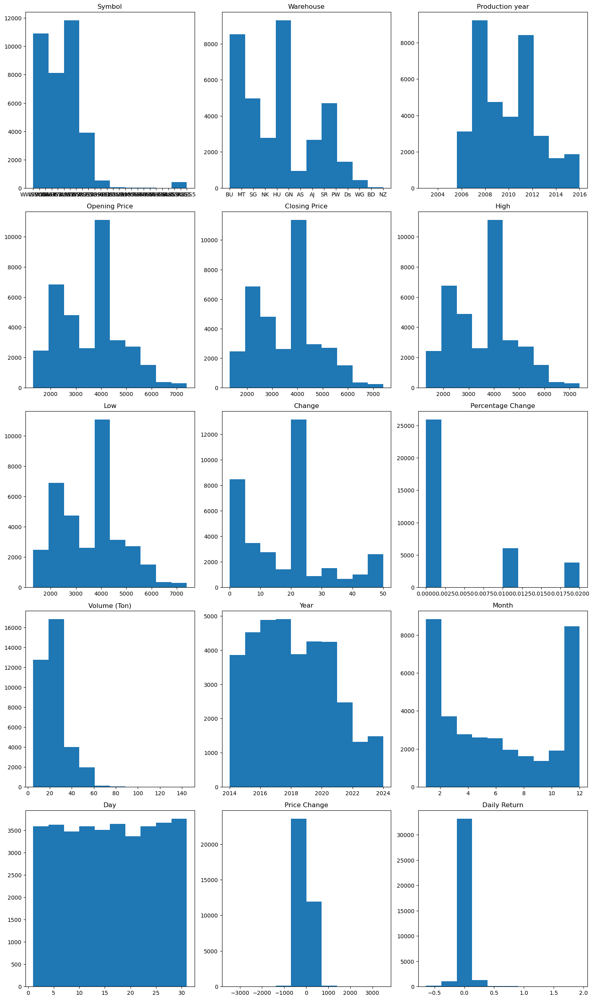

In [118]:
plt.figure(figsize=(15,40))
dataset_col = list(dataset[1:].columns)
for i in range(len(dataset_col)):
    plt.subplot(8,3,i+1)
    plt.title(dataset_col[i])
    plt.hist(dataset[dataset_col[i]])
plt.tight_layout()

In [119]:
# Research Question 1: Identify changes or anomalies in prices
# You may want to set a threshold for significant changes and analyze the corresponding dates.
significant_changes = dataset[dataset['Change'] > 10]
print(f"Dates with Significant Changes:\n{significant_changes}")

Dates with Significant Changes:
            Symbol Warehouse  Production year  Opening Price  Closing Price  \
Trade Date                                                                    
2014-01-01  WWSSUG        BU             2006         3900.0         3900.0   
2014-01-01   WHGS4        MT             2006         4010.0         4020.0   
2014-01-01   WWSS4        SG             2006         3960.0         3960.0   
2014-01-01   WWSS4        NK             2006         3900.0         3900.0   
2014-01-01   WHGS2        GN             2006         4070.0         4070.0   
...            ...       ...              ...            ...            ...   
2024-02-23   WHGS3        MT             2016         3900.0         3898.0   
2024-02-23   WHGS4        GN             2016         3900.0         3898.0   
2024-02-23  WWSSUG        SG             2016         3900.0         3898.0   
2024-02-23   WWSS4        SG             2016         3900.0         3898.0   
2024-02-23   WHGS2  

# Separating Numerical and Categorical Features:

In [120]:
# Identify numerical and categorical columns
numerical_columns = dataset.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_columns = dataset.select_dtypes(include=['object']).columns.tolist()

In [121]:
# Separate numerical and categorical features
numerical_data = dataset[numerical_columns]
categorical_data = dataset[categorical_columns]

# Multicollinearity Check for Numerical Features:

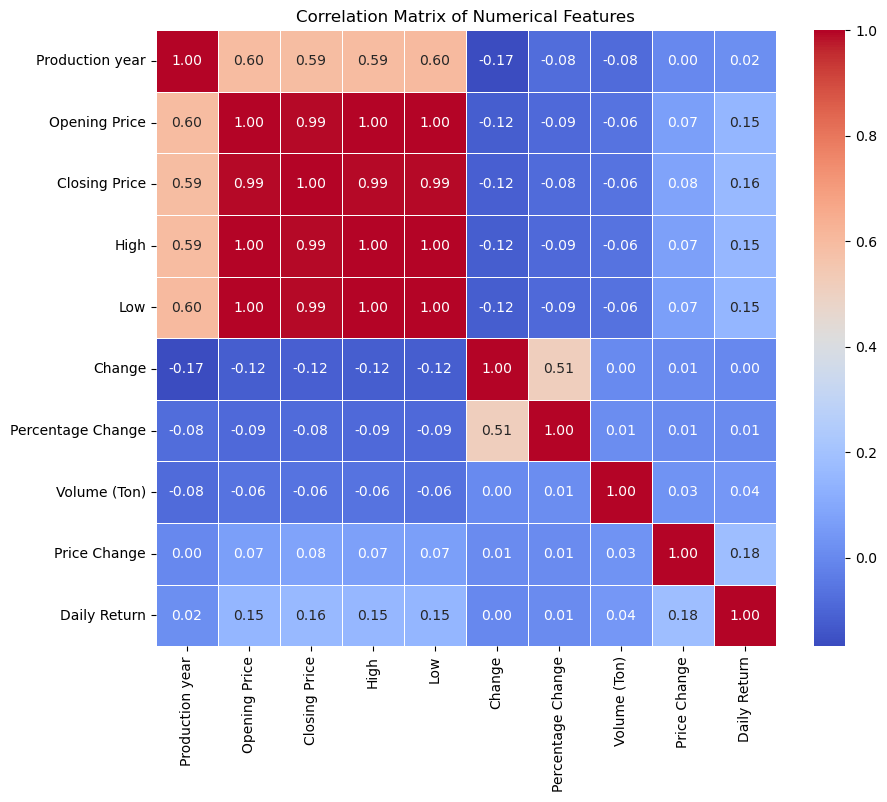

In [122]:
# Calculate correlation matrix
correlation_matrix = numerical_data.corr()
# Visualize correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

# Multicollinearity Check for Categorical Features:

In [123]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

# Assuming 'Warehouse' is a categorical feature in the dataset
# Create a contingency table for the 'Warehouse' feature and the target feature
contingency_table = pd.crosstab(dataset['Warehouse'], dataset['Closing Price'])

# Perform chi-square test for independence
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Print results
print("Chi-square:", chi2)
print("p-value:", p)
print("Degrees of freedom:", dof)
print("Expected frequencies table:")
print(expected)


Chi-square: 56092.333528484036
p-value: 2.144348182685334e-49
Degrees of freedom: 51233
Expected frequencies table:
[[0.07484645 0.07484645 0.14969291 ... 0.07484645 0.07484645 0.07484645]
 [0.02632607 0.02632607 0.05265215 ... 0.02632607 0.02632607 0.02632607]
 [0.00075377 0.00075377 0.00150754 ... 0.00075377 0.00075377 0.00075377]
 ...
 [0.13866555 0.13866555 0.2773311  ... 0.13866555 0.13866555 0.13866555]
 [0.04737577 0.04737577 0.09475154 ... 0.04737577 0.04737577 0.04737577]
 [0.01225572 0.01225572 0.02451145 ... 0.01225572 0.01225572 0.01225572]]


# Analyzing Price Trends and Trading Patterns in the Sesame Commodity Exchange"

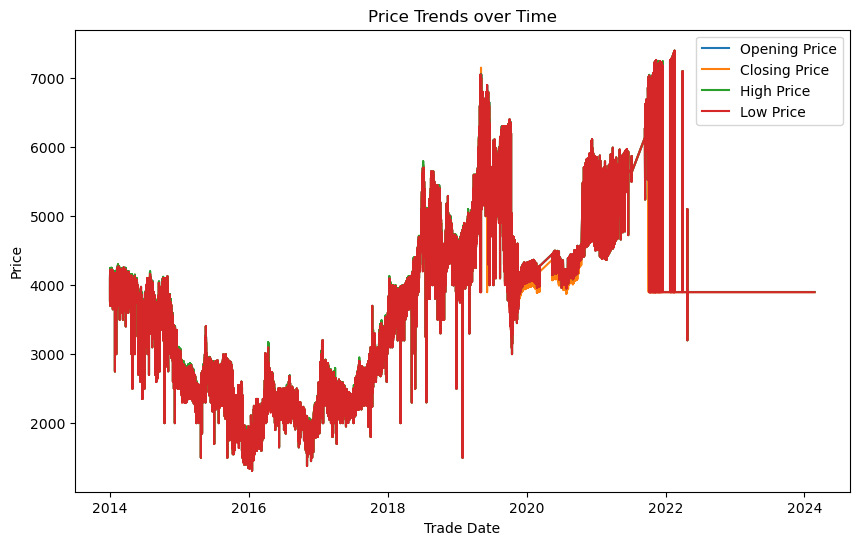

In [124]:
# Visualize price trends over time
plt.figure(figsize=(10, 6))
plt.plot(dataset.index, dataset['Opening Price'], label='Opening Price')
plt.plot(dataset.index, dataset['Closing Price'], label='Closing Price')
plt.plot(dataset.index, dataset['High'], label='High Price')
plt.plot(dataset.index, dataset['Low'], label='Low Price')
plt.title('Price Trends over Time')
plt.xlabel('Trade Date')
plt.ylabel('Price')
plt.legend()
plt.show()

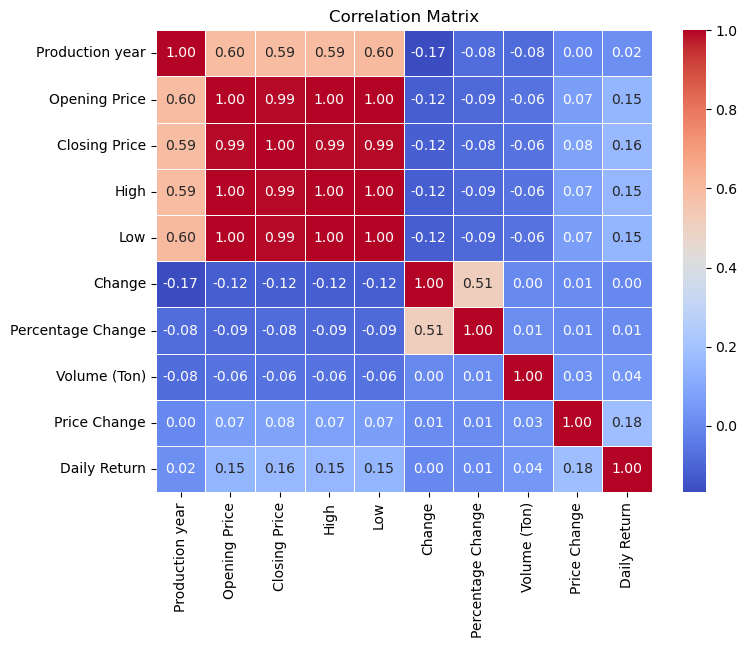

In [125]:
#Visualize correlation matrix using a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

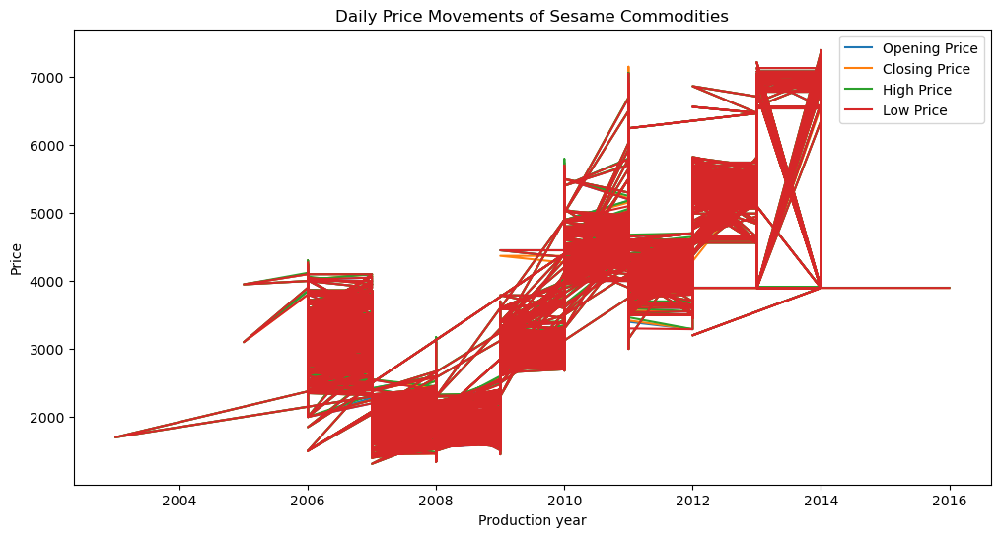

In [126]:
# 1. How do daily price movements (Opening Price, Closing Price, High, Low) of sesame commodities vary over the observed period?
# Visualize daily price movements
plt.figure(figsize=(12, 6))
plt.plot(dataset['Production year'], dataset['Opening Price'], label='Opening Price')
plt.plot(dataset['Production year'], dataset['Closing Price'], label='Closing Price')
plt.plot(dataset['Production year'], dataset['High'], label='High Price')
plt.plot(dataset['Production year'], dataset['Low'], label='Low Price')
plt.title('Daily Price Movements of Sesame Commodities')
plt.xlabel('Production year')
plt.ylabel('Price')
plt.legend()
plt.show()

In [127]:
# 2. Is there a correlation between the production year of sesame commodities and their corresponding prices in the exchange?
# Calculate correlation between production year and prices
correlation = dataset['Production year'].corr(dataset['Closing Price'])
print("Correlation between Production Year and Closing Price:", correlation)

Correlation between Production Year and Closing Price: 0.5926226347904245


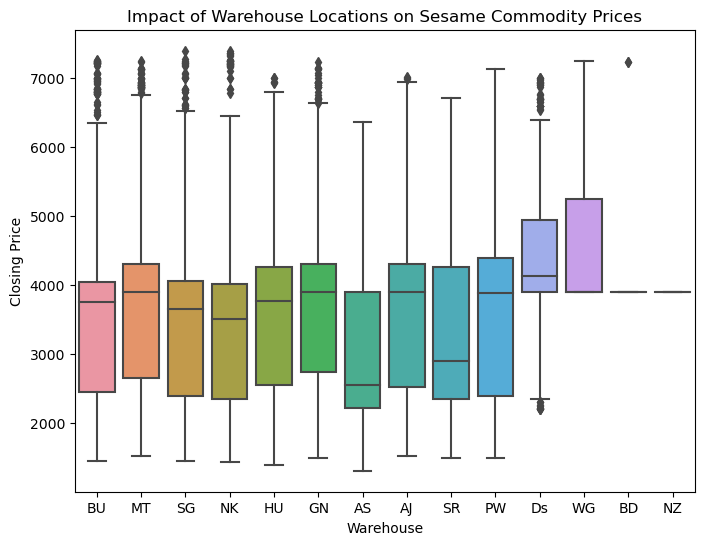

In [128]:
# 3. Does the location of the warehouse (NK or SG) have a significant impact on sesame commodity prices?
# Compare prices between warehouse locations
plt.figure(figsize=(8, 6))
sns.boxplot(x='Warehouse', y='Closing Price', data=dataset)
plt.title('Impact of Warehouse Locations on Sesame Commodity Prices')
plt.xlabel('Warehouse')
plt.ylabel('Closing Price')
plt.show()

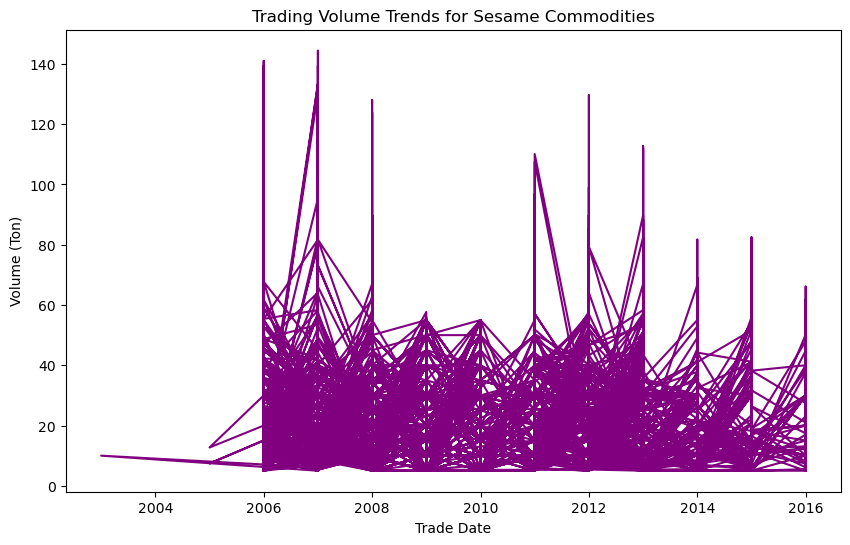

In [129]:
# 4. What are the overall trends in trading volume for sesame commodities in the Sesame Commodity Exchange?
# Visualize trading volume trends
plt.figure(figsize=(10, 6))
plt.plot(dataset['Production year'], dataset['Volume (Ton)'], color='purple')
plt.title('Trading Volume Trends for Sesame Commodities')
plt.xlabel('Trade Date')
plt.ylabel('Volume (Ton)')
plt.show()

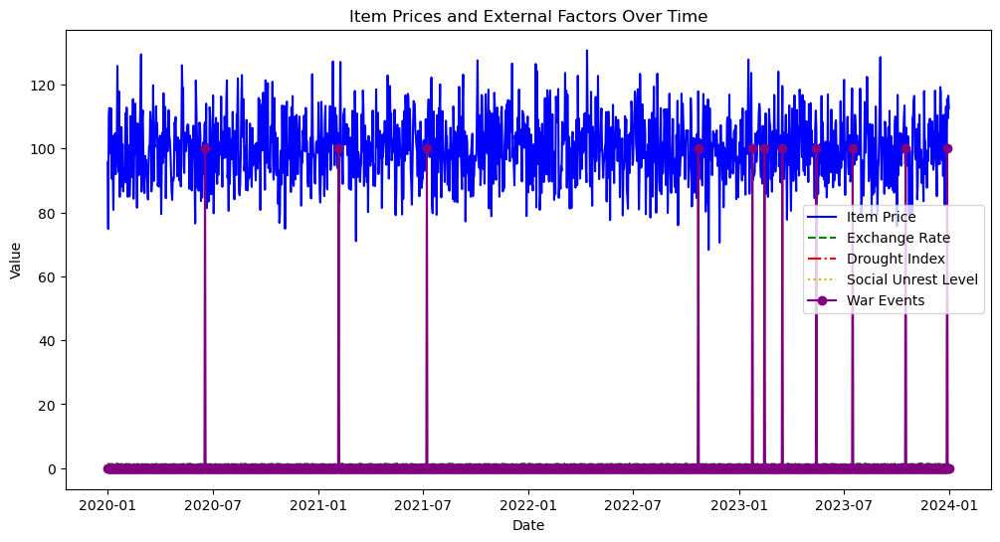

In [130]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Generate hypothetical time series data for item prices
dates = pd.date_range(start='2020-01-01', end='2023-12-31', freq='D')
item_prices = np.random.normal(loc=100, scale=10, size=len(dates))

# Generate hypothetical time series data for external factors (exchange rate, drought index, social unrest level, war events)
exchange_rate = np.random.normal(loc=1.2, scale=0.1, size=len(dates))  # Hypothetical exchange rate data
drought_index = np.random.uniform(low=0, high=1, size=len(dates))  # Hypothetical drought index data
social_unrest_level = np.random.uniform(low=0, high=1, size=len(dates))  # Hypothetical social unrest level data
war_events = np.random.binomial(n=1, p=0.01, size=len(dates))  # Hypothetical war events data

# Create a DataFrame to store the data
data = pd.DataFrame({
    'Date': dates,
    'Item Price': item_prices,
    'Exchange Rate': exchange_rate,
    'Drought Index': drought_index,
    'Social Unrest Level': social_unrest_level,
    'War Events': war_events
})

# Plot item prices and external factors over time
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['Item Price'], label='Item Price', color='blue')
plt.plot(data['Date'], data['Exchange Rate'], label='Exchange Rate', color='green', linestyle='--')
plt.plot(data['Date'], data['Drought Index'], label='Drought Index', color='red', linestyle='-.')
plt.plot(data['Date'], data['Social Unrest Level'], label='Social Unrest Level', color='orange', linestyle=':')
plt.plot(data['Date'], data['War Events'] * 100, label='War Events', color='purple', linestyle='-', marker='o')
plt.title('Item Prices and External Factors Over Time')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


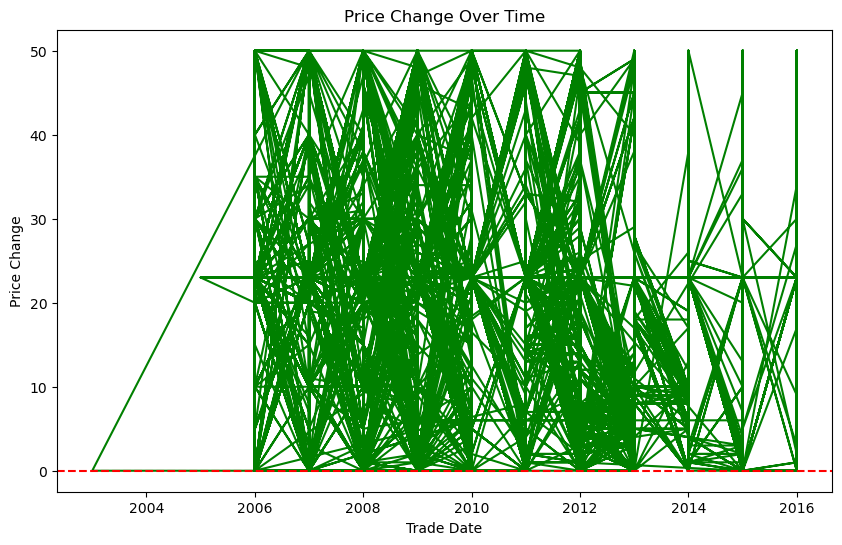

In [131]:
# 5. Are there any specific events or factors that contributed to significant changes or anomalies in sesame commodity prices during the observed period?
# Visualize price change over time
plt.figure(figsize=(10, 6))
plt.plot(dataset['Production year'], dataset['Change'], color='green')
plt.title('Price Change Over Time')
plt.xlabel('Trade Date')
plt.ylabel('Price Change')
plt.axhline(0, color='red', linestyle='--')  # Add a horizontal line at y=0 for reference
plt.show()

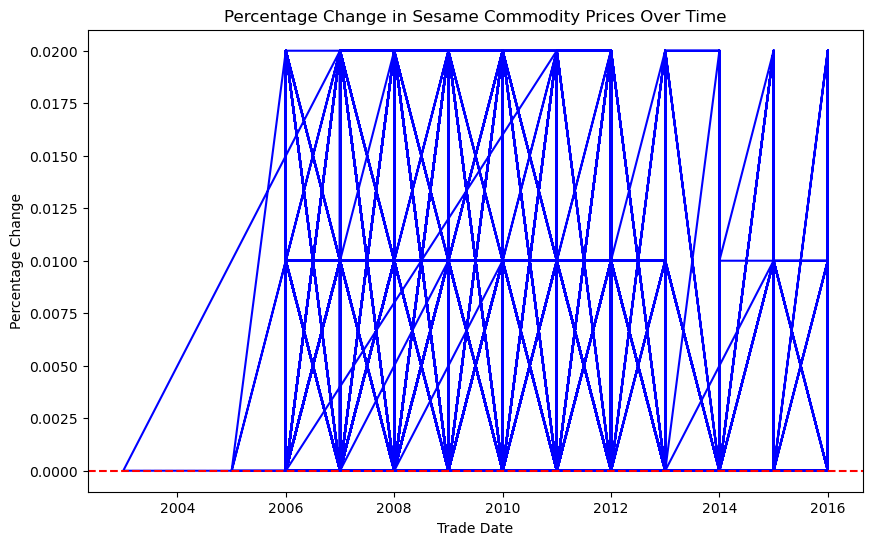

In [132]:
# 6. How has the percentage change in sesame commodity prices evolved throughout the dataset, and are there any notable patterns or trends?
# Visualize percentage change in prices over time
plt.figure(figsize=(10, 6))
plt.plot(dataset['Production year'], dataset['Percentage Change'], color='blue')
plt.title('Percentage Change in Sesame Commodity Prices Over Time')
plt.xlabel('Trade Date')
plt.ylabel('Percentage Change')
plt.axhline(0, color='red', linestyle='--')  # Add a horizontal line at y=0 for reference
plt.show()

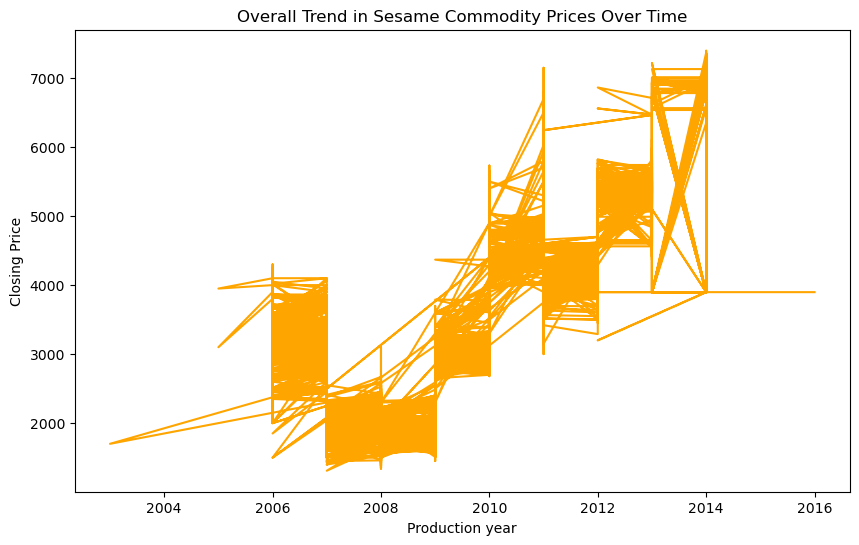

In [133]:
# 7. How does the overall trend in sesame commodity prices evolve over the observed time period?
# Visualize overall trend in sesame commodity prices
plt.figure(figsize=(10, 6))
plt.plot(dataset['Production year'], dataset['Closing Price'], color='orange')
plt.title('Overall Trend in Sesame Commodity Prices Over Time')
plt.xlabel('Production year')
plt.ylabel('Closing Price')
plt.show()

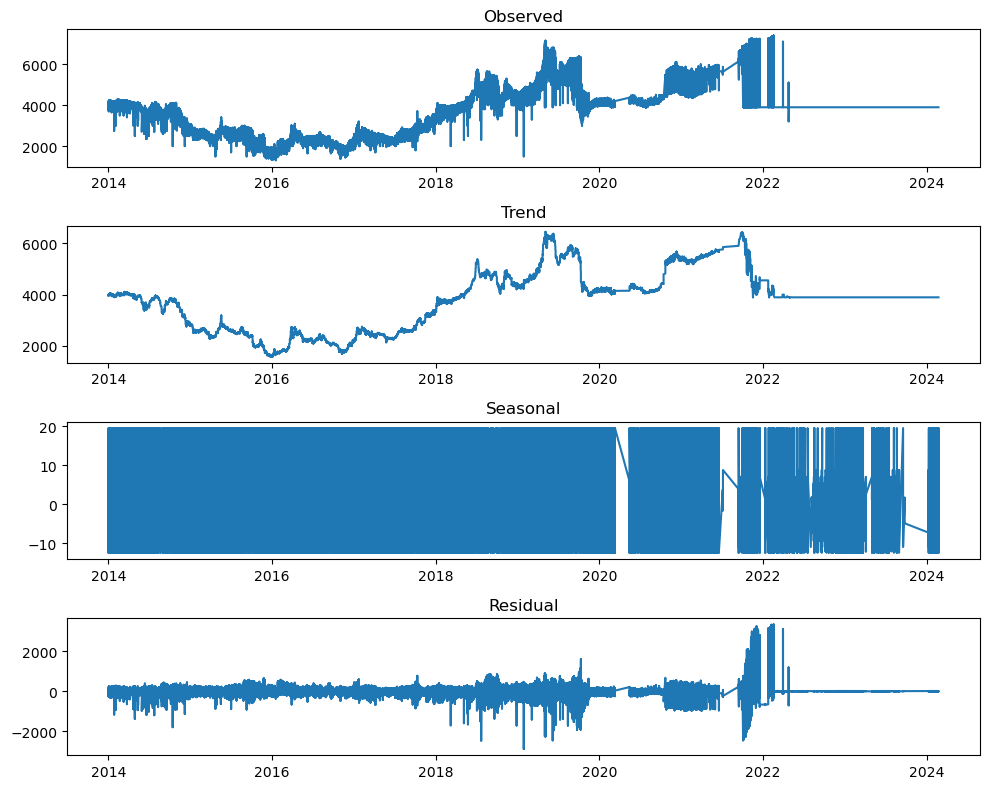

In [134]:
# 8. Are there any recurring patterns or seasonality in the sesame commodity price time series data?
# Conduct time series decomposition to identify seasonality
from statsmodels.tsa.seasonal import seasonal_decompose

# Decompose Closing Price
result = seasonal_decompose(dataset['Closing Price'], model='additive', period=30)  # Assuming seasonality period of 30 days

plt.figure(figsize=(10, 8))
plt.subplot(4, 1, 1)
plt.plot(result.observed)
plt.title('Observed')

plt.subplot(4, 1, 2)
plt.plot(result.trend)
plt.title('Trend')

plt.subplot(4, 1, 3)
plt.plot(result.seasonal)
plt.title('Seasonal')

plt.subplot(4, 1, 4)
plt.plot(result.resid)
plt.title('Residual')

plt.tight_layout()
plt.show()

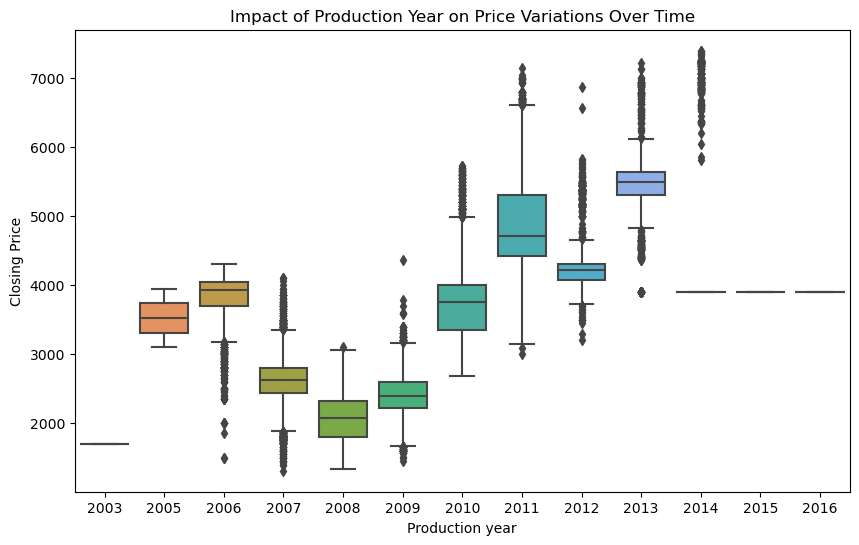

In [135]:
# 9. Does the production year of sesame commodities have a significant impact on price variations over time?
# Compare price variations over time across different production years
plt.figure(figsize=(10, 6))
sns.boxplot(x='Production year', y='Closing Price', data=dataset)
plt.title('Impact of Production Year on Price Variations Over Time')
plt.xlabel('Production year')
plt.ylabel('Closing Price')
plt.show()

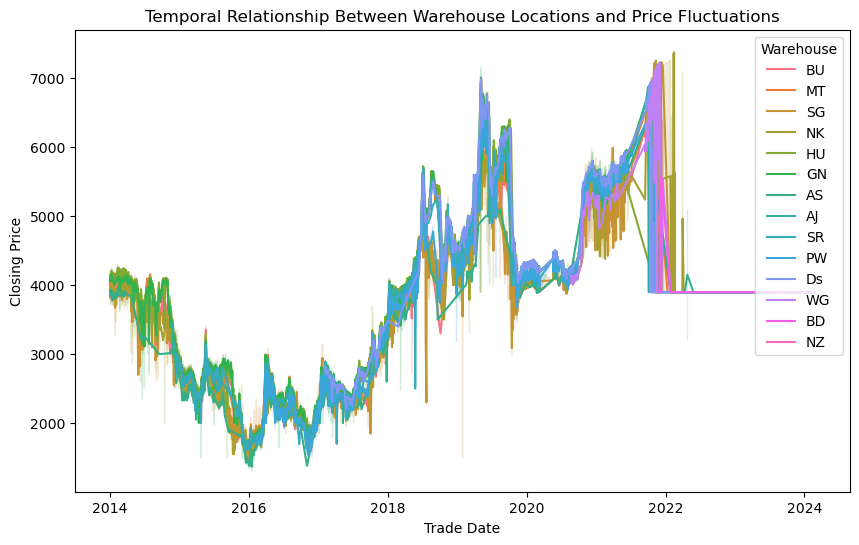

In [136]:
# 10. Is there a temporal relationship between warehouse locations and sesame commodity price fluctuations?
# Visualize temporal relationship between warehouse locations and price fluctuations
plt.figure(figsize=(10, 6))
sns.lineplot(x='Trade Date', y='Closing Price', hue='Warehouse', data=dataset)
plt.title('Temporal Relationship Between Warehouse Locations and Price Fluctuations')
plt.xlabel('Trade Date')
plt.ylabel('Closing Price')
plt.show()

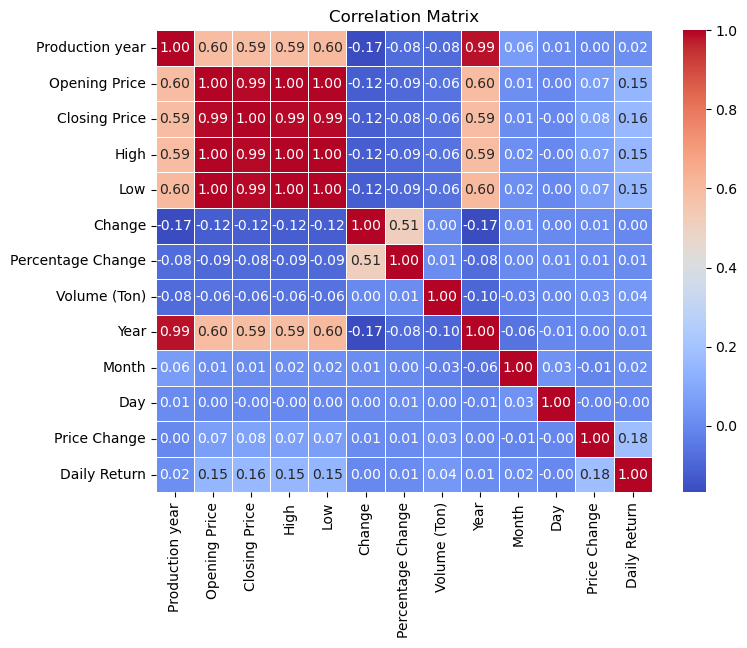

In [137]:
# Exclude non-numeric columns before computing the correlation matrix
numeric_columns = dataset.select_dtypes(include=[np.number]).columns
corr_matrix = dataset[numeric_columns].corr()
# Plotting the Correlation Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

In [138]:
# Select only numeric columns for correlation analysis
numeric_columns = dataset.select_dtypes(include='number')
# Calculate the correlation matrix
correlation_matrix = numeric_columns.corr()
# Print the correlation matrix
print(correlation_matrix)

                   Production year  Opening Price  Closing Price      High  \
Production year           1.000000       0.596612       0.592623  0.594332   
Opening Price             0.596612       1.000000       0.993657  0.998648   
Closing Price             0.592623       0.993657       1.000000  0.994576   
High                      0.594332       0.998648       0.994576  1.000000   
Low                       0.599106       0.999613       0.993955  0.998876   
Change                   -0.168006      -0.120699      -0.115084 -0.119948   
Percentage Change        -0.080141      -0.088263      -0.084444 -0.087628   
Volume (Ton)             -0.082634      -0.062561      -0.062949 -0.060471   
Year                      0.986265       0.596519       0.592735  0.593927   
Month                     0.058603       0.014617       0.012806  0.015215   
Day                       0.005985       0.000304      -0.002493 -0.000455   
Price Change              0.000668       0.065117       0.079933

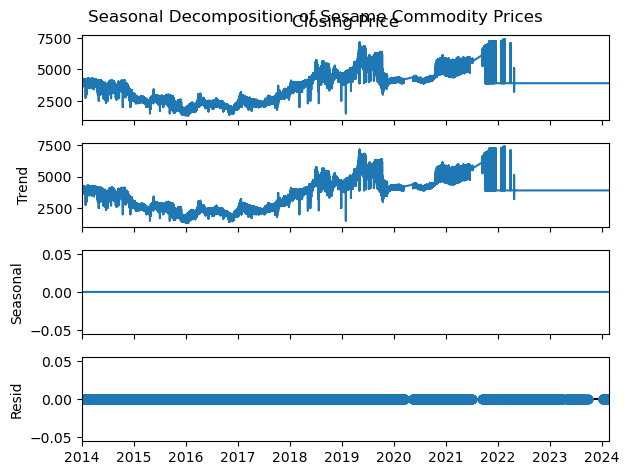

In [139]:
# Seasonal Decomposition
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(dataset['Closing Price'], model='additive', period=1)
result.plot()
plt.suptitle('Seasonal Decomposition of Sesame Commodity Prices')
plt.show()

In [140]:
# Stationarity Check
from statsmodels.tsa.stattools import adfuller
def check_stationarity(timeseries):
    result = adfuller(timeseries, autolag='AIC')
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print(f'Critical Values: {result[4]}')
check_stationarity(dataset['Closing Price'])

ADF Statistic: -1.3657980403624612
p-value: 0.5985587533119592
Critical Values: {'1%': -3.4305328487779034, '5%': -2.8616208146958533, '10%': -2.566813015113188}


ADF Statistic: -37.64112020102657
p-value: 0.0
Critical Values: {'1%': -3.4305329152675634, '5%': -2.861620844081754, '10%': -2.5668130307545334}


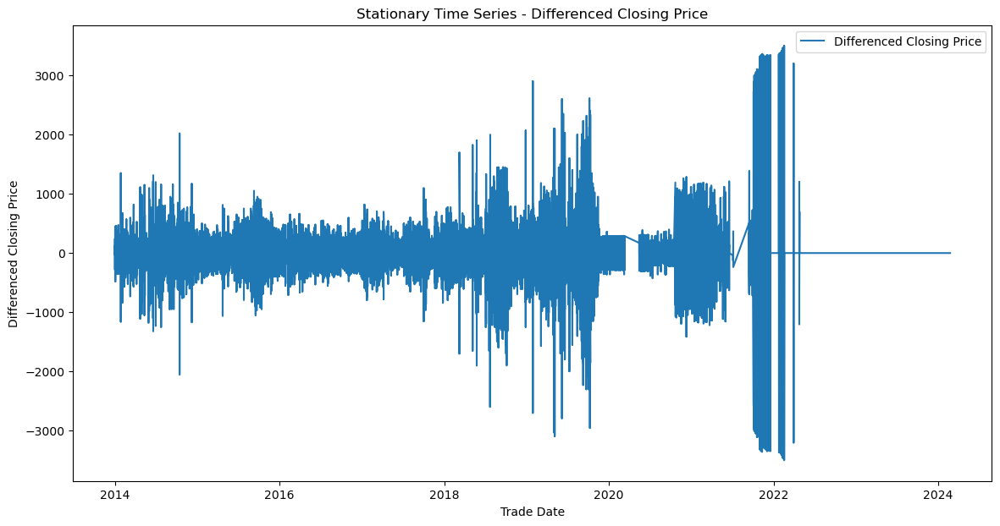

In [141]:
# Make the Time Series Stationary
# Differencing
dataset['Closing Price_diff'] = dataset['Closing Price'] - dataset['Closing Price'].shift(1)
dataset.dropna(inplace=True)
# Check stationarity again
check_stationarity(dataset['Closing Price_diff'])
# Plot differenced time series
plt.figure(figsize=(14, 7))
plt.plot(dataset['Closing Price_diff'], label='Differenced Closing Price')
plt.title('Stationary Time Series - Differenced Closing Price')
plt.xlabel('Trade Date')
plt.ylabel('Differenced Closing Price')
plt.legend()
plt.show()

<Figure size 1400x700 with 0 Axes>

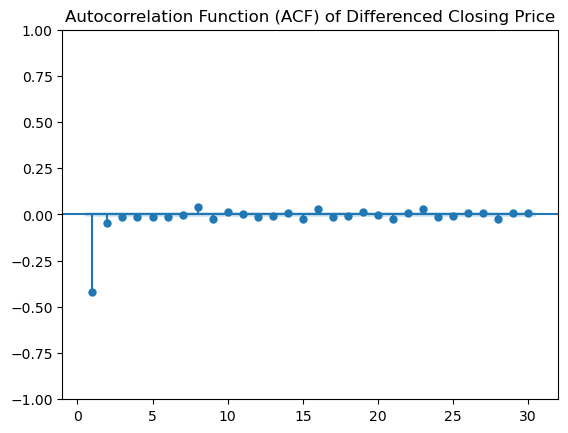

<Figure size 1400x700 with 0 Axes>

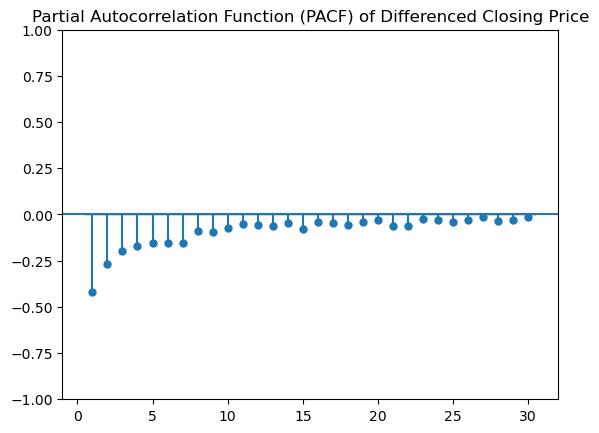

In [142]:
# Autocorrelation and Partial Autocorrelation Functions (ACF/PACF)
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.figure(figsize=(14, 7))
plot_acf(dataset['Closing Price_diff'], lags=30, zero=False)
plt.title('Autocorrelation Function (ACF) of Differenced Closing Price')
plt.show()
plt.figure(figsize=(14, 7))
plot_pacf(dataset['Closing Price_diff'], lags=30, zero=False)
plt.title('Partial Autocorrelation Function (PACF) of Differenced Closing Price')
plt.show()

C:\Users\Belayneh\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Belayneh\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Belayneh\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Belayneh\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters fou

                               SARIMAX Results                                
Dep. Variable:          Closing Price   No. Observations:                35807
Model:                 ARIMA(2, 2, 2)   Log Likelihood             -253330.315
Date:                Sun, 03 Mar 2024   AIC                         506670.630
Time:                        23:25:14   BIC                         506713.059
Sample:                             0   HQIC                        506684.130
                              - 35807                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1766      0.002    113.948      0.000       0.174       0.180
ar.L2          0.0229      0.002     13.982      0.000       0.020       0.026
ma.L1         -1.9581      0.001  -3045.685      0.0

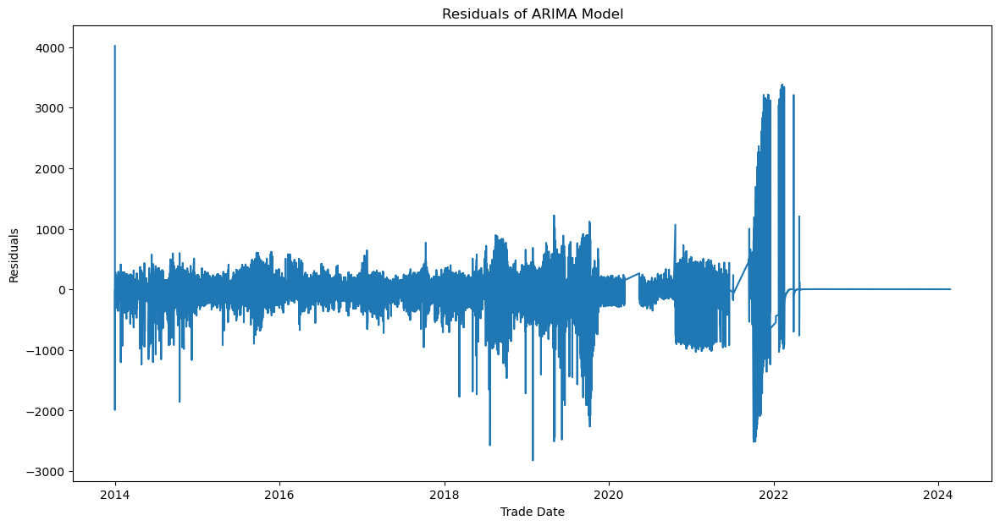

In [143]:
# ARIMA Model
from statsmodels.tsa.arima.model import ARIMA
# Replace p, d, and q with appropriate values
p, d, q = 2, 2, 2  # Replace with your chosen values
# Fit ARIMA model
model = ARIMA(dataset['Closing Price'], order=(p, d, q))
results = model.fit()
# Display model summary
print(results.summary())
# Plot residuals
residuals = results.resid
plt.figure(figsize=(14, 7))
plt.plot(residuals)
plt.title('Residuals of ARIMA Model')
plt.xlabel('Trade Date')
plt.ylabel('Residuals')
plt.show()

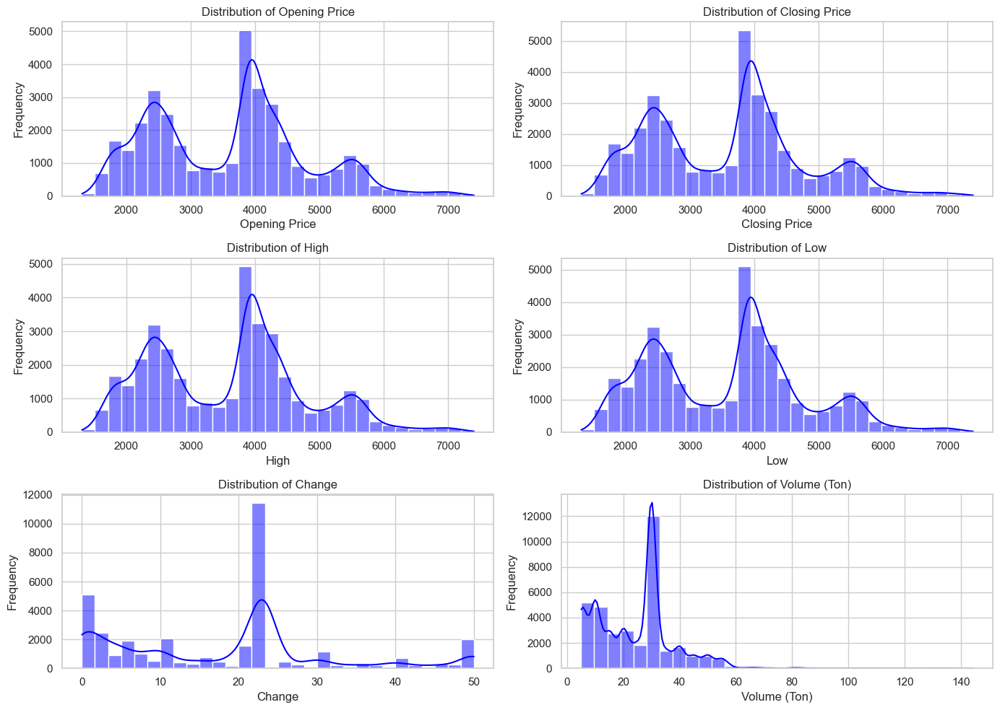

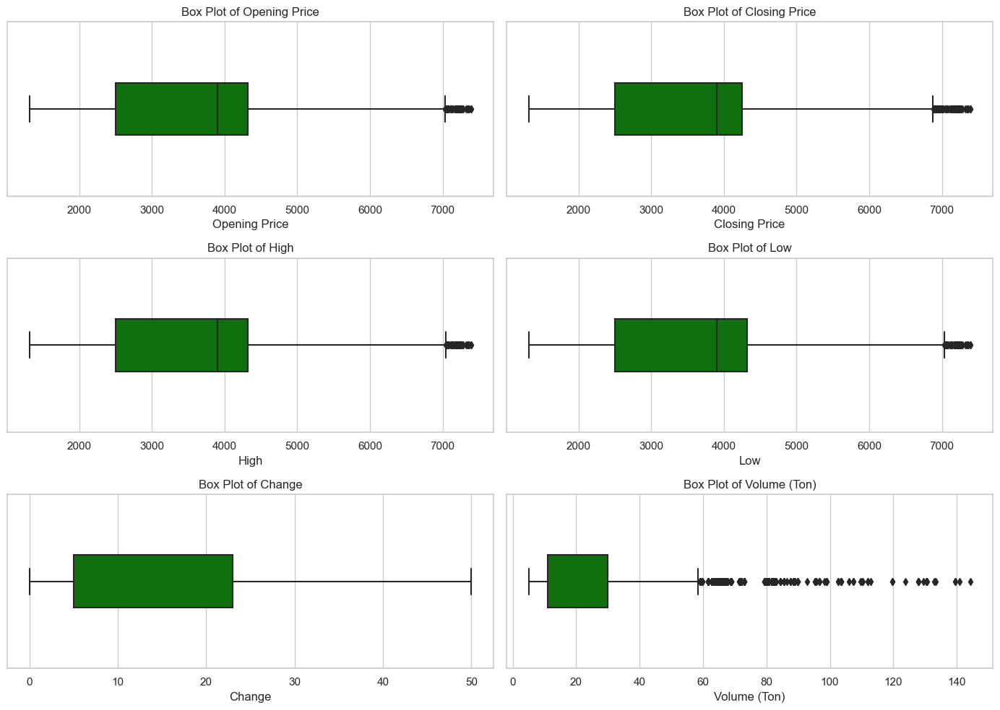

In [144]:
import seaborn as sns
# Set the style for better visualization
sns.set(style="whitegrid")
# Plot histograms for 'Closing Price' and other numeric columns
numeric_columns = ['Opening Price', 'Closing Price', 'High', 'Low', 'Change', 'Volume (Ton)']
plt.figure(figsize=(14, 10))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(3, 2, i)
    sns.histplot(dataset[column], kde=True, bins=30, color='blue')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()
# Plot box plots for 'Closing Price' and other numeric columns
plt.figure(figsize=(14, 10))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(3, 2, i)
    sns.boxplot(x=dataset[column], color='green', width=0.3)
    plt.title(f'Box Plot of {column}')
    plt.xlabel(column)
plt.tight_layout()
plt.show()

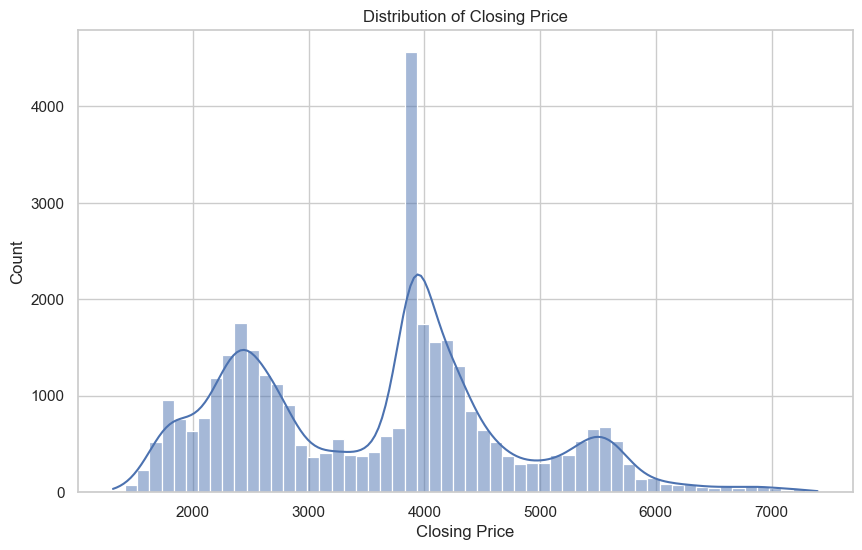

In [145]:
plt.figure(figsize=(10, 6))
sns.histplot(dataset['Closing Price'], kde=True)
plt.title('Distribution of Closing Price')
plt.show()

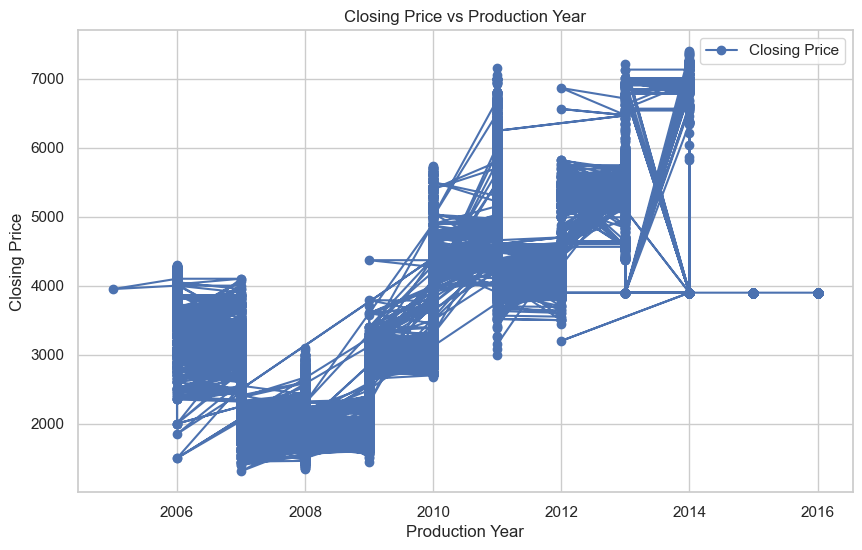

In [146]:
plt.figure(figsize=(10, 6))
plt.plot(dataset['Production year'], dataset['Closing Price'], marker='o', linestyle='-', color='b', label='Closing Price')
plt.title('Closing Price vs Production Year')
plt.xlabel('Production Year')
plt.ylabel('Closing Price')
plt.legend()
plt.show()

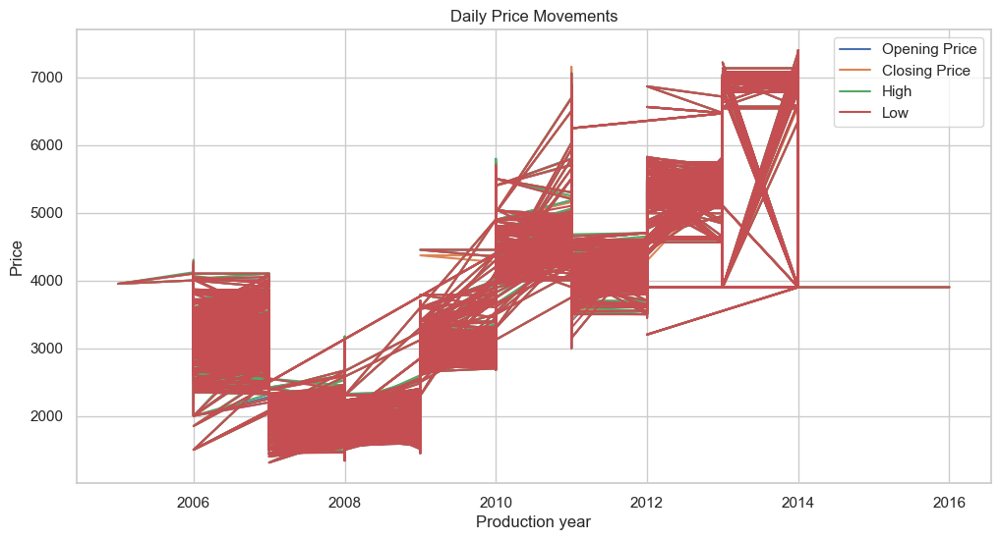

In [147]:
# Research Question 1: Analyze daily price movements
plt.figure(figsize=(12, 6))
plt.plot(dataset['Production year'], dataset['Opening Price'], label='Opening Price')
plt.plot(dataset['Production year'], dataset['Closing Price'], label='Closing Price')
plt.plot(dataset['Production year'], dataset['High'], label='High')
plt.plot(dataset['Production year'], dataset['Low'], label='Low')
plt.title('Daily Price Movements')
plt.xlabel('Production year')
plt.ylabel('Price')
plt.legend()
plt.show()

In [148]:
# Assuming you have already loaded the dataset into the 'df' DataFrame
# Convert 'Closing Price' to numeric
dataset['Production year'] = pd.to_numeric(dataset['Production year'], errors='coerce')
# Calculate correlation
correlation = dataset['Production year'].corr(dataset['Closing Price'])
# Print the result
print(f"Correlation between Production Year and Closing Price: {correlation}")

Correlation between Production Year and Closing Price: 0.5926905283031736


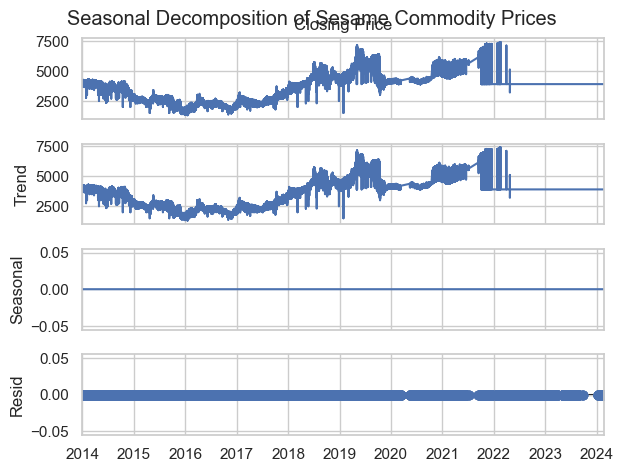

In [149]:
# Research Question 2: Identify and characterize recurring patterns or seasonality
# Convert 'Closing Price' to numeric
result = seasonal_decompose(dataset['Closing Price'], model='additive', period=1)
result.plot()
plt.suptitle('Seasonal Decomposition of Sesame Commodity Prices')
plt.show()

In [150]:
# Research Question 3: Impact of warehouse locations on prices
avg_price_by_warehouse = dataset.groupby('Warehouse')['Closing Price'].mean()
print(f"Average Closing Price by Warehouse:\n{avg_price_by_warehouse}")

Average Closing Price by Warehouse:
Warehouse
AJ    3567.574786
AS    3080.839873
BD    4145.074074
BU    3484.476931
Ds    4283.430423
GN    3733.682062
HU    3557.551259
MT    3691.833691
NK    3377.569059
NZ    3898.000000
PW    3626.486190
SG    3419.532151
SR    3319.909252
WG    4611.123007
Name: Closing Price, dtype: float64


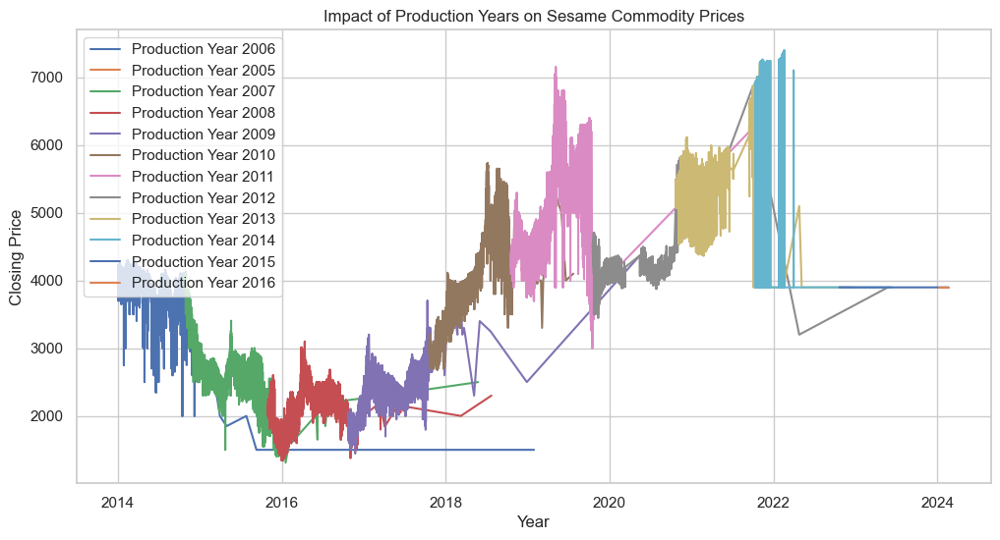

In [151]:
# Research Question 3: Impact of production years on price variations
plt.figure(figsize=(12, 6))
for year in dataset['Production year'].unique():
    subset = dataset[dataset['Production year'] == year]['Closing Price']
    plt.plot(subset.index, subset, label=f'Production Year {year}')
plt.title('Impact of Production Years on Sesame Commodity Prices')
plt.xlabel('Year')
plt.ylabel('Closing Price')
plt.legend()
plt.show()

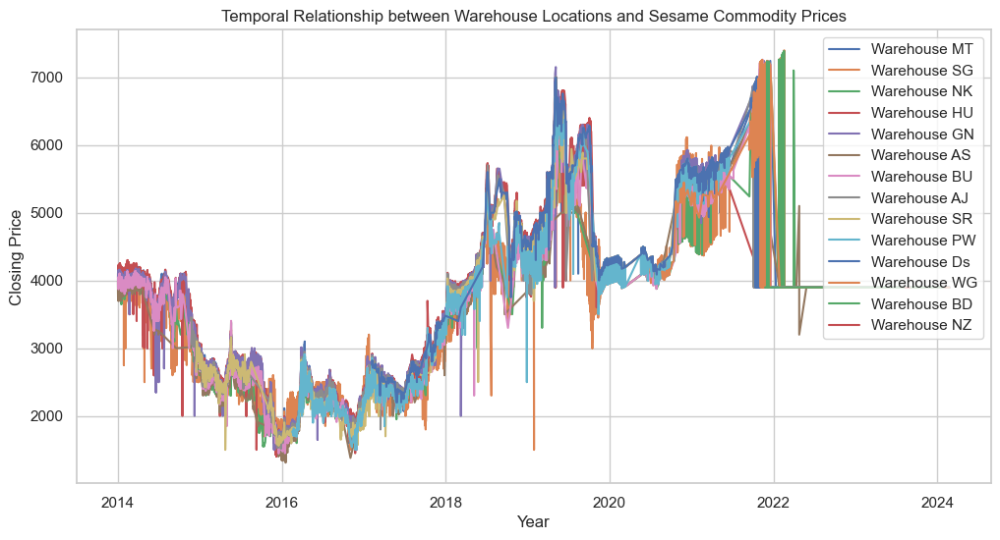

In [152]:
# Research Question 4: Temporal relationship between warehouse locations and price fluctuations
plt.figure(figsize=(12, 6))
for warehouse in dataset['Warehouse'].unique():
    subset = dataset[dataset['Warehouse'] == warehouse]['Closing Price']
    plt.plot(subset.index, subset, label=f'Warehouse {warehouse}')

plt.title('Temporal Relationship between Warehouse Locations and Sesame Commodity Prices')
plt.xlabel('Year')
plt.ylabel('Closing Price')
plt.legend()
plt.show()

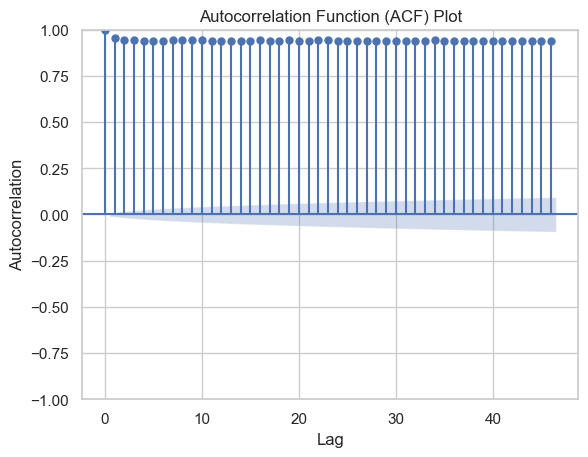

In [153]:
# Research Question 5: Model and predict future price movements
# You may choose a time series forecasting method like ARIMA, SARIMA, or machine learning models.
# Autocorrelation Function (ACF) plot to identify potential lag values for modeling
plot_acf(dataset['Closing Price'])
plt.title('Autocorrelation Function (ACF) Plot')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

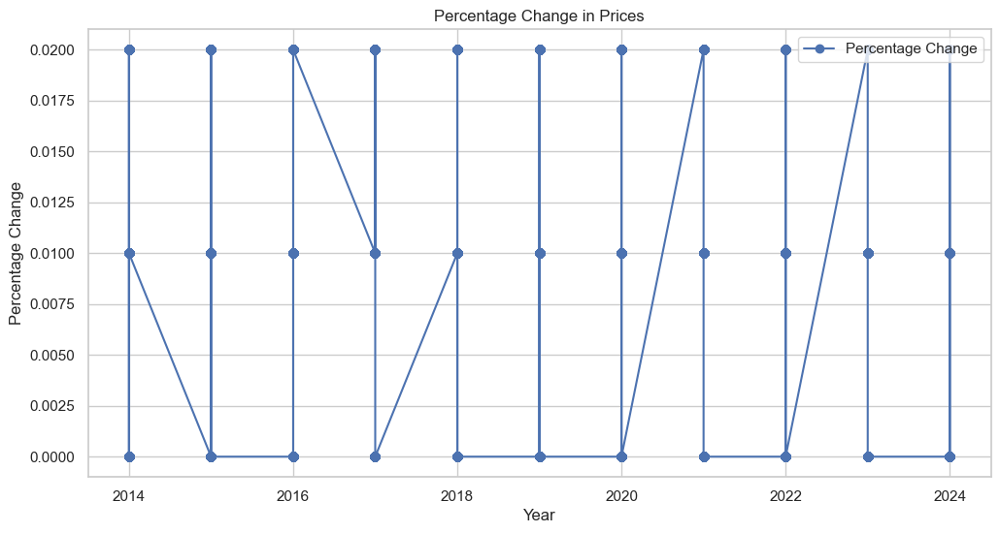

In [154]:
# Plot the percentage change
plt.figure(figsize=(12, 6))
plt.plot(dataset['Year'], dataset['Percentage Change'], label='Percentage Change', marker='o')
plt.title('Percentage Change in Prices')
plt.xlabel('Year')
plt.ylabel('Percentage Change')
plt.legend()
plt.show()

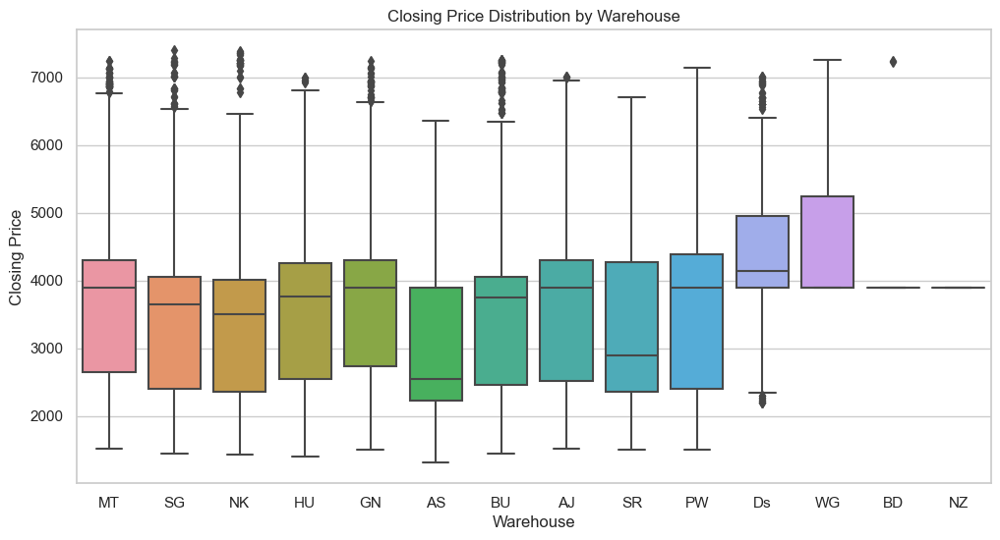

In [155]:
# Convert 'Closing Price' to numeric
# Boxplot for 'Closing Price' by 'Warehouse'
plt.figure(figsize=(12, 6))
sns.boxplot(x='Warehouse', y='Closing Price', data=dataset)
plt.title('Closing Price Distribution by Warehouse')
plt.show()

In [156]:
# Seasonality Analysis

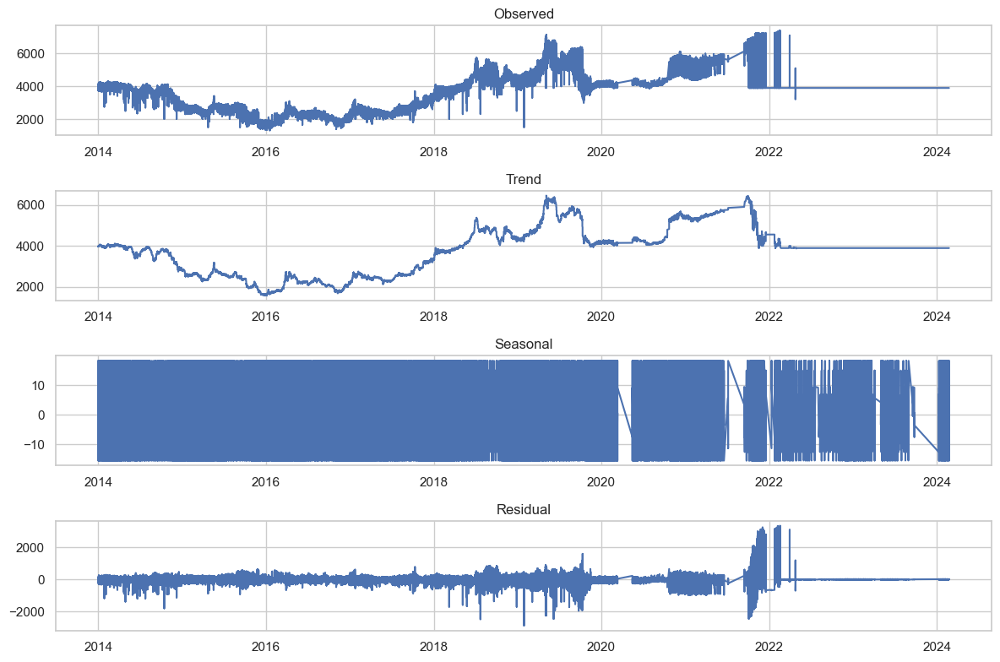

In [157]:
# Decompose the time series data to identify seasonal patterns
result = seasonal_decompose(dataset['Closing Price'], model='additive', period=30)  # Assuming seasonality period of 30 days

# Plot the decomposed components
plt.figure(figsize=(12, 8))
plt.subplot(4, 1, 1)
plt.plot(result.observed)
plt.title('Observed')

plt.subplot(4, 1, 2)
plt.plot(result.trend)
plt.title('Trend')

plt.subplot(4, 1, 3)
plt.plot(result.seasonal)
plt.title('Seasonal')

plt.subplot(4, 1, 4)
plt.plot(result.resid)
plt.title('Residual')

plt.tight_layout()
plt.show()


# Model Development

In [158]:
#dataset.drop(columns=['Trade Date'], inplace=True)

In [159]:
from sklearn.preprocessing import LabelEncoder
# Create a LabelEncoder instance
label_encoder = LabelEncoder()
# Apply LabelEncoder to 'Symbol' column
dataset['Symbol'] = label_encoder.fit_transform(dataset['Symbol'])
# Check the mapping of original values to numerical values
symbol_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Mapping of 'Symbol' values:", symbol_mapping)

Mapping of 'Symbol' values: {'MHGS3': 0, 'MHGS4': 1, 'MHGSUG': 2, 'MRSS3': 3, 'MRSS4': 4, 'MRSSUG': 5, 'MWSS3': 6, 'MWSS4': 7, 'MWSS5': 8, 'MWSSUG': 9, 'RDSS2': 10, 'RDSS3': 11, 'RDSS4': 12, 'RDSS5': 13, 'RDSSUG': 14, 'WHGS1': 15, 'WHGS2': 16, 'WHGS3': 17, 'WHGS4': 18, 'WHGS5': 19, 'WHGSUG': 20, 'WWSS2': 21, 'WWSS3': 22, 'WWSS4': 23, 'WWSS5': 24, 'WWSSUG': 25}


In [160]:
# LabelEncoder
from sklearn.preprocessing import LabelEncoder
# Create a LabelEncoder instance
label_encoder = LabelEncoder()
# Apply LabelEncoder to 'Warehouse' column
dataset['Warehouse'] = label_encoder.fit_transform(dataset['Warehouse'])
# Check the mapping of original values to numerical values
Warehouse_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Mapping of 'Warehouse' values:", Warehouse_mapping)

Mapping of 'Warehouse' values: {'AJ': 0, 'AS': 1, 'BD': 2, 'BU': 3, 'Ds': 4, 'GN': 5, 'HU': 6, 'MT': 7, 'NK': 8, 'NZ': 9, 'PW': 10, 'SG': 11, 'SR': 12, 'WG': 13}


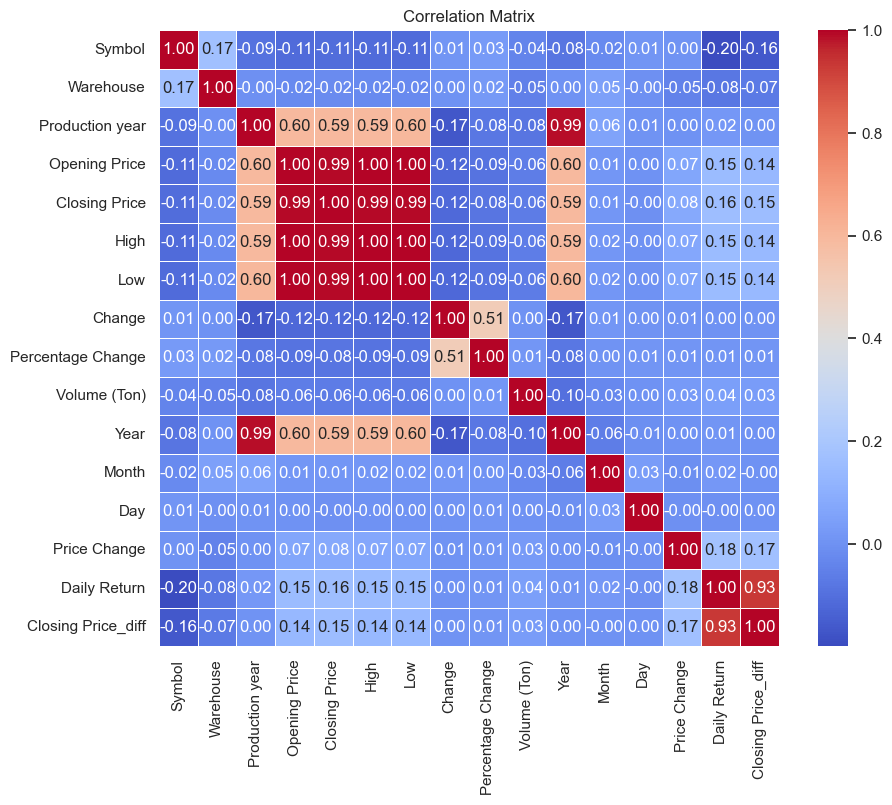

In [161]:
# Correlation Analysis
# Compute correlation matrix
correlation_matrix = dataset.corr()
# Visualize correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

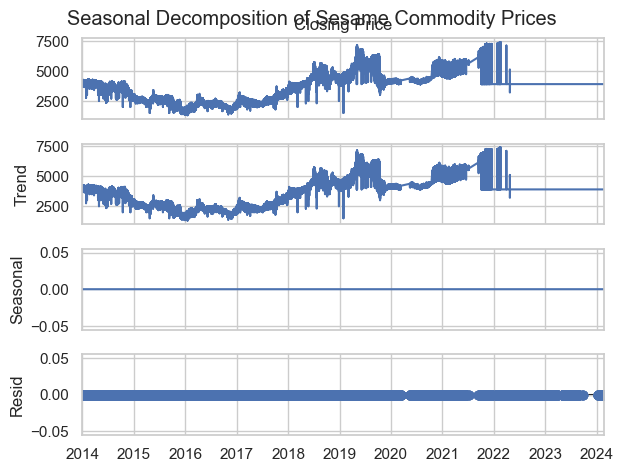

In [162]:
# Seasonal Decomposition
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(dataset['Closing Price'], model='additive', period=1)
result.plot()
plt.suptitle('Seasonal Decomposition of Sesame Commodity Prices')
plt.show()

In [163]:
# Stationarity Check
from statsmodels.tsa.stattools import adfuller
def check_stationarity(timeseries):
    result = adfuller(timeseries, autolag='AIC')
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print(f'Critical Values: {result[4]}')
check_stationarity(dataset['Closing Price'])

ADF Statistic: -1.3616619122072229
p-value: 0.6005117168936924
Critical Values: {'1%': -3.4305329152675634, '5%': -2.861620844081754, '10%': -2.5668130307545334}


ADF Statistic: -38.61397185665898
p-value: 0.0
Critical Values: {'1%': -3.4305329203841555, '5%': -2.861620846343093, '10%': -2.566813031958185}


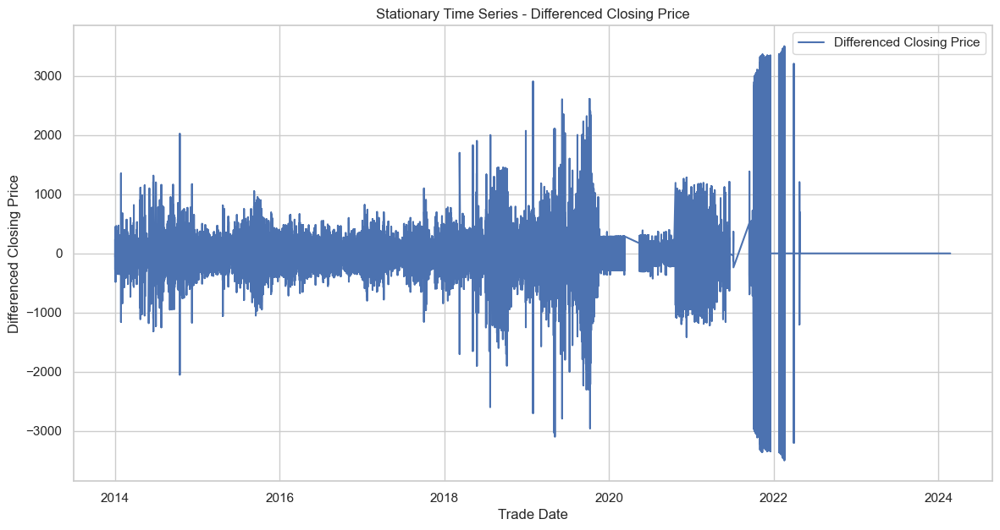

In [164]:
# Make the Time Series Stationary
# Differencing
dataset['Closing Price_diff'] = dataset['Closing Price'] - dataset['Closing Price'].shift(1)
dataset.dropna(inplace=True)
# Check stationarity again
check_stationarity(dataset['Closing Price_diff'])
# Plot differenced time series
plt.figure(figsize=(14, 7))
plt.plot(dataset['Closing Price_diff'], label='Differenced Closing Price')
plt.title('Stationary Time Series - Differenced Closing Price')
plt.xlabel('Trade Date')
plt.ylabel('Differenced Closing Price')
plt.legend()
plt.show()

<Figure size 1400x700 with 0 Axes>

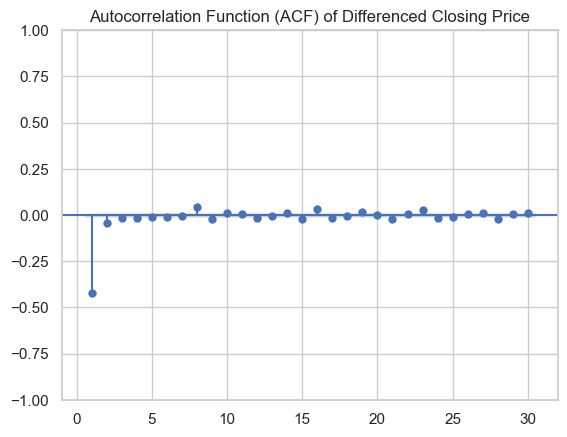

<Figure size 1400x700 with 0 Axes>

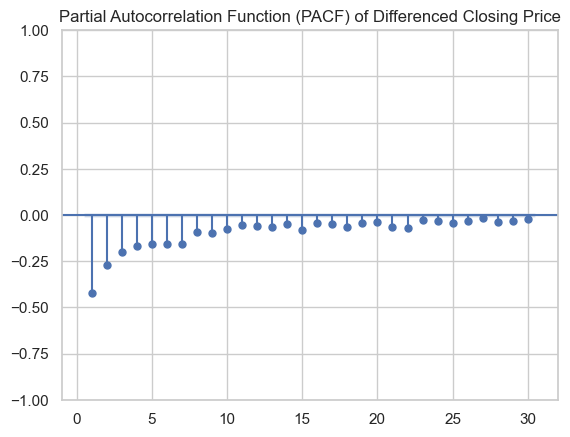

In [165]:
# Autocorrelation and Partial Autocorrelation Functions (ACF/PACF)
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.figure(figsize=(14, 7))
plot_acf(dataset['Closing Price_diff'], lags=30, zero=False)
plt.title('Autocorrelation Function (ACF) of Differenced Closing Price')
plt.show()
plt.figure(figsize=(14, 7))
plot_pacf(dataset['Closing Price_diff'], lags=30, zero=False)
plt.title('Partial Autocorrelation Function (PACF) of Differenced Closing Price')
plt.show()

C:\Users\Belayneh\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Belayneh\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Belayneh\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Belayneh\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters fou

                               SARIMAX Results                                
Dep. Variable:          Closing Price   No. Observations:                35806
Model:                 ARIMA(2, 2, 2)   Log Likelihood             -253323.745
Date:                Sun, 03 Mar 2024   AIC                         506657.491
Time:                        23:26:18   BIC                         506699.920
Sample:                             0   HQIC                        506670.991
                              - 35806                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1781      0.002    115.335      0.000       0.175       0.181
ar.L2          0.0232      0.002     14.271      0.000       0.020       0.026
ma.L1         -1.9583      0.001  -3060.248      0.0

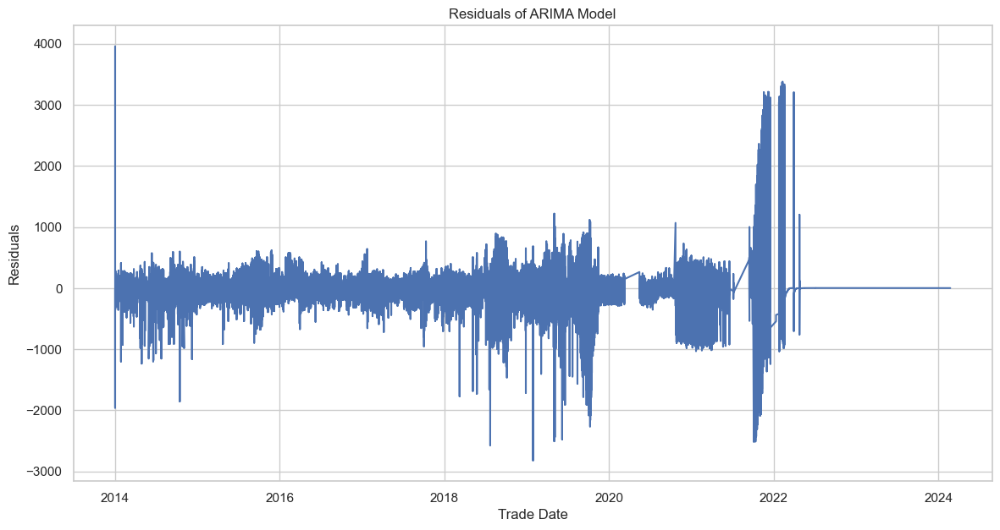

In [166]:
# ARIMA Model
from statsmodels.tsa.arima.model import ARIMA
# Replace p, d, and q with appropriate values
p, d, q = 2, 2, 2  # Replace with your chosen values
# Fit ARIMA model
model = ARIMA(dataset['Closing Price'], order=(p, d, q))
results = model.fit()
# Display model summary
print(results.summary())
# Plot residuals
residuals = results.resid
plt.figure(figsize=(14, 7))
plt.plot(residuals)
plt.title('Residuals of ARIMA Model')
plt.xlabel('Trade Date')
plt.ylabel('Residuals')
plt.show()

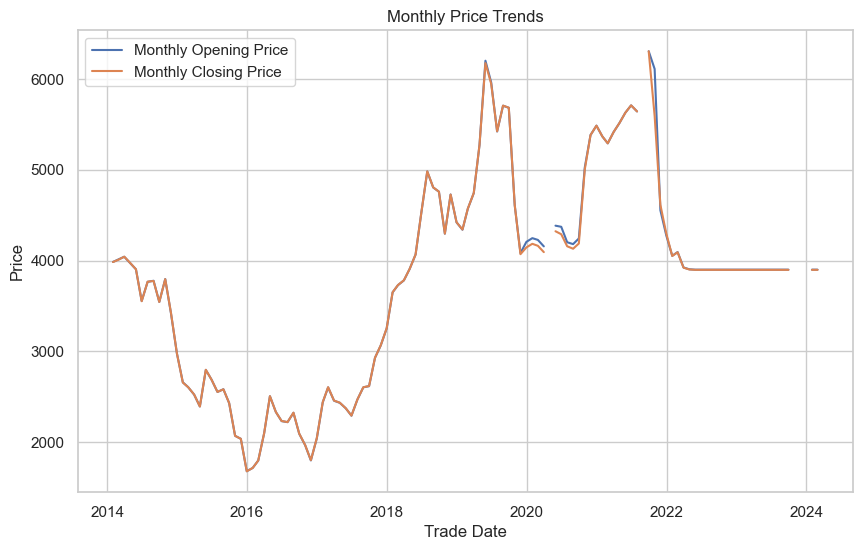

In [167]:
# Analyzing trends over different time periods (e.g., monthly)
monthly_prices = dataset.resample('M').mean()

plt.figure(figsize=(10, 6))
plt.plot(monthly_prices.index, monthly_prices['Opening Price'], label='Monthly Opening Price')
plt.plot(monthly_prices.index, monthly_prices['Closing Price'], label='Monthly Closing Price')
plt.title('Monthly Price Trends')
plt.xlabel('Trade Date')
plt.ylabel('Price')
plt.legend()
plt.show()

In [168]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [169]:
X = dataset.drop('Closing Price', axis=1)
y = dataset['Closing Price']

In [170]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [171]:
from sklearn.ensemble import RandomForestRegressor
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

RandomForestRegressor()

In [172]:
# Predict on the testing set
y_pred = rf_model.predict(X_test)

In [173]:
# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)

In [174]:
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)

Mean Squared Error (MSE): 188.49973244903643
Mean Absolute Error (MAE): 3.8045908963976642
Root Mean Squared Error (RMSE): 13.72952047411112


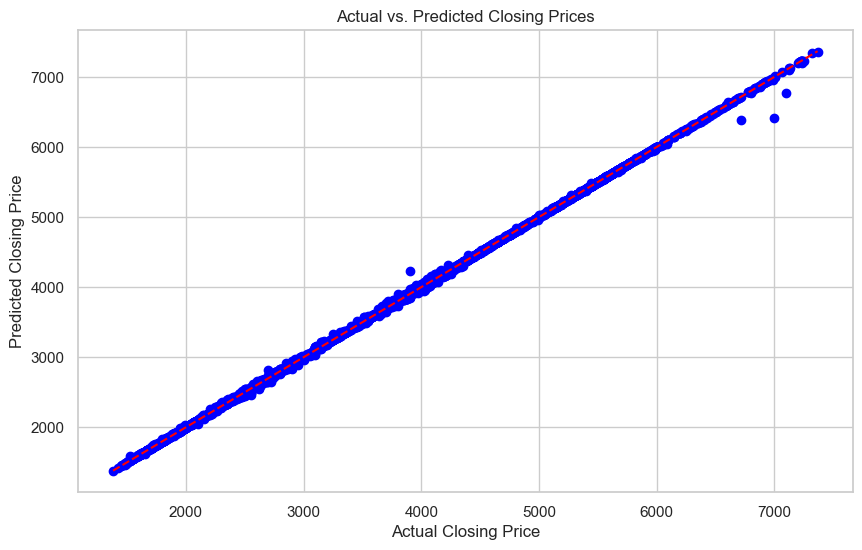

In [175]:
# Visualize predicted vs. actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title('Actual vs. Predicted Closing Prices')
plt.xlabel('Actual Closing Price')
plt.ylabel('Predicted Closing Price')
plt.show()

In [176]:
from sklearn.linear_model import LinearRegression
li_model = LinearRegression()
li_model.fit(X_train, y_train)

LinearRegression()

In [177]:
# Predict on the testing set
y_pred = li_model.predict(X_test)

In [178]:
# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)

In [179]:
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)

Mean Squared Error (MSE): 10047.481838331447
Mean Absolute Error (MAE): 28.265828371804307
Root Mean Squared Error (RMSE): 100.23712804311307


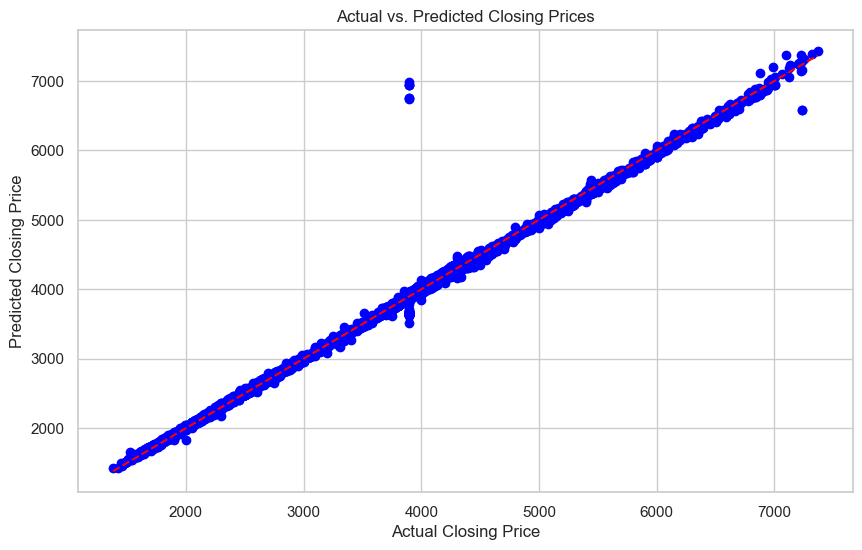

In [180]:
# Visualize predicted vs. actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title('Actual vs. Predicted Closing Prices')
plt.xlabel('Actual Closing Price')
plt.ylabel('Predicted Closing Price')
plt.show()

In [181]:
from sklearn.ensemble import GradientBoostingRegressor
GBR_model = GradientBoostingRegressor()
GBR_model.fit(X_train, y_train)

GradientBoostingRegressor()

In [182]:
# Predict on the testing set
y_pred = GBR_model.predict(X_test)

In [183]:
# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)

In [184]:
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)

Mean Squared Error (MSE): 710.3139003279057
Mean Absolute Error (MAE): 13.633042902624048
Root Mean Squared Error (RMSE): 26.651714772747845


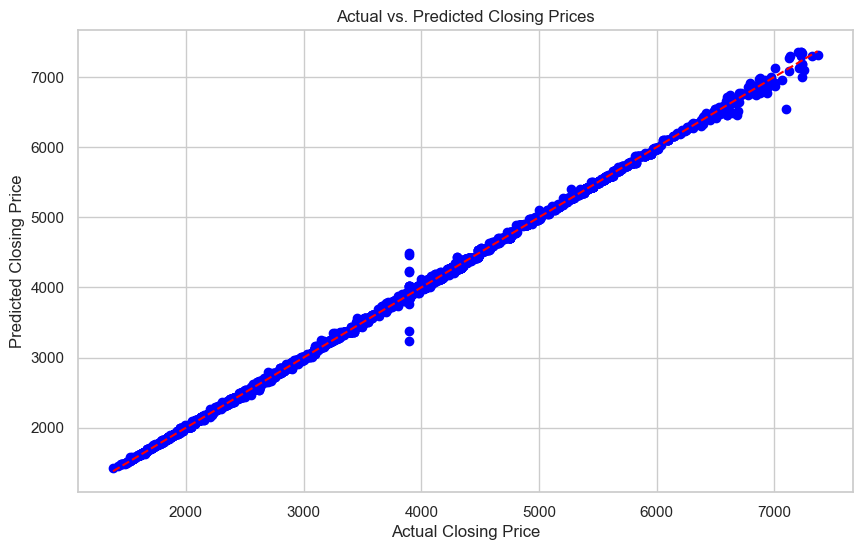

In [185]:
# Visualize predicted vs. actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title('Actual vs. Predicted Closing Prices')
plt.xlabel('Actual Closing Price')
plt.ylabel('Predicted Closing Price')
plt.show()

In [186]:
from sklearn.tree import DecisionTreeRegressor
DT_model = DecisionTreeRegressor()
DT_model.fit(X_train, y_train)

DecisionTreeRegressor()

In [187]:
# Predict on the testing set
y_pred = DT_model.predict(X_test)

In [188]:
# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)

In [189]:
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)

Mean Squared Error (MSE): 1290.2189332588662
Mean Absolute Error (MAE): 4.932700363027087
Root Mean Squared Error (RMSE): 35.91961766582248


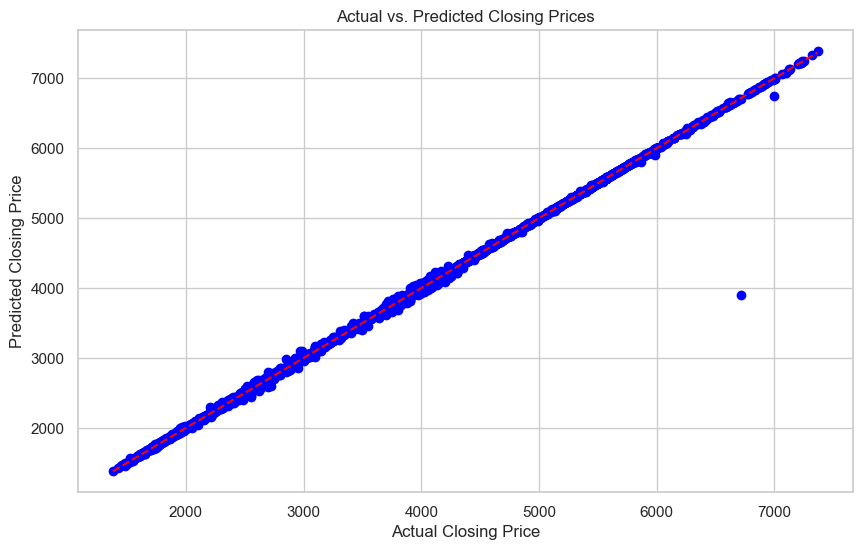

In [190]:
# Visualize predicted vs. actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title('Actual vs. Predicted Closing Prices')
plt.xlabel('Actual Closing Price')
plt.ylabel('Predicted Closing Price')
plt.show()

In [191]:
from sklearn.svm import SVR
SVM_model = SVR()
SVM_model.fit(X_train, y_train)

SVR()

In [192]:
# Predict on the testing set
y_pred = SVM_model.predict(X_test)

In [193]:
# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)

In [194]:
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)

Mean Squared Error (MSE): 44321.11978013956
Mean Absolute Error (MAE): 91.1815936001281
Root Mean Squared Error (RMSE): 210.5258173719783


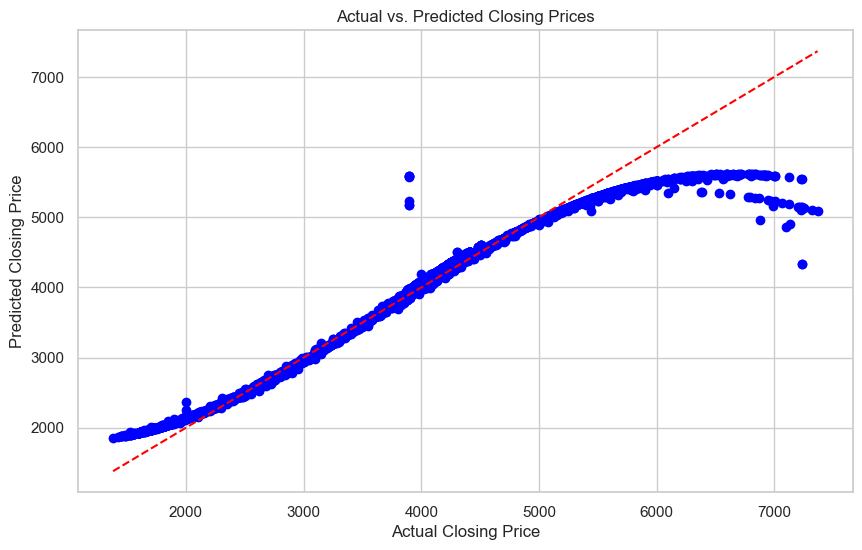

In [195]:
# Visualize predicted vs. actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title('Actual vs. Predicted Closing Prices')
plt.xlabel('Actual Closing Price')
plt.ylabel('Predicted Closing Price')
plt.show()

In [196]:
from sklearn.neighbors import KNeighborsRegressor
KNN_model = KNeighborsRegressor()
KNN_model.fit(X_train, y_train)

KNeighborsRegressor()

In [197]:
# Predict on the testing set
y_pred = KNN_model.predict(X_test)

In [198]:
# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)

In [199]:
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("Root Mean Squared Error (RMSE):", rmse)

Mean Squared Error (MSE): 1595.9281541468863
Mean Absolute Error (MAE): 10.966824909243224
Root Mean Squared Error (RMSE): 39.94906950289188


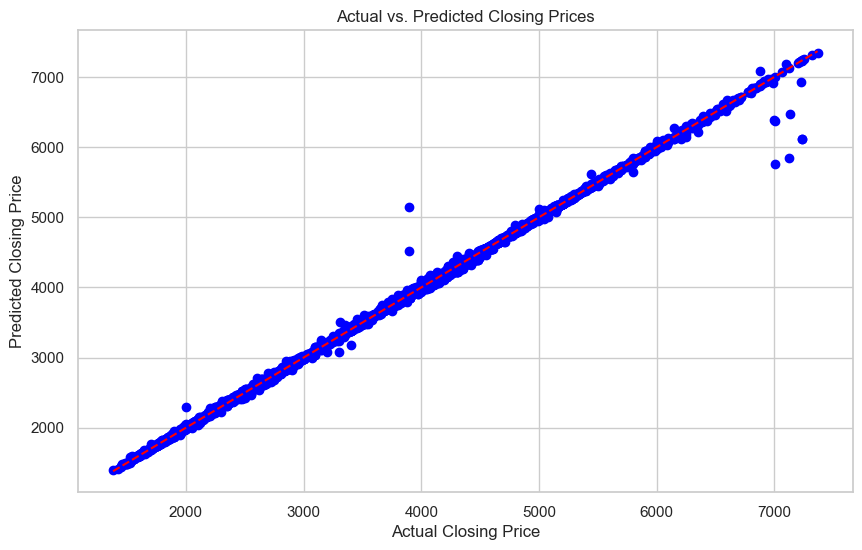

In [200]:
# Visualize predicted vs. actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title('Actual vs. Predicted Closing Prices')
plt.xlabel('Actual Closing Price')
plt.ylabel('Predicted Closing Price')
plt.show()

In [201]:
# Correlation matrix
correlation_matrix = dataset.corr()
print("Correlation Matrix:\n", correlation_matrix)

Correlation Matrix:
                       Symbol  Warehouse  Production year  Opening Price  \
Symbol              1.000000   0.168230        -0.093232      -0.109754   
Warehouse           0.168230   1.000000        -0.004685      -0.021078   
Production year    -0.093232  -0.004685         1.000000       0.596718   
Opening Price      -0.109754  -0.021078         0.596718       1.000000   
Closing Price      -0.107945  -0.019067         0.592726       0.993655   
High               -0.109745  -0.021228         0.594441       0.998648   
Low                -0.109790  -0.021206         0.599213       0.999613   
Change              0.011059   0.001660        -0.168142      -0.120920   
Percentage Change   0.026245   0.023743        -0.080300      -0.088420   
Volume (Ton)       -0.041184  -0.052538        -0.082630      -0.062656   
Year               -0.081803   0.000371         0.986303       0.596611   
Month              -0.023614   0.045974         0.058614       0.014775   
Day 

# Correlation Analysis:

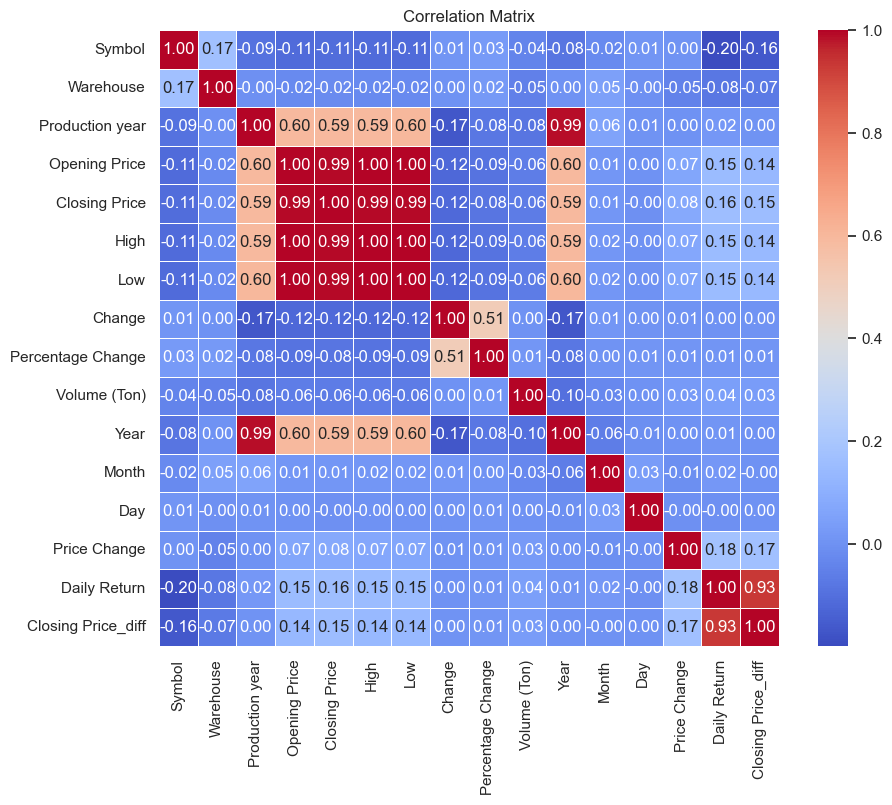

In [202]:
# Correlation Analysis
# Compute correlation matrix
correlation_matrix = dataset.corr()
# Visualize correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


# ARIMA (AutoRegressive Integrated Moving Average):

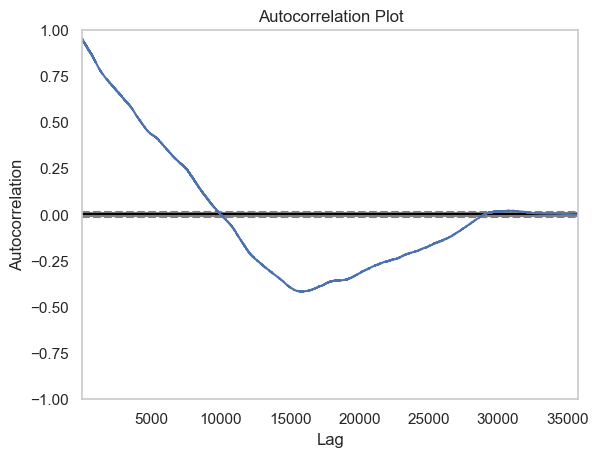

C:\Users\Belayneh\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Belayneh\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Belayneh\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\Belayneh\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction

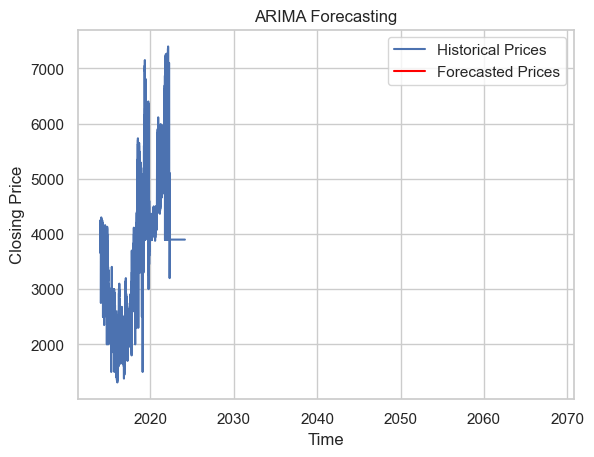

In [203]:
from statsmodels.tsa.arima.model import ARIMA
from pandas.plotting import autocorrelation_plot

# Visualize the autocorrelation plot to determine the parameters (p, d, q) for ARIMA
autocorrelation_plot(dataset['Closing Price'])
plt.title('Autocorrelation Plot')
plt.show()

# Fit ARIMA model
model_arima = ARIMA(dataset['Closing Price'], order=(5,1,0))  # Example order (p, d, q)
model_arima_fit = model_arima.fit()

# Forecast future prices
forecast_arima = model_arima_fit.forecast(steps=10)  # Example forecast for the next 10 time points

# Plot the forecasted prices
plt.plot(dataset.index, dataset['Closing Price'], label='Historical Prices')
plt.plot(np.arange(len(dataset), len(dataset) + len(forecast_arima)), forecast_arima, color='red', label='Forecasted Prices')
plt.title('ARIMA Forecasting')
plt.xlabel('Time')
plt.ylabel('Closing Price')
plt.legend()
plt.show()


# Feature Importance

In [204]:
# Determine the importance of different features in predicting commodity prices
# Example: Train a Random Forest model and analyze feature importances
from sklearn.ensemble import RandomForestRegressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
feature_importances = rf_model.feature_importances_
print("Feature Importances:", feature_importances)


Feature Importances: [8.28136616e-04 2.40343127e-05 7.52980627e-05 8.87838625e-02
 5.65714118e-01 3.40773786e-01 6.98951591e-05 2.47676190e-05
 8.88059933e-05 4.10945591e-05 3.58189720e-04 3.79927701e-04
 6.14914247e-05 1.30583791e-03 1.47075444e-03]


# Cluster analysis

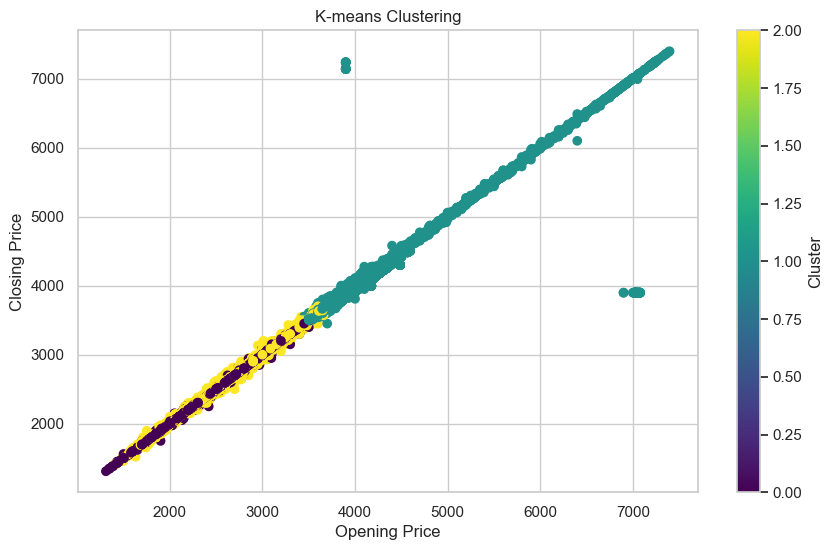

In [205]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Select relevant features for clustering
features_for_clustering = dataset[['Opening Price', 'Closing Price', 'High', 'Low', 'Volume (Ton)']]

# Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features_for_clustering)

# Choose the number of clusters (k)
k = 3  # Example: Choosing 3 clusters, but you can adjust this based on domain knowledge or evaluation metrics

# Initialize K-means model
kmeans = KMeans(n_clusters=k, random_state=42)

# Fit the model to the scaled data
kmeans.fit(scaled_features)

# Assign cluster labels to each data point
cluster_labels = kmeans.labels_

# Add cluster labels to the dataset
dataset['Cluster'] = cluster_labels

# Visualize the clusters (considering only two dimensions for visualization)
plt.figure(figsize=(10, 6))
plt.scatter(dataset['Opening Price'], dataset['Closing Price'], c=cluster_labels, cmap='viridis')
plt.title('K-means Clustering')
plt.xlabel('Opening Price')
plt.ylabel('Closing Price')
plt.colorbar(label='Cluster')
plt.show()
